
# 📘 Value Investor

## Overview

**Value Investor** is a data-driven project designed to support long-term investment decisions in emerging markets using intelligent time series analysis and deep learning methods. The project combines financial domain knowledge with modern AI to assess asset performance and identify undervalued opportunities.

---

## Data Description

The project utilizes **stock market data from portfolio companies operating in emerging markets**, spanning the year **2020** and the **first quarter of 2021**. Each company’s stock data is provided in a separate sheet, reflecting real-world conditions such as **asynchronous market operating days** influenced by national holidays, time zones, and exchange-specific schedules.

- **Training Data**: 2020 stock prices  
- **Prediction Target**: Q1 2021 stock prices  

---

## Project Steps

### 🔍 1. Exploratory Data Analysis (EDA)
We begin with a comprehensive exploratory analysis to:
- Understand each company’s price and volume trends.
- Identify missing data and align timeframes across markets.
- Examine volatility, trends, and seasonality that align with long-term value behavior.

### 🧠 2. Multimodal Modeling
To enhance predictive performance, we tested **multimodal models** that integrate **stock price time series** with **financial news headlines**. These models attempt to capture market sentiment and macroeconomic events alongside traditional price movements. While promising in concept, they introduced added complexity and moderate noise due to the difficulty of aligning textual data with financial time steps.

### 📈 3. Time Series Modeling
We implemented and benchmarked a variety of time series forecasting models, including:

- **Classical statistical methods**: ARIMA, SARIMAX, ARIMAX  
- **Deep learning models**: LSTM, FCN, CNN  
- **State-of-the-art frameworks**:  
  - **TimesFM**, a foundation model trained on diverse temporal patterns  
  - **Chronos**, an industrial-grade time series forecasting toolkit  
  - **LLaMA2-8B**, adapted for sequence prediction through fine-tuning

Despite the sophistication of large-scale models, results showed that **simple LSTM networks** consistently delivered the best trade-off between accuracy, generalization, and interpretability across all companies.

---

## Objective

The ultimate goal of the **Value Investor** project is to develop a **robust, intelligent investment decision-support system** that:
- Leverages historical stock price behavior,
- Aligns with value investing principles,
- Integrates relevant external signals like news sentiment,
- And improves capital allocation decisions in volatile emerging markets.

By combining structured EDA, cross-modal experimentation, and comparative model analysis, the project reveals that **simplicity and domain alignment often outperform raw model complexity**. The result is a refined tool that empowers long-term investors with clear, data-driven signals.

---

## ✅ Conclusion

Through comprehensive analysis, modeling, and experimentation, this project underscores a key insight: **pragmatic, interpretable models like LSTM can outperform more complex and resource-intensive alternatives** in real-world financial settings, especially in emerging markets with noisy or inconsistent data.

While transformer-based models and multimodal approaches offer theoretical promise, their performance is often sensitive to preprocessing and fine-tuning, making them less suitable for smaller, less-structured datasets. Conversely, LSTM models provided robust forecasts with lower computational demands and more explainable outputs.

In summary, **Value Investor** successfully delivers a scalable, intelligent decision-support tool for long-term investment, reaffirming the power of simplicity when grounded in strong domain understanding and solid data practices.


### Exploratory Data Analysis (EDA)

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from gnews import GNews

In [ ]:
# Load Excel file
file_path = '/content/2020Q1Q2Q3Q4-2021Q1.xlsx'
xls = pd.ExcelFile(file_path)
sheet_names = xls.sheet_names

In [ ]:
# Dictionary to store cleaned data from each sheet
stock_data = {}

# Load and clean data from each sheet
for sheet in sheet_names:
    df = pd.read_excel(xls, sheet_name=sheet)

    # Drop columns with all NaN values and forward fill missing dates
    df = df.dropna(axis=1, how='all')

    # Ensure 'Date' column exists and parse dates
    if 'Date' not in df.columns:
        continue
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    df = df.dropna(subset=['Date'])
    df.set_index('Date', inplace=True)

    # Store cleaned DataFrame
    stock_data[sheet.strip()] = df

In [ ]:
# Example: EDA for one company
example_company = list(stock_data.keys())[0]
df = stock_data[example_company]

Plot Russia-Sberbank Rossi PAO as the sample

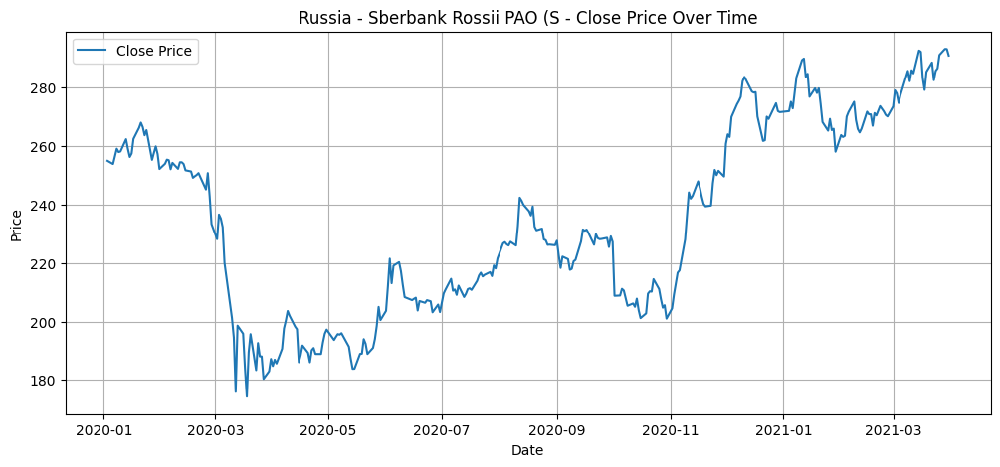

In [ ]:
# Plot Closing Prices
plt.figure(figsize=(12, 5))
plt.plot(df['Price'], label='Close Price')
plt.title(f'{example_company} - Close Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

Plot all stocks data price

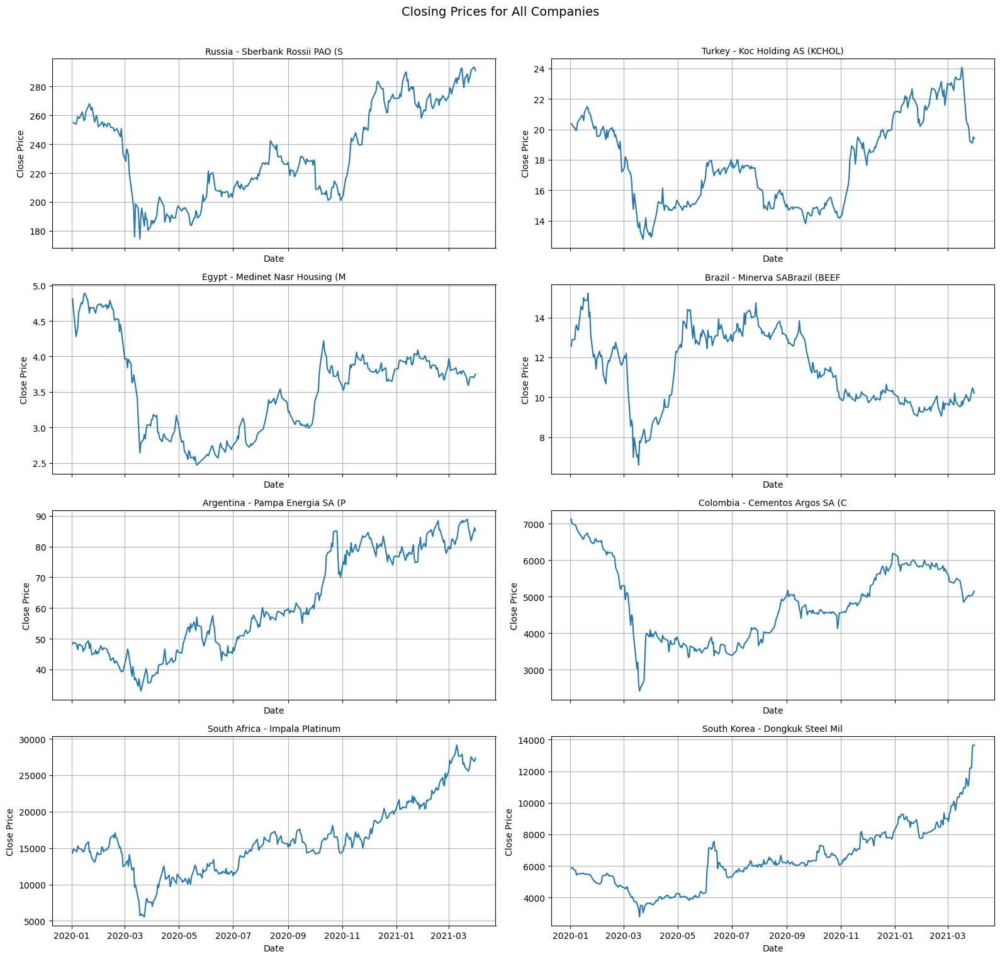

In [ ]:
# Setup subplots
num_companies = len(stock_data)
cols = 2
rows = (num_companies + 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows), sharex=True)
axes = axes.flatten()

# Plot each company's closing price
for i, (company, df) in enumerate(stock_data.items()):
    if 'Price' in df.columns:
        axes[i].plot(df['Price'])
        axes[i].set_title(company, fontsize=10)
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel('Close Price')
        axes[i].grid(True)

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Closing Prices for All Companies', fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

We can observe some repetive patterns in all stocks behavior such as temporal drop between 2020-02 to 2020-03. Although, the seasonalities or even trends have significant lags and they have different intervals for declines and growth.

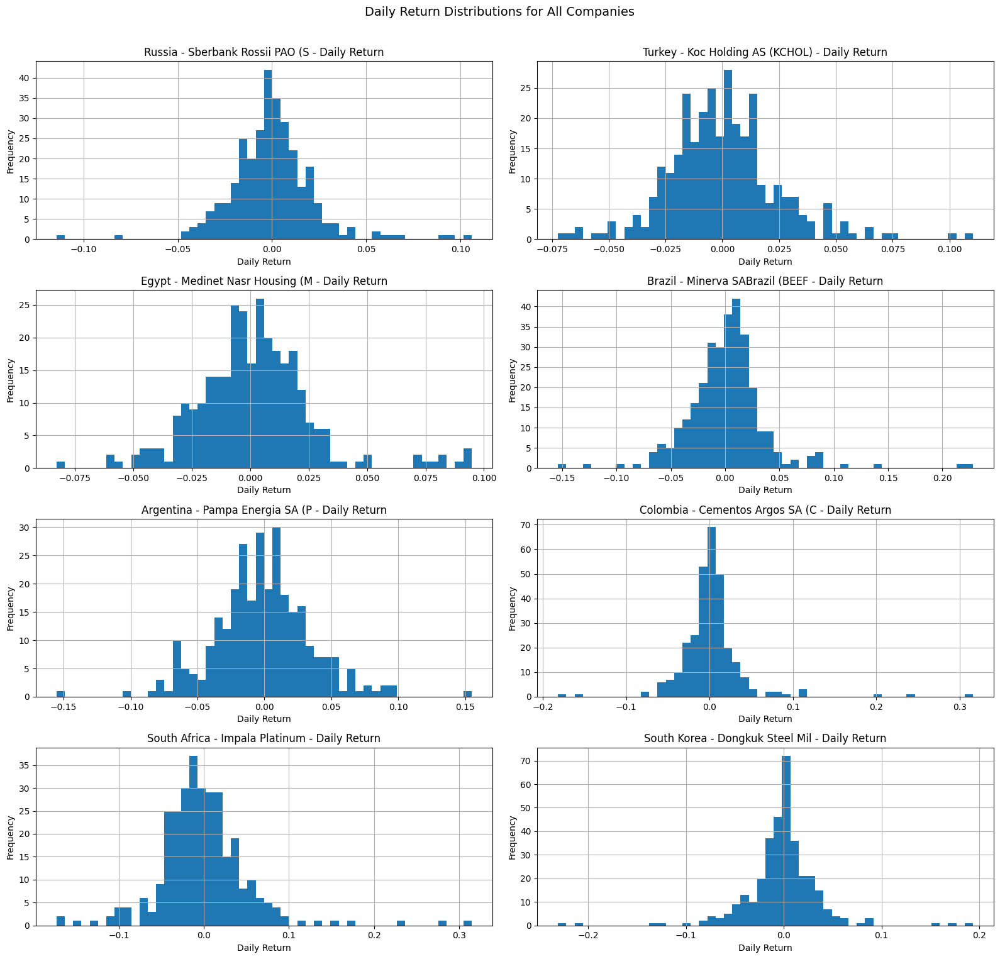

In [ ]:
# Setup subplots
num_companies = len(stock_data)
cols = 2
rows = (num_companies + 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
axes = axes.flatten()

# Compute and plot daily returns
for i, (company, df) in enumerate(stock_data.items()):
    if 'Price' in df.columns:
        df['Daily_Return'] = df['Price'].pct_change()
        axes[i].hist(df['Daily_Return'].dropna(), bins=50)
        axes[i].set_title(f'{company} - Daily Return')
        axes[i].set_xlabel('Daily Return')
        axes[i].set_ylabel('Frequency')
        axes[i].grid(True)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Daily Return Distributions for All Companies', fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

Daily return distributions generaly follow normal distribution with the center of zero that reveals a balance in returns for this stoch. Although for South Africa, the median is slightly lower than zero which reveals the negative balance in daily return.
All stocks have outliers; however, the outliers of Turkey Koc Holding and Egypt Midnet Nasr are significantly more than others and it may lead to unreliable prediction for their return.

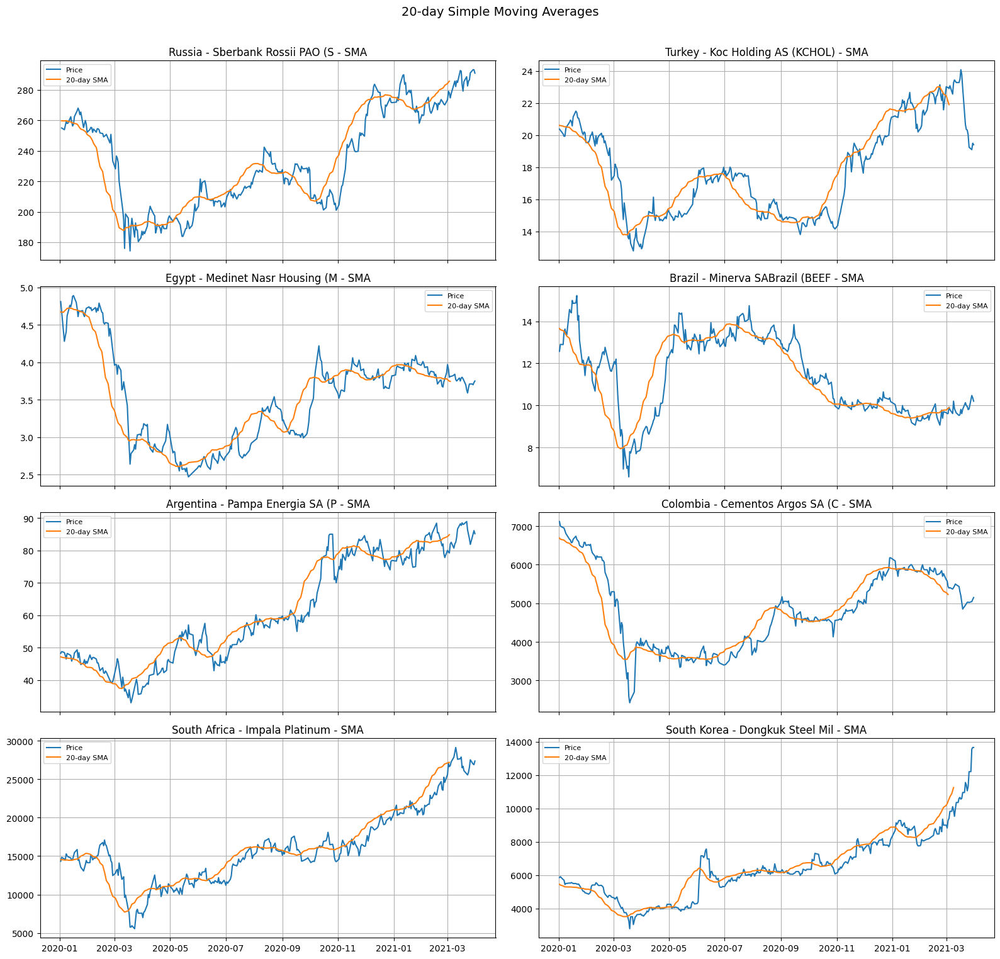

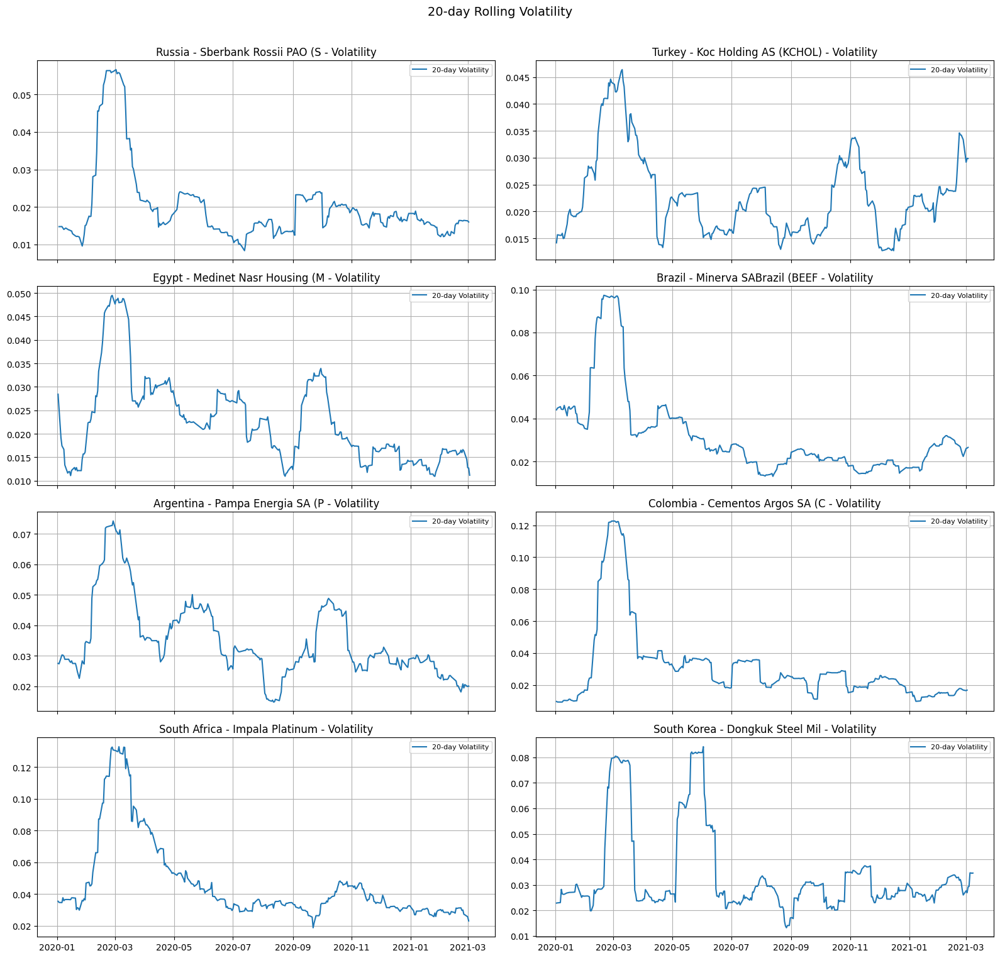

In [ ]:
# Create subplots for SMA and Volatility for all companies
fig_sma, axes_sma = plt.subplots(rows, cols, figsize=(16, 4 * rows), sharex=True)
fig_vol, axes_vol = plt.subplots(rows, cols, figsize=(16, 4 * rows), sharex=True)

axes_sma = axes_sma.flatten()
axes_vol = axes_vol.flatten()

for i, (company, df) in enumerate(stock_data.items()):
    if 'Price' in df.columns:
        df['Daily_Return'] = df['Price'].pct_change()
        df['SMA_20'] = df['Price'].rolling(window=20).mean()
        df['Volatility'] = df['Daily_Return'].rolling(window=20).std()

        # SMA plot
        axes_sma[i].plot(df['Price'], label='Price')
        axes_sma[i].plot(df['SMA_20'], label='20-day SMA')
        axes_sma[i].set_title(f'{company} - SMA')
        axes_sma[i].grid(True)
        axes_sma[i].legend(fontsize=8)

        # Volatility plot
        axes_vol[i].plot(df['Volatility'], label='20-day Volatility')
        axes_vol[i].set_title(f'{company} - Volatility')
        axes_vol[i].grid(True)
        axes_vol[i].legend(fontsize=8)

# Remove unused axes
for j in range(i + 1, len(axes_sma)):
    fig_sma.delaxes(axes_sma[j])
    fig_vol.delaxes(axes_vol[j])

# Final layout adjustments
fig_sma.suptitle('20-day Simple Moving Averages', fontsize=14)
fig_vol.suptitle('20-day Rolling Volatility', fontsize=14)
fig_sma.tight_layout(rect=[0, 0.03, 1, 0.97])
fig_vol.tight_layout(rect=[0, 0.03, 1, 0.97])

plt.show()

### Trends data representation for stock prices

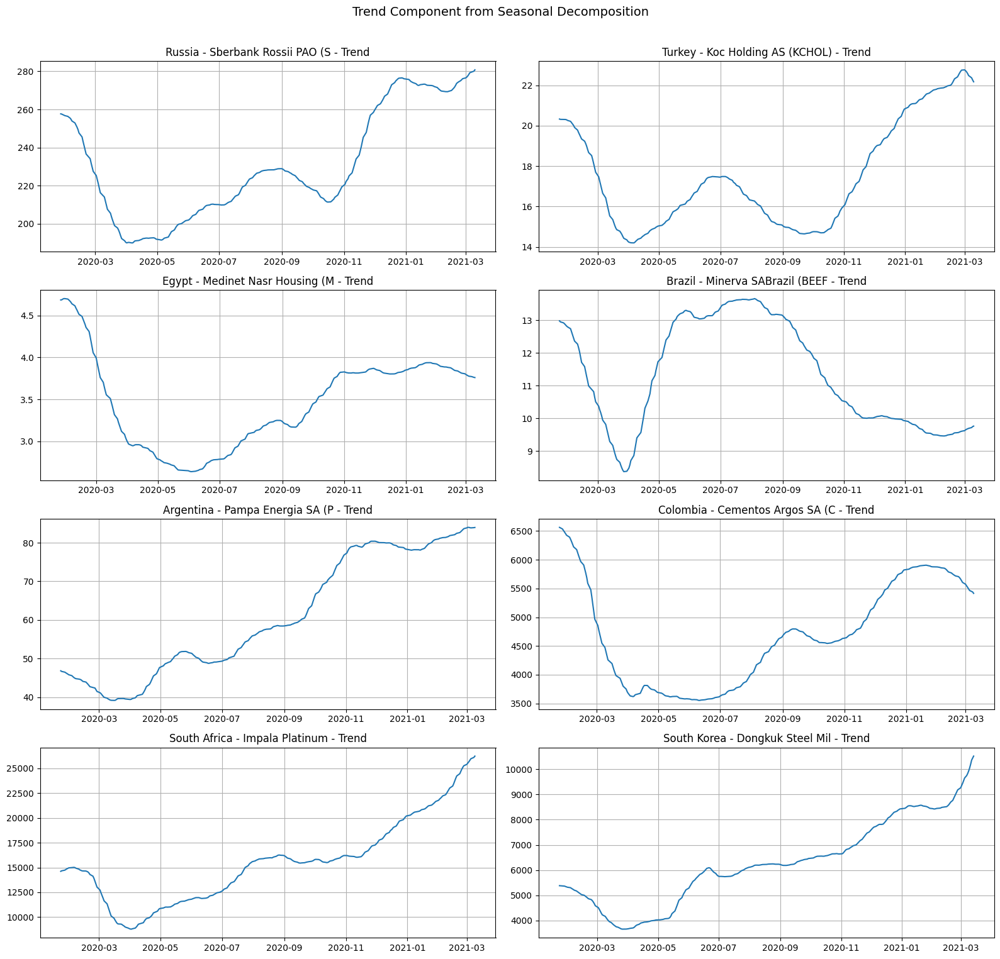

In [ ]:

# Create subplots for trend component only
fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
axes = axes.flatten()

for i, (company, df) in enumerate(stock_data.items()):
    if 'Price' in df.columns:
        price = pd.to_numeric(df['Price'], errors='coerce').dropna()
        if len(price) > 30:
            try:
                result = seasonal_decompose(price, model='additive', period=30)
                trend = result.trend
                axes[i].plot(trend)
                axes[i].set_title(f"{company} - Trend")
                axes[i].grid(True)
            except Exception as e:
                axes[i].set_title(f"{company} - Error: {str(e)}")
                axes[i].axis('off')
        else:
            axes[i].set_title(f"{company} - Not enough data")
            axes[i].axis('off')

# Remove unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Trend Component from Seasonal Decomposition', fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


## ARIMA Model
ARIMA model refers to Autoregressive Integerated Moving Average Model
The decomposition of ARIMA name gives us  a good understanding of its mechanism
- *Autoregressive:* Emphesis on the dependent relationship of the observation and its preceding or lagged observation
- *Integerated:* Does not exhibit trend or seasonality.
- *Moving Average:* It zeroes in on the relationship between the observation and the residual error from a moving avg model and lagged observation.

In [ ]:
df_price = pd.to_numeric(df["Price"], errors='coerce')

The ARIMA model is defined by following hyperparameters:
- *p:* The lag order. (number of lag observations incorporated in the model)
- *d:* Degree of differencing, numbers of times observations
- *q:* The size of the moving average window

In [ ]:
model=ARIMA(df_price,order=(5,1,2))

In [ ]:
model_fit=model.fit()

In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Price   No. Observations:                  341
Model:                 ARIMA(5, 1, 2)   Log Likelihood               -2337.539
Date:                Wed, 25 Jun 2025   AIC                           4691.077
Time:                        13:53:35   BIC                           4721.709
Sample:                             0   HQIC                          4703.283
                                - 341                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0790      0.109     -9.899      0.000      -1.293      -0.865
ar.L2         -0.7029      0.094     -7.466      0.000      -0.887      -0.518
ar.L3          0.1000      0.068      1.473      0.141      -0.033       0.233
ar.L4          0.0491      0.062      0.792      0.428      -0.072       0.171
ar.L5         -0.1055      0.051     -2.064      0.039      -0.206      -0.005
ma.L1          1.1404      0.096     11.922      0.000       0.953       1.328
ma.L2          0.8727      0.089      9.812      0.000       0.698       1.047
sigma2      5.478e+04   2497.004     21.938      0.000    4.99e+04    5.97e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               646.17
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               0.57   Skew:                            -1.08
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### Explaination of the Summary
- The number of time points are 311
- The Log Likeliood is -914.286, it would be better if the value is higher and closer to zero (in comparison)
- The AIC (Akaike Information Criteration) is 1844.572
- The BIC (Bayesian Information Criteration) is 1874.464
- The HQIC (Hannan-Quinn Information Criteration) is 1856.521
- To compute standard errors we use opg which stands for Outer Product of Gradients.
-ar.L1 to ar.L5 denote that how much past values (1 to 5) effect current value
-ma.L1 and ma.L2 denote Moving Average Terms. Dependence on past errors.
- sigma2 shows variance of residuals (forcast errors).
### Interpretation
- ar.L1 = -1.2718 and p<0.001, which shows strong negative relationship with lag 1
- ar.L3 and ar.L4 are not statistically significant p>0.05
- ma.L1 = 1.3303 and ma.L2 = 0.7047: significant and help correcting from previous predictions.
### Diagnostic Tests
- Ljung-Box (L1) Q: 00, Prob(Q)=0.98, p-value=0.98 which is good
-Jarque-Bera (JB): 72.41 and prob(JB) : 0.00, residuals are not normally distributed which is a drawback
-Skew: 0.40, shows positive skew in residuals
-Kurtosis: 5.23, normal is 3. That shows possible outliers.
-Heteroskedasticity (H) : 1.67 and prob(H):0.01
Variance of residuals are not constant effecting forcasting reliability.

In [ ]:
residuals=pd.DataFrame(model_fit.resid)

<Axes: xlabel='Date'>

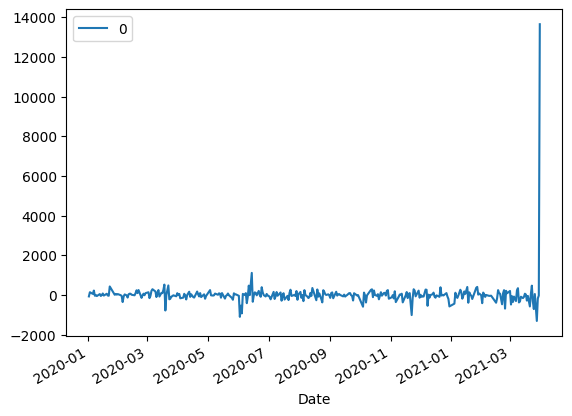

In [ ]:
residuals.plot()

Residuals changes are not uniform and in some periods are significanlty higher than the rest and even it leads to infinity in the final which shows the the results are suffers from outliers and unreliability.
However, the average residuals is low.

<Axes: ylabel='Density'>

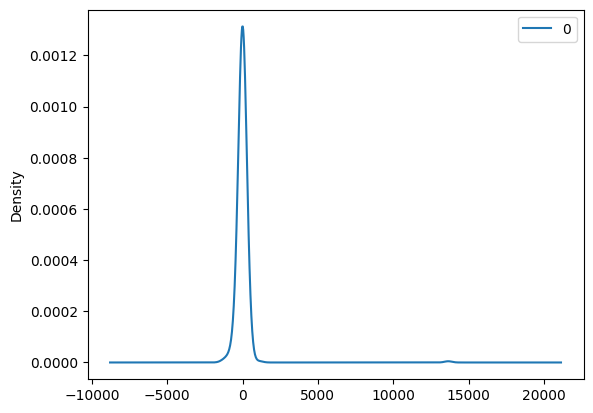

In [ ]:
residuals.plot(kind='kde')

In [ ]:
arima_results = {}

for company, df in stock_data.items():
  if 'Price' in df.columns:
    price_series = pd.to_numeric(df['Price'], errors='coerce').dropna()
    if len(price_series) > 10: # Ensure enough data points
        try:
            # Fit ARIMA model - order (p, d, q) needs to be chosen based on ACF/PACF or auto_arima
            # Using a default order for now (adjust as needed)
            model = ARIMA(price_series, order=(5, 1, 2))
            model_fit = model.fit()
            arima_results[company] = model_fit
            print(f"ARIMA model fitted for {company}")
        except Exception as e:
            print(f"Could not fit ARIMA model for {company}: {e}")

ARIMA model fitted for Russia - Sberbank Rossii PAO (S
ARIMA model fitted for Turkey - Koc Holding AS (KCHOL)
ARIMA model fitted for Egypt - Medinet Nasr Housing (M
ARIMA model fitted for Brazil - Minerva SABrazil (BEEF
ARIMA model fitted for Argentina - Pampa Energia SA (P
ARIMA model fitted for Colombia - Cementos Argos SA (C
ARIMA model fitted for South Africa - Impala Platinum
ARIMA model fitted for South Korea - Dongkuk Steel Mil


In [ ]:
for result in arima_results.values():
    print(result.summary())

                               SARIMAX Results                                
Dep. Variable:                  Price   No. Observations:                  311
Model:                 ARIMA(5, 1, 2)   Log Likelihood                -914.286
Date:                Wed, 25 Jun 2025   AIC                           1844.572
Time:                        13:53:50   BIC                           1874.464
Sample:                             0   HQIC                          1856.521
                                - 311                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2718      0.144     -8.861      0.000      -1.553      -0.991
ar.L2         -0.6703      0.162     -4.137      0.000      -0.988      -0.353
ar.L3         -0.0772      0.093     -0.826      0.4

The residuals distribution follows normal distribution with avg=0  and low variance which denotes model accuracy.

## SARIMAX

In [ ]:
sarimax_results = {}

for company, df in stock_data.items():
  if 'Price' in df.columns:
    price_series = pd.to_numeric(df['Price'], errors='coerce').dropna()
    if len(price_series) > 24: # Ensure enough data for seasonality (e.g., 2*seasonal period + some)
        try:
            # Fit SARIMAX model - order and seasonal_order need to be chosen based on ACF/PACF, auto_arima, or domain knowledge
            # Using a default order (1, 1, 1) and seasonal order (1, 1, 1, 12) as an example
            # The seasonal period (last number in seasonal_order tuple) should reflect the data's seasonality (e.g., 12 for monthly, 7 for weekly if daily data)
            # For stock data, seasonality might not be as pronounced, and a period of 12 might be too large or irrelevant.
            # Consider adjusting the seasonal period or setting it to 0 if no clear seasonality.
            model = SARIMAX(price_series, order=(1, 1, 1), seasonal_order=(0, 0, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
            results = model.fit()
            sarimax_results[company] = results
            print(f"SARIMAX model fitted for {company}")
        except Exception as e:
            print(f"Could not fit SARIMAX model for {company}: {e}")
    else:
        print(f"Not enough data to fit SARIMAX for {company}")

# You can now access the fitted SARIMAX models for each company from the sarimax_results dictionary
# For example, to see the summary for one of the companies:
if sarimax_results:
    first_company_sarimax = list(sarimax_results.keys())[0]
    print(f"\nSummary for {first_company_sarimax} (SARIMAX):")
    print(sarimax_results[first_company_sarimax].summary())

# Loop through all fitted SARIMAX results and print summaries
print("\nSARIMAX Model Summaries for all companies:")
for company, result in sarimax_results.items():
    print(f"\n--- Summary for {company} ---")
    print(result.summary())

SARIMAX model fitted for Russia - Sberbank Rossii PAO (S
SARIMAX model fitted for Turkey - Koc Holding AS (KCHOL)
SARIMAX model fitted for Egypt - Medinet Nasr Housing (M
SARIMAX model fitted for Brazil - Minerva SABrazil (BEEF
SARIMAX model fitted for Argentina - Pampa Energia SA (P
SARIMAX model fitted for Colombia - Cementos Argos SA (C
SARIMAX model fitted for South Africa - Impala Platinum
SARIMAX model fitted for South Korea - Dongkuk Steel Mil

Summary for Russia - Sberbank Rossii PAO (S (SARIMAX):
                               SARIMAX Results                                
Dep. Variable:                  Price   No. Observations:                  311
Model:               SARIMAX(1, 1, 1)   Log Likelihood                -918.696
Date:                Wed, 25 Jun 2025   AIC                           1843.392
Time:                        13:53:54   BIC                           1854.582
Sample:                             0   HQIC                          1847.866
               

## ARIMAX

### Download indexes data for stocks period

In [ ]:


# Get the date range from the first dataframe
if stock_data:
    first_company_df = list(stock_data.values())[0]
    start_date = first_company_df.index.min().strftime('%Y-%m-%d')
    end_date = first_company_df.index.max().strftime('%Y-%m-%d')
    print(f"Fetching data for date range: {start_date} to {end_date}")

    # Define a list of common market indices (you can add more)
    indices = ['^GSPC', '^DJI', '^IXIC', '^FTSE', '^GDAXI', '^FCHI', '^N225'] # S&P 500, Dow Jones, Nasdaq, FTSE 100, DAX, CAC 40, Nikkei 225

    index_data = {}

    for index_ticker in indices:
        try:
            # Download index data using yfinance
            data = yf.download(index_ticker, start=start_date, end=end_date)
            if not data.empty:
                index_data[index_ticker] = data['Close'] # Use adjusted close price
                print(f"Downloaded data for {index_ticker}")
            else:
                print(f"No data found for {index_ticker} in the specified range.")
        except Exception as e:
            print(f"Could not download data for {index_ticker}: {e}")

    # You now have a dictionary 'index_data' where keys are index tickers
    # and values are Pandas Series of 'Adj Close' prices within your date range.
    # You can inspect the downloaded data:
    if index_data:
        print("\nDownloaded Index Data:")
        for ticker, data in index_data.items():
            print(f"{ticker}: {data.head()}")
    else:
        print("\nNo index data was successfully downloaded.")

else:
    print("No stock data available to determine the date range.")

Fetching data for date range: 2020-01-03 to 2021-03-31


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Downloaded data for ^GSPC
Downloaded data for ^DJI


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Downloaded data for ^IXIC
Downloaded data for ^FTSE


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Downloaded data for ^GDAXI
Downloaded data for ^FCHI


[*********************100%***********************]  1 of 1 completed

Downloaded data for ^N225

Downloaded Index Data:
^GSPC: Ticker            ^GSPC
Date                   
2020-01-03  3234.850098
2020-01-06  3246.280029
2020-01-07  3237.179932
2020-01-08  3253.050049
2020-01-09  3274.699951
^DJI: Ticker              ^DJI
Date                    
2020-01-03  28634.880859
2020-01-06  28703.380859
2020-01-07  28583.679688
2020-01-08  28745.089844
2020-01-09  28956.900391
^IXIC: Ticker            ^IXIC
Date                   
2020-01-03  9020.769531
2020-01-06  9071.469727
2020-01-07  9068.580078
2020-01-08  9129.240234
2020-01-09  9203.429688
^FTSE: Ticker            ^FTSE
Date                   
2020-01-03  7622.399902
2020-01-06  7575.299805
2020-01-07  7573.899902
2020-01-08  7574.899902
2020-01-09  7598.100098
^GDAXI: Ticker            ^GDAXI
Date                    
2020-01-03  13219.139648
2020-01-06  13126.990234
2020-01-07  13226.830078
2020-01-08  13320.179688
2020-01-09  13495.059570
^FCHI: Ticker            ^FCHI
Date                   
2020-0

In [ ]:
sarimax_exog_results = {}
comparison_results = {}

# Loop through each company's stock data to be the target (endogenous)
for target_company, target_df in stock_data.items():
    if 'Price' in target_df.columns:
        target_series = pd.to_numeric(target_df['Price'], errors='coerce').dropna()

        if len(target_series) < 30: # Ensure enough data points for reasonable modeling
            print(f"Skipping {target_company}: Not enough data.")
            continue

        print(f"\n--- Fitting SARIMAX for {target_company} with various exogenous variables ---")

        # Prepare a dictionary to store results for the current target company
        comparison_results[target_company] = {}

        # Option 1: Fit SARIMAX with no exogenous variables as a baseline
        try:
            print(f"Fitting baseline SARIMAX for {target_company}")
            model_baseline = SARIMAX(target_series, order=(1, 1, 1), seasonal_order=(0, 0, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
            results_baseline = model_baseline.fit()
            comparison_results[target_company]['_baseline'] = results_baseline.summary()
            print(f"Baseline SARIMAX fitted for {target_company}. AIC: {results_baseline.aic:.2f}")
        except Exception as e:
            print(f"Could not fit baseline SARIMAX for {target_company}: {e}")
            comparison_results[target_company]['_baseline'] = f"Error: {e}"


        # Option 2: Use other companies' prices as exogenous variables
        for exog_company, exog_df in stock_data.items():
            if exog_company != target_company and 'Price' in exog_df.columns:
                exog_series = pd.to_numeric(exog_df['Price'], errors='coerce').dropna()

                # Align the time series data - very important for exog variables
                # Use outer join to keep all dates, then interpolate or fill NaNs if necessary
                # Or use inner join if only interested in dates present in both series
                combined_df = pd.concat([target_series, exog_series], axis=1, keys=[target_company, exog_company]).dropna()

                if combined_df.empty or len(combined_df) < 30:
                    print(f"Not enough overlapping data between {target_company} and {exog_company}. Skipping as exog.")
                    continue

                aligned_target = combined_df[target_company]
                aligned_exog = combined_df[[exog_company]] # Exog needs to be a DataFrame

                try:
                    print(f"Fitting SARIMAX for {target_company} with {exog_company} Price as exog")
                    model_exog_price = SARIMAX(aligned_target,
                                               exog=aligned_exog,
                                               order=(1, 1, 1),
                                               seasonal_order=(0, 0, 0, 0),
                                               enforce_stationarity=False,
                                               enforce_invertibility=False)
                    results_exog_price = model_exog_price.fit()
                    exog_key = f'price_exog_{exog_company}'
                    comparison_results[target_company][exog_key] = results_exog_price.summary()
                    print(f"SARIMAX fitted for {target_company} with {exog_company} Price. AIC: {results_exog_price.aic:.2f}")
                except Exception as e:
                    print(f"Could not fit SARIMAX for {target_company} with {exog_company} Price as exog: {e}")
                    exog_key = f'price_exog_{exog_company}'
                    comparison_results[target_company][exog_key] = f"Error: {e}"

        # Option 3: Use market indices Close prices as exogenous variables
        if index_data:
            for index_ticker, index_series in index_data.items():

                # Align the time series data
                combined_df = pd.concat([target_series, index_series], axis=1, keys=[target_company, index_ticker]).dropna()

                if combined_df.empty or len(combined_df) < 30:
                    print(f"Not enough overlapping data between {target_company} and {index_ticker}. Skipping as exog.")
                    continue

                aligned_target = combined_df[target_company]
                aligned_exog = combined_df[[index_ticker]] # Exog needs to be a DataFrame

                try:
                    print(f"Fitting SARIMAX for {target_company} with {index_ticker} Close as exog")
                    model_exog_index = SARIMAX(aligned_target,
                                               exog=aligned_exog,
                                               order=(1, 1, 1),
                                               seasonal_order=(0, 0, 0, 0),
                                               enforce_stationarity=False,
                                               enforce_invertibility=False)
                    results_exog_index = model_exog_index.fit()
                    exog_key = f'index_exog_{index_ticker}'
                    comparison_results[target_company][exog_key] = results_exog_index.summary()
                    print(f"SARIMAX fitted for {target_company} with {index_ticker} Close. AIC: {results_exog_index.aic:.2f}")

                except Exception as e:
                    print(f"Could not fit SARIMAX for {target_company} with {index_ticker} Close as exog: {e}")
                    exog_key = f'index_exog_{index_ticker}'
                    comparison_results[target_company][exog_key] = f"Error: {e}"

        print(f"Finished fitting models for {target_company}.")
    else:
        print(f"Skipping {target_company}: 'Price' column not found.")

# --- Comparing Results ---
print("\n--- Comparison of SARIMAX Results (Based on AIC) ---")

for target_company, results_dict in comparison_results.items():
    print(f"\nResults for Target: {target_company}")
    best_aic = float('inf')
    best_model = "No successful model fitted"

    for exog_key, summary_or_error in results_dict.items():
        if isinstance(summary_or_error, str) and summary_or_error.startswith("Error"):
            print(f"  {exog_key}: {summary_or_error}")
            continue

        # Extract AIC from the summary string
        try:
            # Find the line containing AIC and extract the value
            summary_lines = summary_or_error.split('\n')
            aic_line = [line for line in summary_lines if 'AIC:' in line]
            if aic_line:
                aic_str = aic_line[0].split('AIC:')[1].split()[0]
                current_aic = float(aic_str)
                print(f"  {exog_key}: AIC = {current_aic:.2f}")
                if current_aic < best_aic:
                    best_aic = current_aic
                    best_model = exog_key
            else:
                 print(f"  {exog_key}: AIC not found in summary.")
        except Exception as e:
            print(f"  Could not parse AIC for {exog_key}: {e}")


    print(f"\n  Best model for {target_company} based on AIC: {best_model} (AIC: {best_aic:.2f})")
    print("-" * 30)

# Optional: You can print out the full summaries for detailed inspection if needed
# print("\n--- Full SARIMAX Summaries ---")
# for target_company, results_dict in comparison_results.items():
#     print(f"\n--- Full Summaries for Target: {target_company} ---")
#     for exog_key, summary_or_error in results_dict.items():
#         print(f"\n--- {exog_key} ---")
#         print(summary_or_error)



--- Fitting SARIMAX for Russia - Sberbank Rossii PAO (S with various exogenous variables ---
Fitting baseline SARIMAX for Russia - Sberbank Rossii PAO (S
Baseline SARIMAX fitted for Russia - Sberbank Rossii PAO (S. AIC: 1843.39
Fitting SARIMAX for Russia - Sberbank Rossii PAO (S with Turkey - Koc Holding AS (KCHOL) Price as exog
SARIMAX fitted for Russia - Sberbank Rossii PAO (S with Turkey - Koc Holding AS (KCHOL) Price. AIC: 1747.55
Fitting SARIMAX for Russia - Sberbank Rossii PAO (S with Egypt - Medinet Nasr Housing (M Price as exog
SARIMAX fitted for Russia - Sberbank Rossii PAO (S with Egypt - Medinet Nasr Housing (M Price. AIC: 1437.69
Fitting SARIMAX for Russia - Sberbank Rossii PAO (S with Brazil - Minerva SABrazil (BEEF Price as exog
SARIMAX fitted for Russia - Sberbank Rossii PAO (S with Brazil - Minerva SABrazil (BEEF Price. AIC: 1761.28
Fitting SARIMAX for Russia - Sberbank Rossii PAO (S with Argentina - Pampa Energia SA (P Price as exog
SARIMAX fitted for Russia - Sberban


--- Plotting Residuals from Stored Results ---


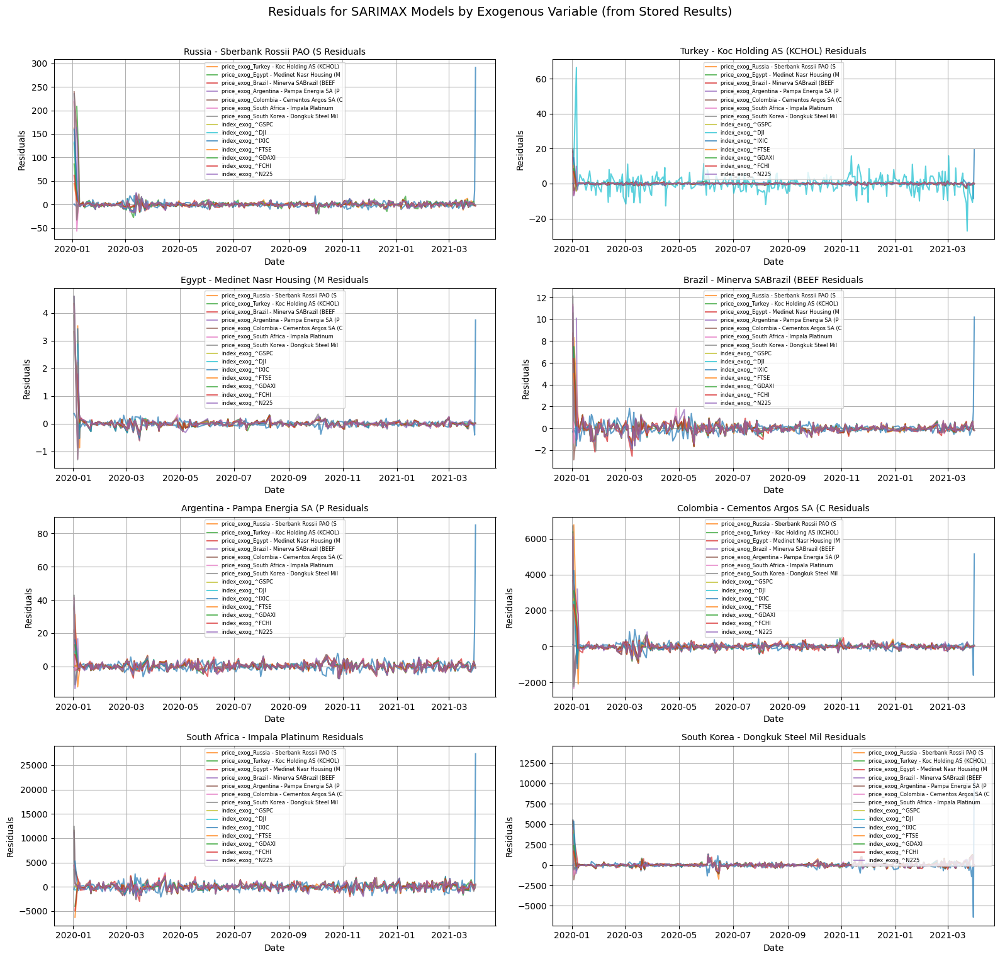

In [42]:


# Plotting Residuals from the stored fitted models
print("\n--- Plotting Residuals from Stored Results ---")

fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows), sharex=False)
axes = axes.flatten()

i = 0

for target_company, results_dict in sarimax_comparison_results.items():
    if i >= len(axes):
        break

    ax = axes[i]
    ax.set_title(f'{target_company} Residuals', fontsize=10)
    ax.set_ylabel('Residuals')
    ax.grid(True)

    plotted_any = False
    for exog_key, result_or_error in results_dict.items():
        if isinstance(result_or_error, str) and result_or_error.startswith("Error"):
            continue # Skip models that failed to fit

        try:
            # result_or_error is now the fitted model results object
            residuals = pd.Series(result_or_error.resid, index=result_or_error.resid.index, name=exog_key)
            ax.plot(residuals, label=exog_key, alpha=0.7)
            plotted_any = True
        except Exception as e:
            print(f"Could not plot residuals for {target_company} with {exog_key}: {e}")

    if plotted_any:
        ax.legend(fontsize=6)
        ax.set_xlabel('Date')
    else:
         ax.text(0.5, 0.5, 'No successful models to plot', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)


    i += 1

# Remove any unused axes
for j in range(i, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Residuals for SARIMAX Models by Exogenous Variable (from Stored Results)', fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


--- Plotting Residual Distributions (KDE) from Stored Results ---


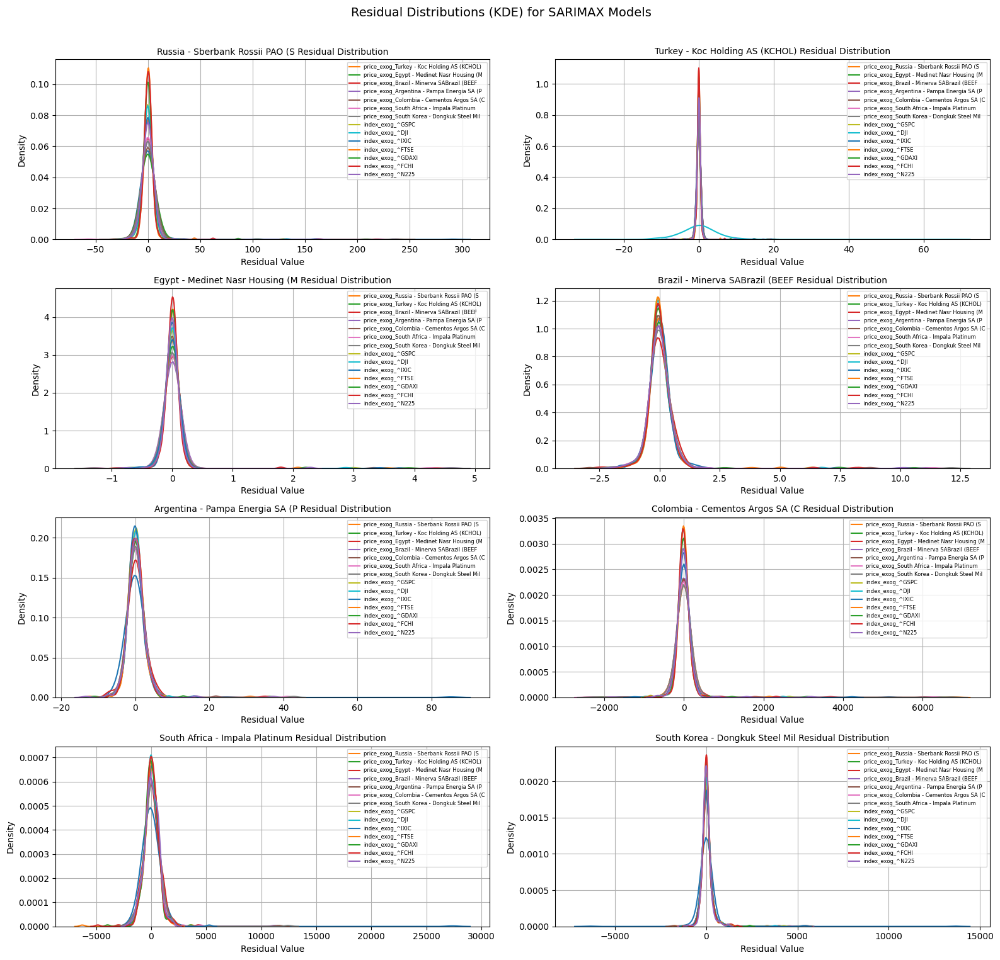

In [ ]:
print("\n--- Plotting Residual Distributions (KDE) from Stored Results ---")

fig_kde, axes_kde = plt.subplots(rows, cols, figsize=(16, 4 * rows), sharex=False)
axes_kde = axes_kde.flatten()

i = 0

for target_company, results_dict in sarimax_comparison_results.items():
    if i >= len(axes_kde):
        break

    ax_kde = axes_kde[i]
    ax_kde.set_title(f'{target_company} Residual Distribution', fontsize=10)
    ax_kde.set_xlabel('Residual Value')
    ax_kde.set_ylabel('Density')
    ax_kde.grid(True)

    plotted_any = False
    for exog_key, result_or_error in results_dict.items():
        if isinstance(result_or_error, str) and result_or_error.startswith("Error"):
            continue # Skip models that failed to fit

        try:
            residuals = pd.Series(result_or_error.resid, index=result_or_error.resid.index)
            sns.kdeplot(residuals.dropna(), ax=ax_kde, label=exog_key)
            plotted_any = True
        except Exception as e:
            print(f"Could not plot residual KDE for {target_company} with {exog_key}: {e}")

    if plotted_any:
        ax_kde.legend(fontsize=6)
    else:
        ax_kde.text(0.5, 0.5, 'No successful models to plot', horizontalalignment='center', verticalalignment='center', transform=ax_kde.transAxes)

    i += 1

# Remove any unused axes
for j in range(i, len(axes_kde)):
    fig_kde.delaxes(axes_kde[j])

fig_kde.suptitle('Residual Distributions (KDE) for SARIMAX Models', fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


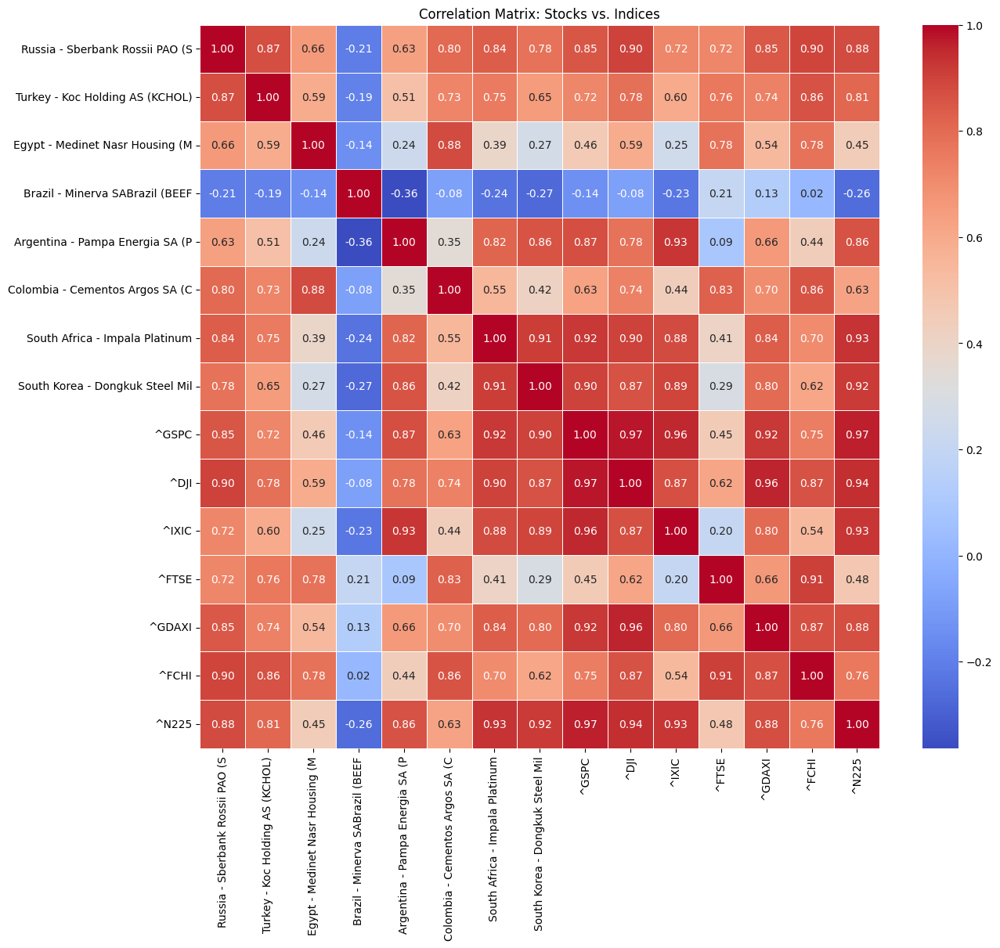

In [ ]:

all_stock_prices = pd.DataFrame()

for company, df in stock_data.items():
    if 'Price' in df.columns:
        # Use the 'Price' column and rename it to the company name
        all_stock_prices[company] = pd.to_numeric(df['Price'], errors='coerce')

# Combine all index prices into a single DataFrame
all_index_prices = pd.DataFrame()
if index_data:
    for index_ticker, series in index_data.items():
        all_index_prices[index_ticker] = series

# Concatenate stock and index prices for combined correlation
# Use an outer join to keep all dates from both stocks and indices
combined_prices = pd.concat([all_stock_prices, all_index_prices], axis=1)

# Calculate the correlation matrix
# Use .corr() which by default computes Pearson correlation
# Drop rows with NaNs before calculating correlation to avoid NaN results
correlation_matrix = combined_prices.dropna().corr()

# Display the correlation matrix using a heatmap
plt.figure(figsize=(14, 12)) # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix: Stocks vs. Indices')
plt.show()



--- Training LSTM for Russia - Sberbank Rossii PAO (S ---
LSTM model trained for Russia - Sberbank Rossii PAO (S
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 330ms/step
Predictions generated for Russia - Sberbank Rossii PAO (S


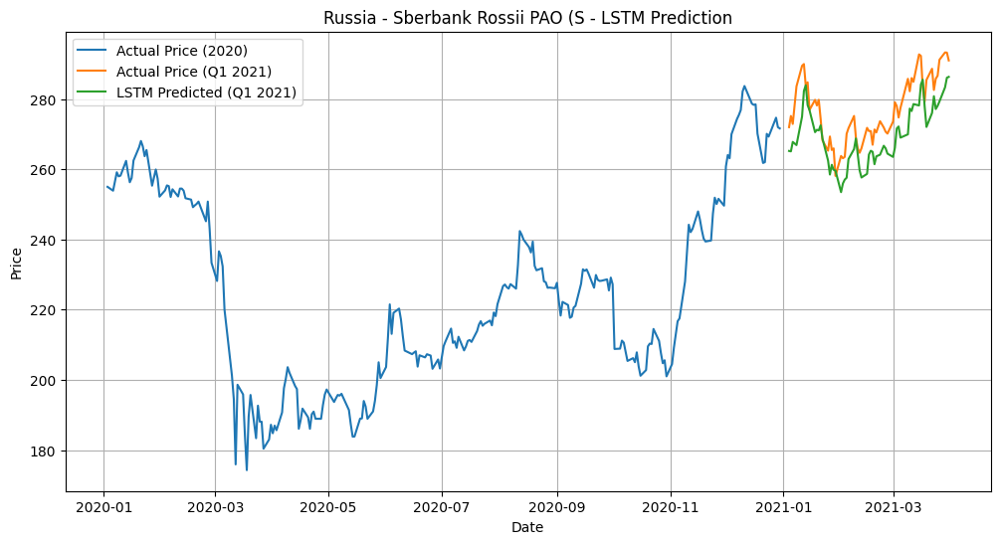


--- Training LSTM for Turkey - Koc Holding AS (KCHOL) ---
LSTM model trained for Turkey - Koc Holding AS (KCHOL)
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 478ms/step
Predictions generated for Turkey - Koc Holding AS (KCHOL)


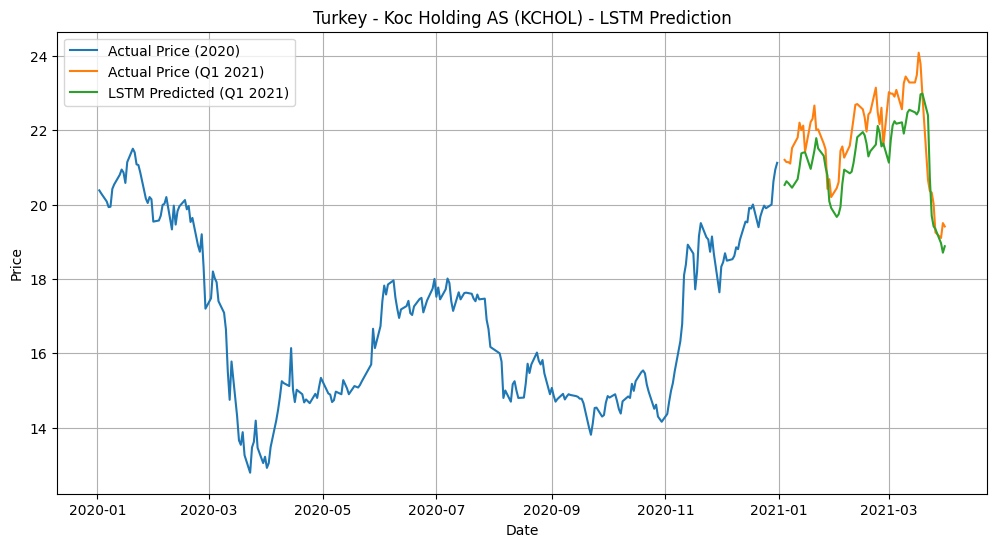


--- Training LSTM for Egypt - Medinet Nasr Housing (M ---
LSTM model trained for Egypt - Medinet Nasr Housing (M


1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 322ms/step
Predictions generated for Egypt - Medinet Nasr Housing (M


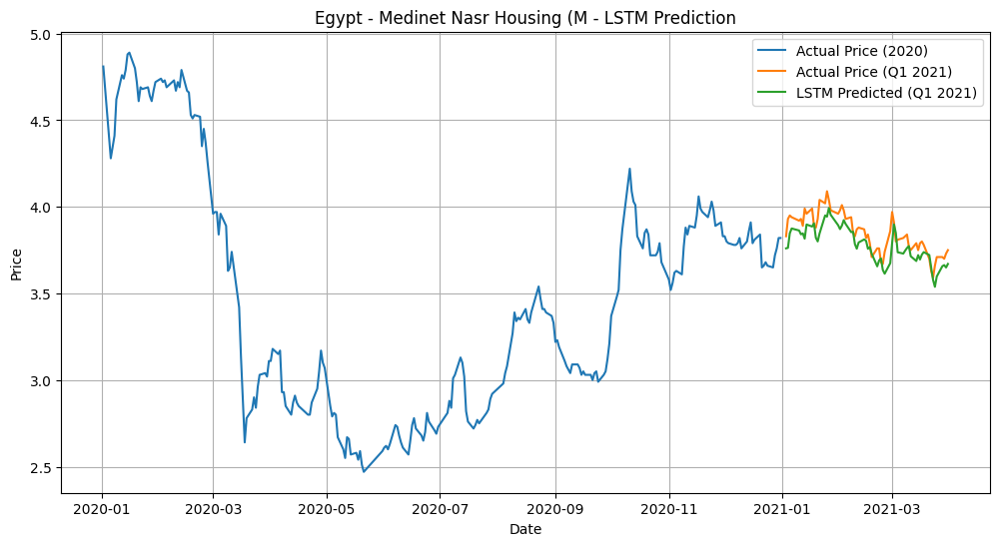


--- Training LSTM for Brazil - Minerva SABrazil (BEEF ---
LSTM model trained for Brazil - Minerva SABrazil (BEEF
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 351ms/step
Predictions generated for Brazil - Minerva SABrazil (BEEF


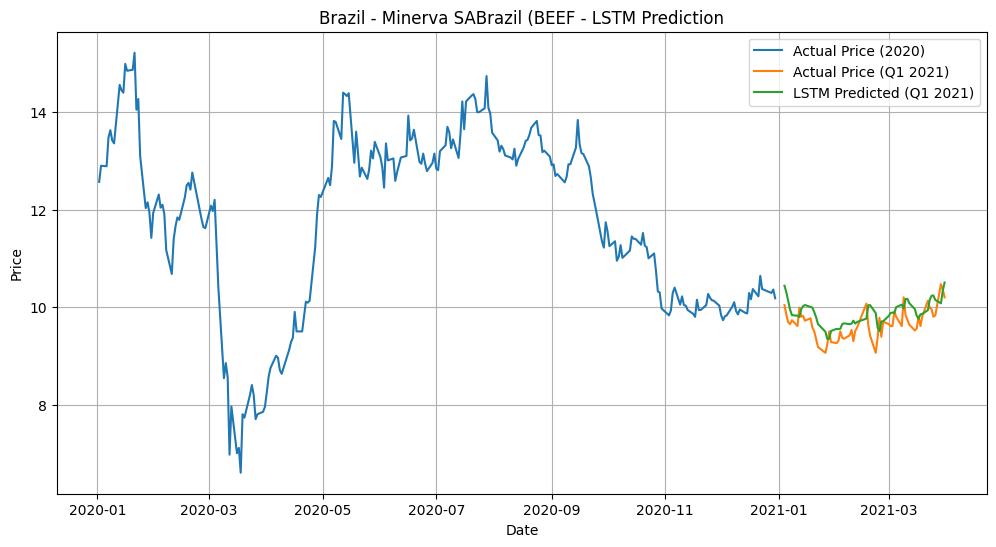


--- Training LSTM for Argentina - Pampa Energia SA (P ---
LSTM model trained for Argentina - Pampa Energia SA (P
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 327ms/step
Predictions generated for Argentina - Pampa Energia SA (P


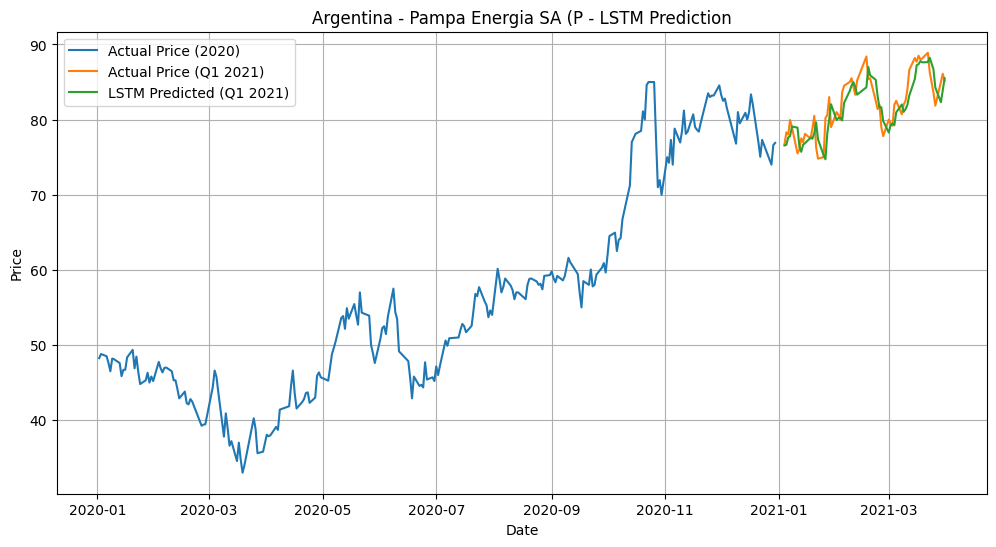


--- Training LSTM for Colombia - Cementos Argos SA (C ---
LSTM model trained for Colombia - Cementos Argos SA (C
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 344ms/step
Predictions generated for Colombia - Cementos Argos SA (C


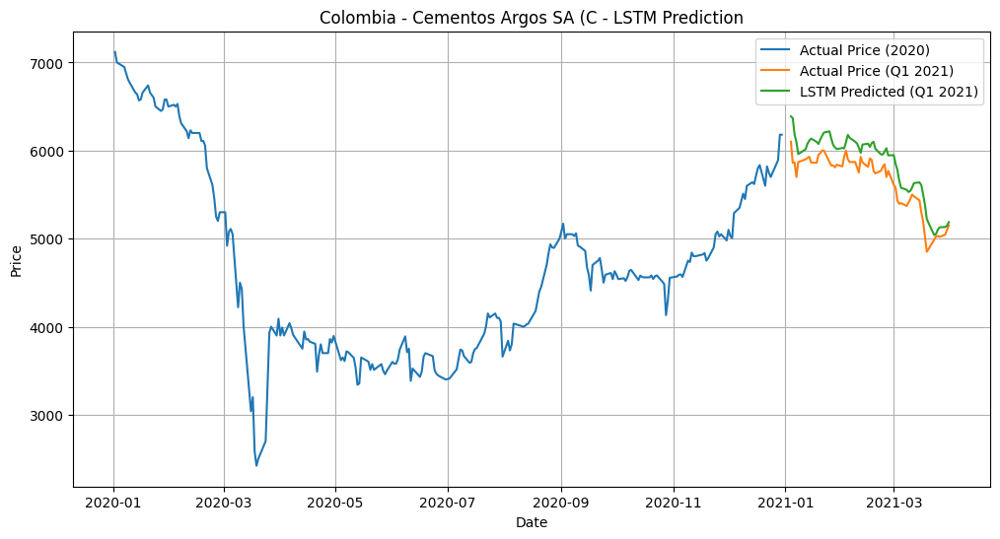


--- Training LSTM for South Africa - Impala Platinum ---
LSTM model trained for South Africa - Impala Platinum
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 340ms/step
Predictions generated for South Africa - Impala Platinum


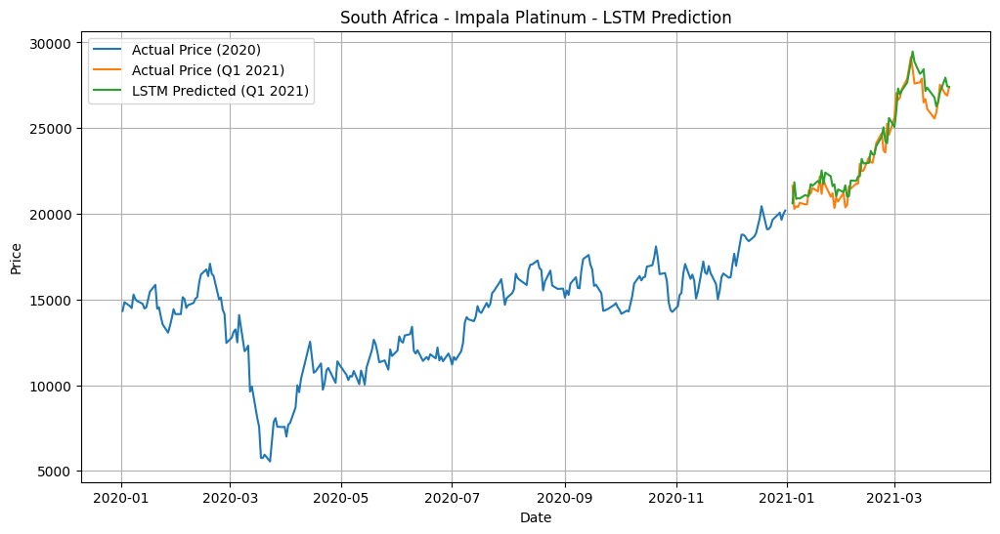


--- Training LSTM for South Korea - Dongkuk Steel Mil ---
LSTM model trained for South Korea - Dongkuk Steel Mil
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step
Predictions generated for South Korea - Dongkuk Steel Mil


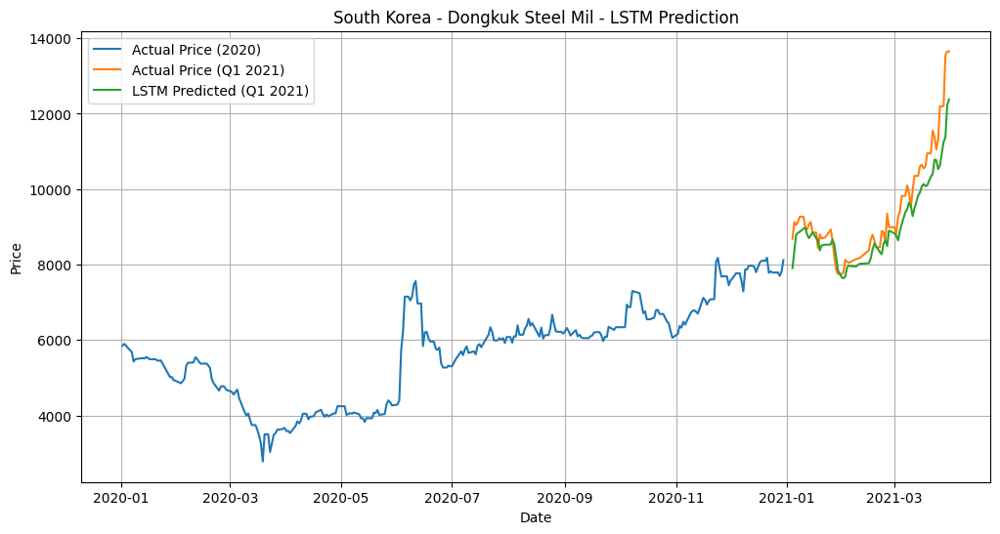


LSTM Predictions (First 5 Days for Each Company):

Russia - Sberbank Rossii PAO (S:
Date
2021-01-04    265.226318
2021-01-05    265.110260
2021-01-06    267.799774
2021-01-08    266.894104
2021-01-11    275.005707
Name: Russia - Sberbank Rossii PAO (S_LSTM_Predicted_Price, dtype: float32

Turkey - Koc Holding AS (KCHOL):
Date
2021-01-04    20.526415
2021-01-05    20.624680
2021-01-06    20.575302
2021-01-07    20.512293
2021-01-08    20.452131
Name: Turkey - Koc Holding AS (KCHOL)_LSTM_Predicted_Price, dtype: float32

Egypt - Medinet Nasr Housing (M:
Date
2021-01-03    3.760308
2021-01-04    3.762996
2021-01-05    3.847018
2021-01-06    3.874852
2021-01-10    3.863274
Name: Egypt - Medinet Nasr Housing (M_LSTM_Predicted_Price, dtype: float32

Brazil - Minerva SABrazil (BEEF:
Date
2021-01-04    10.438663
2021-01-05    10.303404
2021-01-06    10.126777
2021-01-07     9.949754
2021-01-08     9.833386
Name: Brazil - Minerva SABrazil (BEEF_LSTM_Predicted_Price, dtype: float32

Argentina - 

In [ ]:


# Ensure datetime index is set
for company, df in stock_data.items():
    df.index = pd.to_datetime(df.index)
    df.sort_index(inplace=True)

# Function to create sequences for LSTM
def create_sequences(data, seq_length):
    xs, ys = [], []
    for i in range(len(data) - seq_length):
        xs.append(data[i:i + seq_length])
        ys.append(data[i + seq_length])
    return np.array(xs), np.array(ys)

lstm_predictions = {}
sequence_length = 60

for company, df in stock_data.items():
    if 'Price' not in df.columns:
        print(f"Skipping {company}: 'Price' column missing.")
        continue

    price_series = pd.to_numeric(df['Price'], errors='coerce').dropna()

    if len(price_series) < sequence_length + 1:
        print(f"Skipping {company}: Not enough data for sequence length {sequence_length}.")
        continue

    print(f"\n--- Training LSTM for {company} ---")

    # Filter training data for 2020
    train_data = price_series[(price_series.index.year == 2020)].values.reshape(-1, 1)

    if len(train_data) < sequence_length + 1:
        print(f"Skipping {company}: Not enough training data in 2020.")
        continue

    # Scale training data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_train_data = scaler.fit_transform(train_data)

    # Create training sequences
    X_train, y_train = create_sequences(scaled_train_data, sequence_length)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

    # Build LSTM model
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(sequence_length, 1)),
        Dropout(0.2),
        LSTM(50),
        Dropout(0.2),
        Dense(25),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    early_stopping = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

    model.fit(X_train, y_train, batch_size=1, epochs=50, callbacks=[early_stopping], verbose=0)
    print(f"LSTM model trained for {company}")

    # Prepare test data for Q1 2021
    test_data = price_series[(price_series.index.year == 2021) & (price_series.index.quarter == 1)]

    if test_data.empty:
        print(f"Skipping {company}: No test data for Q1 2021.")
        continue

    last_train_sequence = train_data[-sequence_length:]
    full_test_data = np.concatenate((last_train_sequence, test_data.values.reshape(-1, 1)), axis=0)

    scaled_full_test_data = scaler.transform(full_test_data)

    # Create test sequences
    X_test = []
    for i in range(sequence_length, len(scaled_full_test_data)):
        X_test.append(scaled_full_test_data[i - sequence_length:i, 0])

    X_test = np.array(X_test).reshape((len(X_test), sequence_length, 1))

    predicted_scaled_prices = model.predict(X_test)
    predicted_prices = scaler.inverse_transform(predicted_scaled_prices)

    prediction_dates = test_data.index
    predicted_prices_series = pd.Series(predicted_prices.flatten(), index=prediction_dates, name=f'{company}_LSTM_Predicted_Price')

    lstm_predictions[company] = predicted_prices_series
    print(f"Predictions generated for {company}")

    # Plot actual vs predicted
    plt.figure(figsize=(12, 6))
    plt.plot(price_series[(price_series.index.year == 2020)], label='Actual Price (2020)')
    plt.plot(test_data.index, test_data.values, label='Actual Price (Q1 2021)')
    plt.plot(predicted_prices_series.index, predicted_prices_series.values, label='LSTM Predicted (Q1 2021)')
    plt.title(f'{company} - LSTM Prediction')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

# Print first 5 predictions for each stock
if lstm_predictions:
    print("\nLSTM Predictions (First 5 Days for Each Company):")
    for company, predictions in lstm_predictions.items():
        print(f"\n{company}:\n{predictions.head()}")



--- Training FCN for Russia - Sberbank Rossii PAO (S ---
FCN model trained for Russia - Sberbank Rossii PAO (S
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Predictions generated for Russia - Sberbank Rossii PAO (S


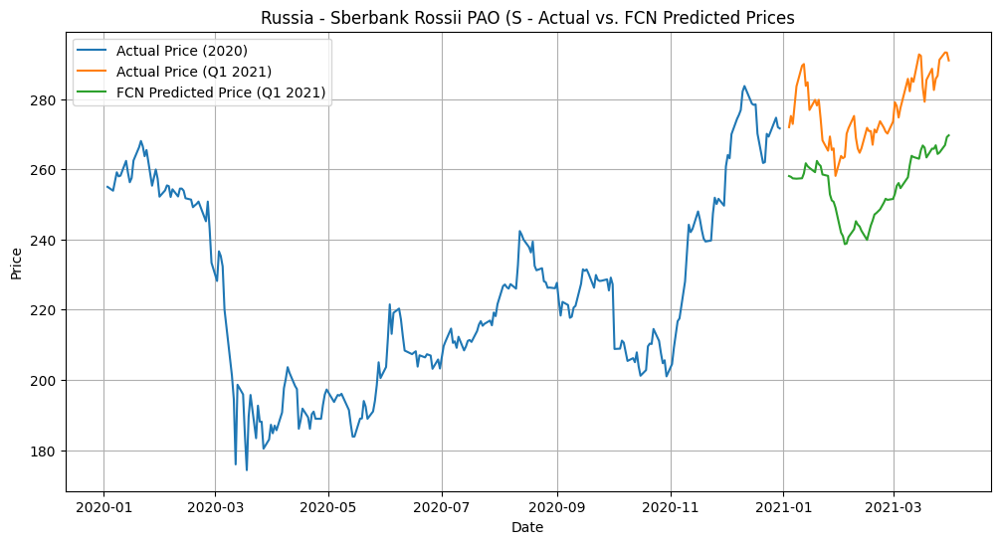


--- Training FCN for Turkey - Koc Holding AS (KCHOL) ---
FCN model trained for Turkey - Koc Holding AS (KCHOL)
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Predictions generated for Turkey - Koc Holding AS (KCHOL)


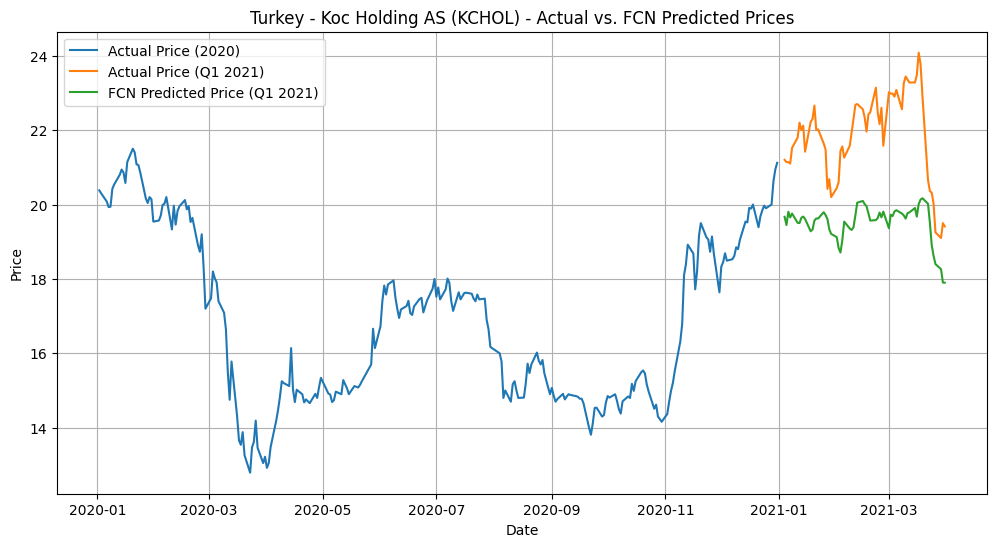


--- Training FCN for Egypt - Medinet Nasr Housing (M ---
FCN model trained for Egypt - Medinet Nasr Housing (M
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Predictions generated for Egypt - Medinet Nasr Housing (M


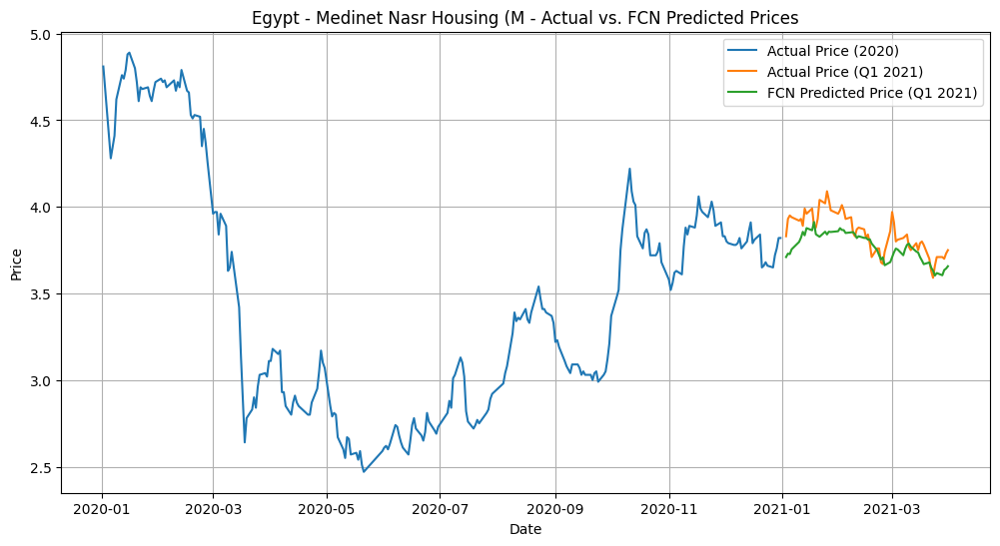


--- Training FCN for Brazil - Minerva SABrazil (BEEF ---
FCN model trained for Brazil - Minerva SABrazil (BEEF
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Predictions generated for Brazil - Minerva SABrazil (BEEF


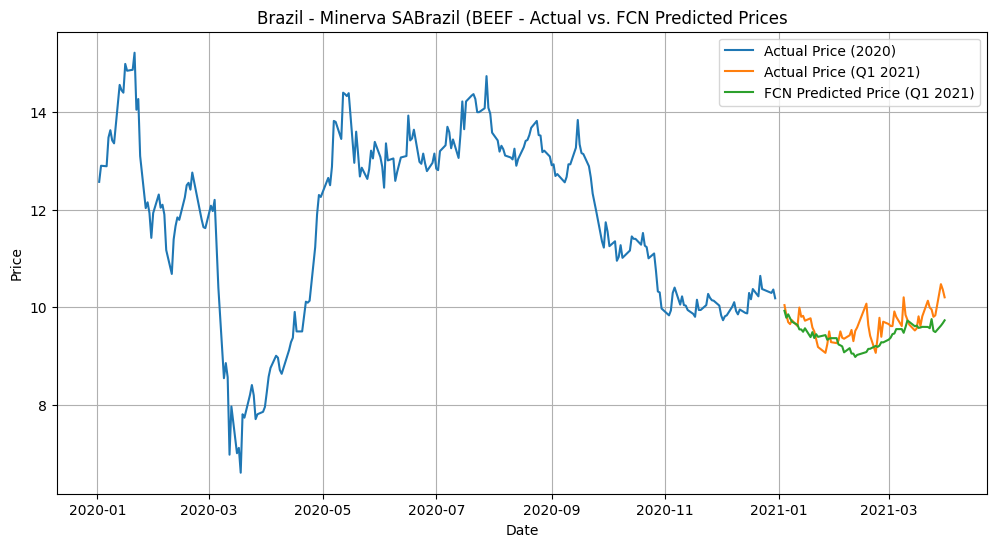


--- Training FCN for Argentina - Pampa Energia SA (P ---
FCN model trained for Argentina - Pampa Energia SA (P
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Predictions generated for Argentina - Pampa Energia SA (P


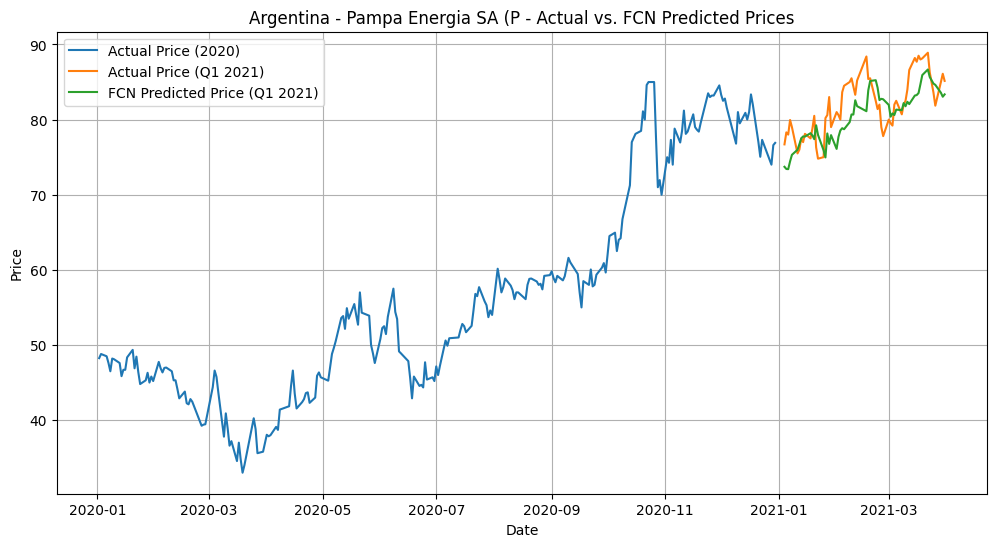


--- Training FCN for Colombia - Cementos Argos SA (C ---
FCN model trained for Colombia - Cementos Argos SA (C
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Predictions generated for Colombia - Cementos Argos SA (C


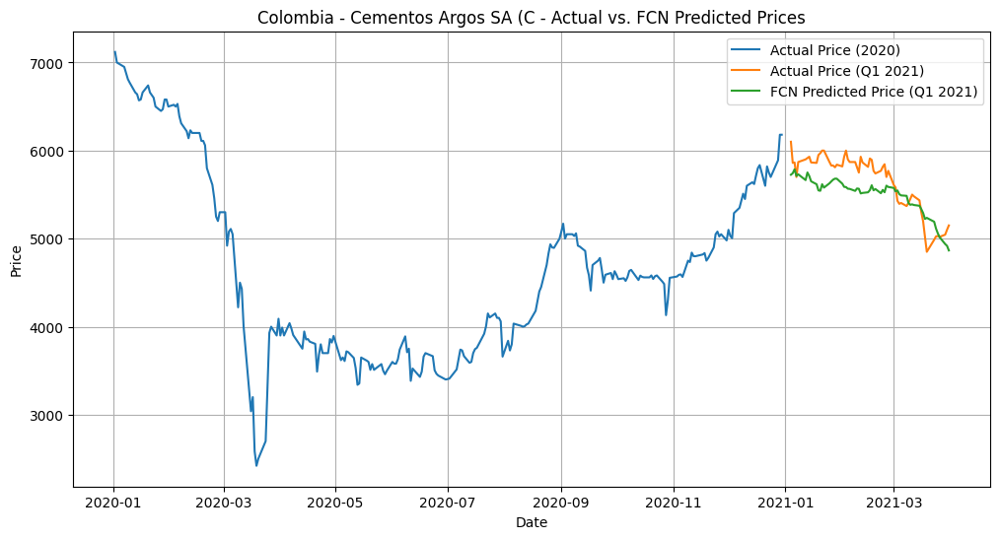


--- Training FCN for South Africa - Impala Platinum ---
FCN model trained for South Africa - Impala Platinum
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Predictions generated for South Africa - Impala Platinum


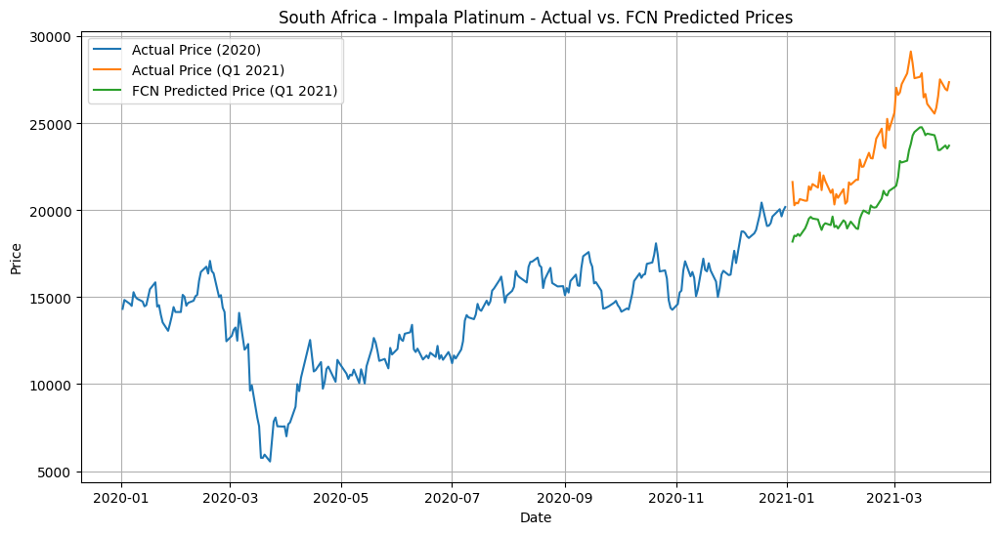


--- Training FCN for South Korea - Dongkuk Steel Mil ---
FCN model trained for South Korea - Dongkuk Steel Mil
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Predictions generated for South Korea - Dongkuk Steel Mil


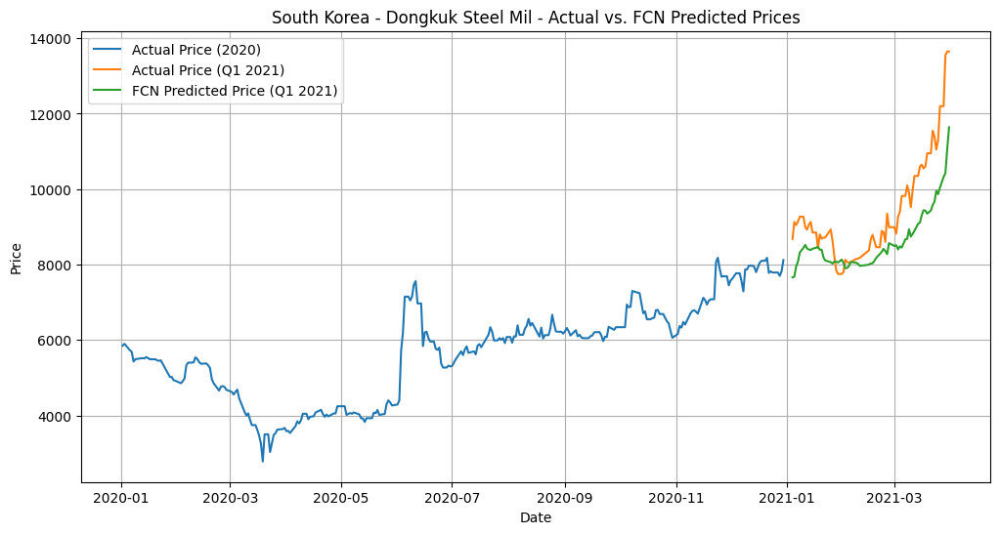


FCN Predictions (First 5 Days for Each Company):

Russia - Sberbank Rossii PAO (S:
Date
2021-01-04    258.068298
2021-01-05    257.851196
2021-01-06    257.412628
2021-01-08    257.321533
2021-01-11    257.438568
Name: Russia - Sberbank Rossii PAO (S_FCN_Predicted_Price, dtype: float32

Turkey - Koc Holding AS (KCHOL):
Date
2021-01-04    19.670094
2021-01-05    19.447643
2021-01-06    19.804762
2021-01-07    19.652775
2021-01-08    19.756397
Name: Turkey - Koc Holding AS (KCHOL)_FCN_Predicted_Price, dtype: float32

Egypt - Medinet Nasr Housing (M:
Date
2021-01-03    3.709775
2021-01-04    3.729841
2021-01-05    3.726929
2021-01-06    3.754777
2021-01-10    3.797151
Name: Egypt - Medinet Nasr Housing (M_FCN_Predicted_Price, dtype: float32

Brazil - Minerva SABrazil (BEEF:
Date
2021-01-04    9.924137
2021-01-05    9.781610
2021-01-06    9.851007
2021-01-07    9.771112
2021-01-08    9.700751
Name: Brazil - Minerva SABrazil (BEEF_FCN_Predicted_Price, dtype: float32

Argentina - Pampa Ener

In [ ]:
# Function to create input-output sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)

sequence_length = 60
fcn_predictions = {}

# Ensure datetime index
for company, df in stock_data.items():
    df.index = pd.to_datetime(df.index)
    df.sort_index(inplace=True)

for company, df in stock_data.items():
    if 'Price' not in df.columns:
        print(f"Skipping {company}: Missing 'Price' column.")
        continue

    price_series = pd.to_numeric(df['Price'], errors='coerce').dropna()

    if len(price_series) < sequence_length + 1:
        print(f"Skipping {company}: Not enough data for FCN.")
        continue

    print(f"\n--- Training FCN for {company} ---")

    # Use 2020 for training
    train_data = price_series[price_series.index.year == 2020].values.reshape(-1, 1)

    if len(train_data) < sequence_length + 1:
        print(f"Skipping {company}: Not enough training data in 2020.")
        continue

    # Scale the training data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_train_data = scaler.fit_transform(train_data)

    # Create input/output for training
    X_train, y_train = create_sequences(scaled_train_data, sequence_length)

    # FCN input: flatten the sequence window
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1]))

    # Build the fully connected model
    model = Sequential([
        Dense(128, activation='relu', input_shape=(sequence_length,)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    early_stopping = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

    model.fit(X_train, y_train, epochs=50, batch_size=16, callbacks=[early_stopping], verbose=0)
    print(f"FCN model trained for {company}")

    # Prepare Q1 2021 test data
    test_data = price_series[(price_series.index.year == 2021) & (price_series.index.quarter == 1)]
    if test_data.empty:
        print(f"Skipping {company}: No test data in Q1 2021.")
        continue

    last_train_sequence = train_data[-sequence_length:]
    full_test_data = np.concatenate((last_train_sequence, test_data.values.reshape(-1, 1)), axis=0)
    scaled_test_data = scaler.transform(full_test_data)

    # Create test inputs
    X_test = []
    for i in range(sequence_length, len(scaled_test_data)):
        X_test.append(scaled_test_data[i-sequence_length:i, 0])
    X_test = np.array(X_test)

    # Predict
    predicted_scaled_prices = model.predict(X_test)
    predicted_prices = scaler.inverse_transform(predicted_scaled_prices)

    prediction_dates = test_data.index
    predicted_series = pd.Series(predicted_prices.flatten(), index=prediction_dates, name=f'{company}_FCN_Predicted_Price')
    fcn_predictions[company] = predicted_series
    print(f"Predictions generated for {company}")

    # Plot
    plt.figure(figsize=(12, 6))
    plt.plot(price_series[price_series.index.year == 2020], label='Actual Price (2020)')
    plt.plot(test_data.index, test_data.values, label='Actual Price (Q1 2021)')
    plt.plot(predicted_series.index, predicted_series.values, label='FCN Predicted Price (Q1 2021)')
    plt.title(f'{company} - Actual vs. FCN Predicted Prices')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

# Display sample predictions
if fcn_predictions:
    print("\nFCN Predictions (First 5 Days for Each Company):")
    for company, predictions in fcn_predictions.items():
        print(f"\n{company}:\n{predictions.head()}")



--- Training CNN for Russia - Sberbank Rossii PAO (S ---
CNN model trained for Russia - Sberbank Rossii PAO (S
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Predictions generated for Russia - Sberbank Rossii PAO (S


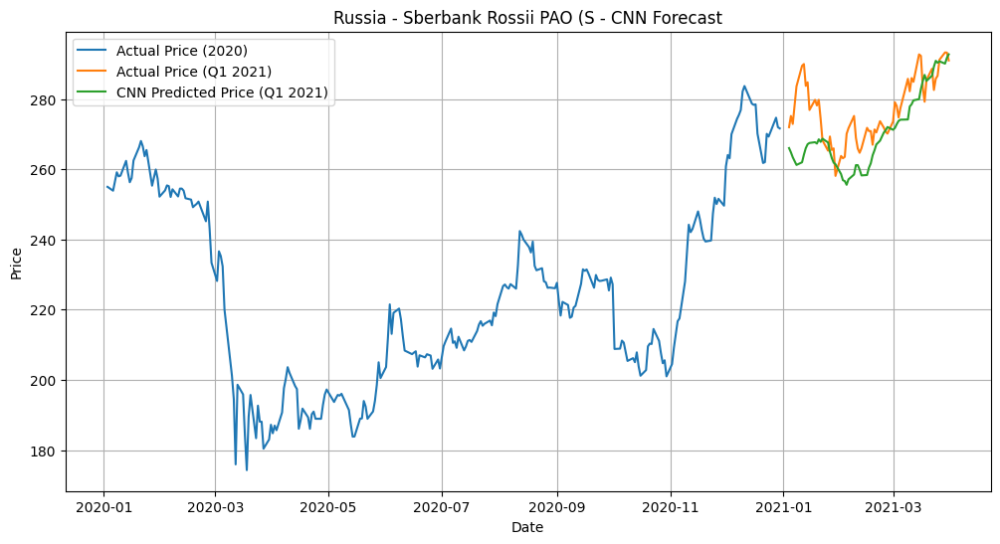


--- Training CNN for Turkey - Koc Holding AS (KCHOL) ---
CNN model trained for Turkey - Koc Holding AS (KCHOL)
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
Predictions generated for Turkey - Koc Holding AS (KCHOL)


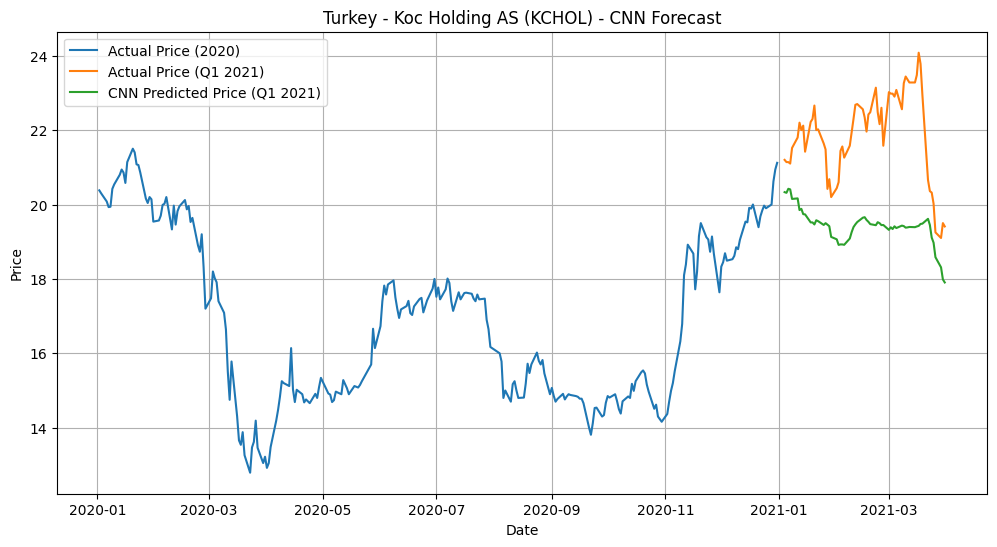


--- Training CNN for Egypt - Medinet Nasr Housing (M ---
CNN model trained for Egypt - Medinet Nasr Housing (M
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
Predictions generated for Egypt - Medinet Nasr Housing (M


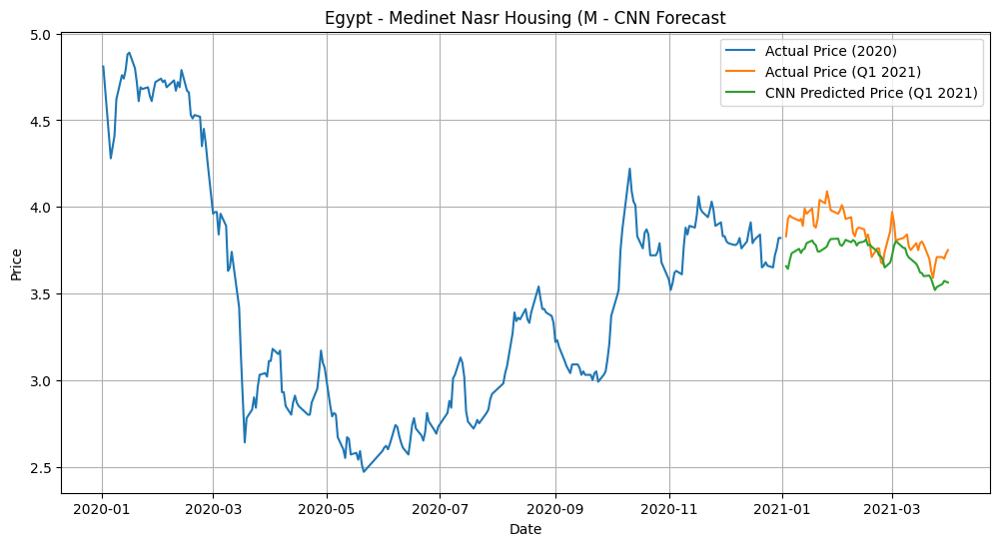


--- Training CNN for Brazil - Minerva SABrazil (BEEF ---
CNN model trained for Brazil - Minerva SABrazil (BEEF
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Predictions generated for Brazil - Minerva SABrazil (BEEF


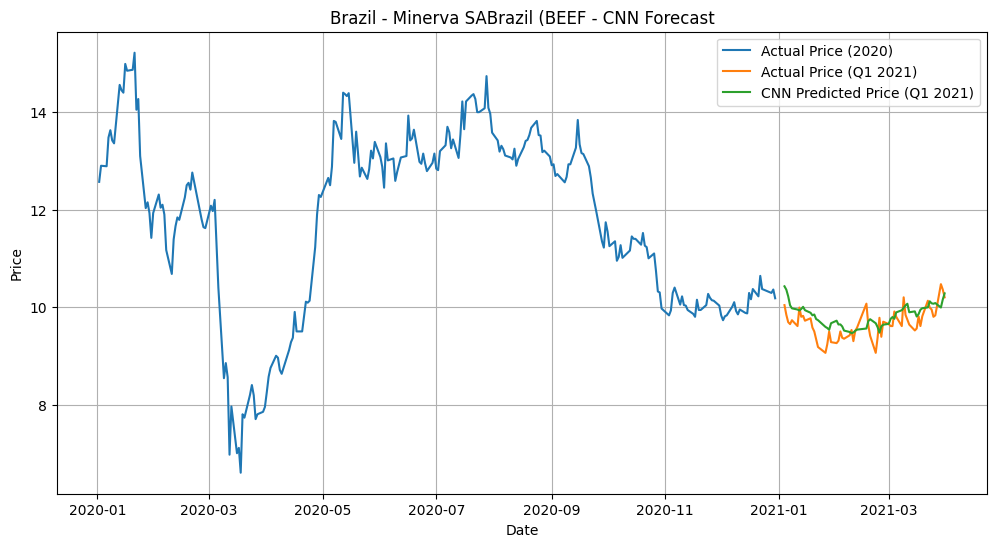


--- Training CNN for Argentina - Pampa Energia SA (P ---
CNN model trained for Argentina - Pampa Energia SA (P
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Predictions generated for Argentina - Pampa Energia SA (P


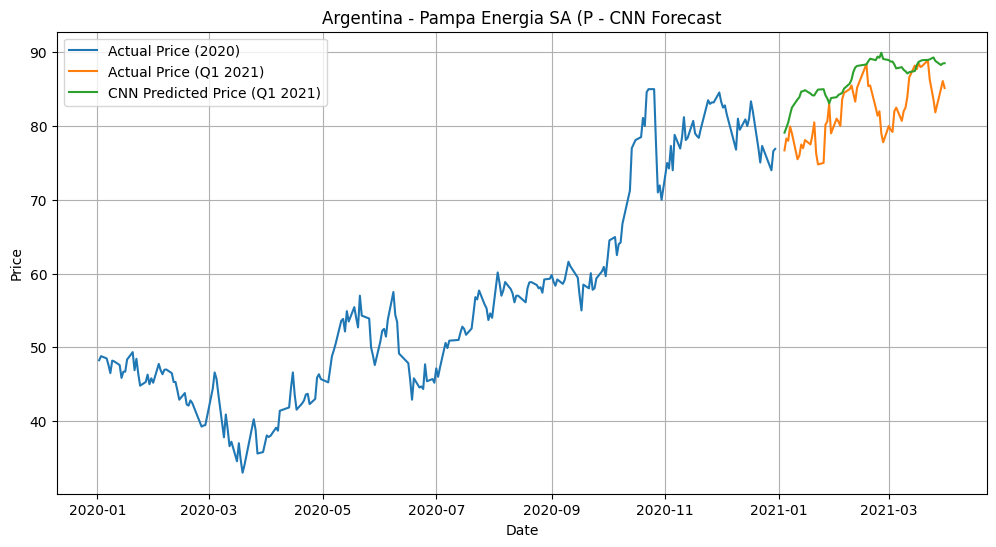


--- Training CNN for Colombia - Cementos Argos SA (C ---
CNN model trained for Colombia - Cementos Argos SA (C
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Predictions generated for Colombia - Cementos Argos SA (C


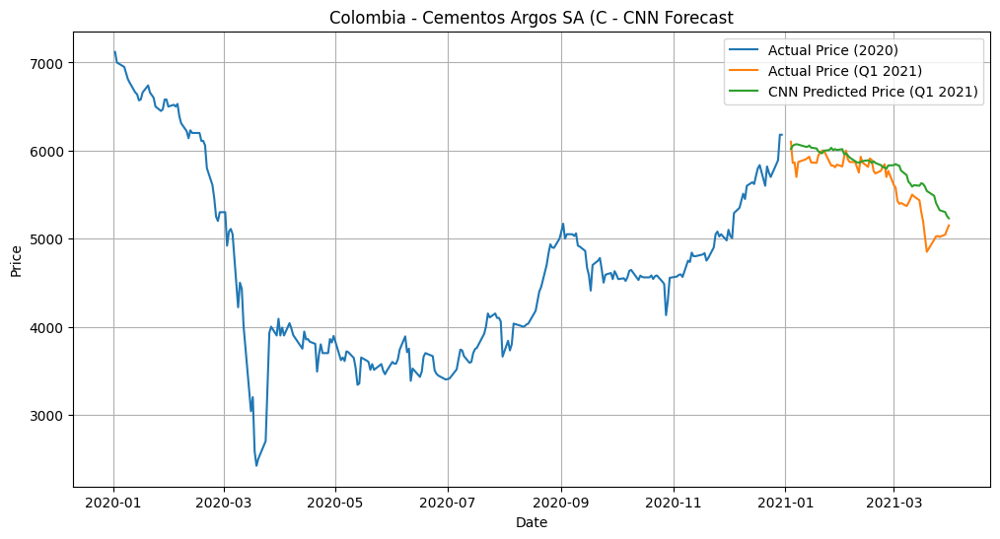


--- Training CNN for South Africa - Impala Platinum ---
CNN model trained for South Africa - Impala Platinum
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
Predictions generated for South Africa - Impala Platinum


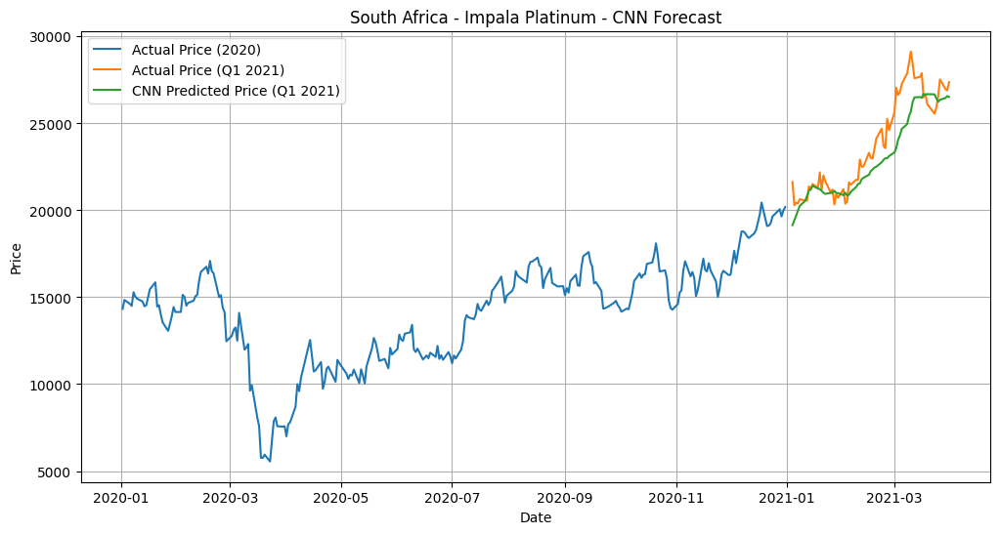


--- Training CNN for South Korea - Dongkuk Steel Mil ---
CNN model trained for South Korea - Dongkuk Steel Mil
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Predictions generated for South Korea - Dongkuk Steel Mil


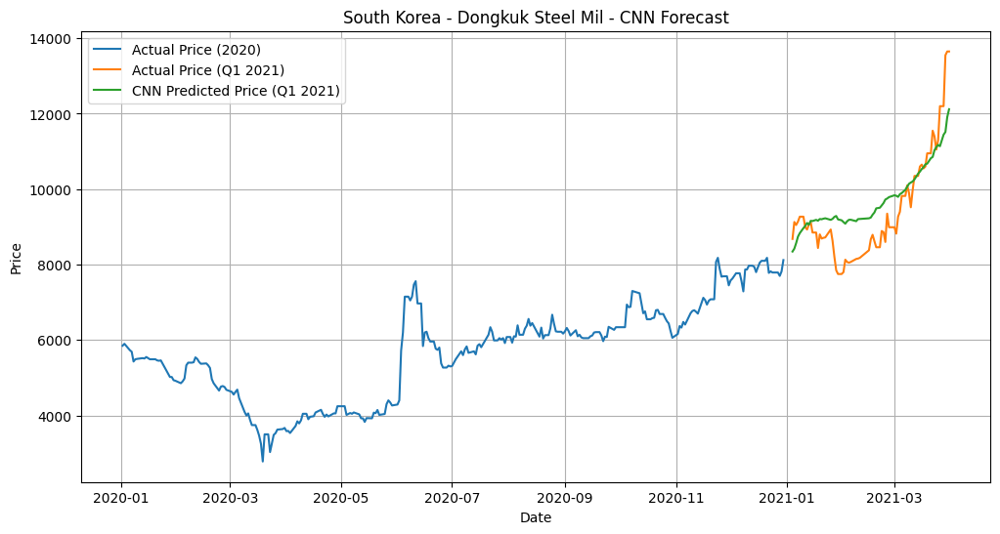


CNN Predictions (First 5 Days for Each Company):

Russia - Sberbank Rossii PAO (S:
Date
2021-01-04    266.040070
2021-01-05    264.834167
2021-01-06    263.416626
2021-01-08    261.242554
2021-01-11    261.990265
Name: Russia - Sberbank Rossii PAO (S_CNN_Predicted_Price, dtype: float32

Turkey - Koc Holding AS (KCHOL):
Date
2021-01-04    20.332363
2021-01-05    20.314032
2021-01-06    20.422186
2021-01-07    20.405952
2021-01-08    20.149481
Name: Turkey - Koc Holding AS (KCHOL)_CNN_Predicted_Price, dtype: float32

Egypt - Medinet Nasr Housing (M:
Date
2021-01-03    3.657169
2021-01-04    3.641548
2021-01-05    3.692060
2021-01-06    3.732000
2021-01-10    3.757349
Name: Egypt - Medinet Nasr Housing (M_CNN_Predicted_Price, dtype: float32

Brazil - Minerva SABrazil (BEEF:
Date
2021-01-04    10.425816
2021-01-05    10.356326
2021-01-06    10.219538
2021-01-07    10.036179
2021-01-08     9.973609
Name: Brazil - Minerva SABrazil (BEEF_CNN_Predicted_Price, dtype: float32

Argentina - Pampa

In [ ]:
# Function to create sequences
def create_sequences(data, seq_length):
    X, y = [], []
    for i in range(len(data) - seq_length):
        X.append(data[i:i + seq_length])
        y.append(data[i + seq_length])
    return np.array(X), np.array(y)

sequence_length = 60
cnn_predictions = {}

# Ensure datetime index is sorted
for company, df in stock_data.items():
    df.index = pd.to_datetime(df.index)
    df.sort_index(inplace=True)

for company, df in stock_data.items():
    if 'Price' not in df.columns:
        print(f"Skipping {company}: Missing 'Price' column.")
        continue

    price_series = pd.to_numeric(df['Price'], errors='coerce').dropna()

    if len(price_series) < sequence_length + 1:
        print(f"Skipping {company}: Not enough data for CNN.")
        continue

    print(f"\n--- Training CNN for {company} ---")

    # Training data from 2020
    train_data = price_series[price_series.index.year == 2020].values.reshape(-1, 1)

    if len(train_data) < sequence_length + 1:
        print(f"Skipping {company}: Not enough 2020 training data.")
        continue

    # Scale data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_train = scaler.fit_transform(train_data)

    # Create sequences
    X_train, y_train = create_sequences(scaled_train, sequence_length)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

    # Build CNN model
    model = Sequential([
        Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(sequence_length, 1)),
        MaxPooling1D(pool_size=2),
        Dropout(0.2),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    early_stopping = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

    model.fit(X_train, y_train, epochs=50, batch_size=16, callbacks=[early_stopping], verbose=0)
    print(f"CNN model trained for {company}")

    # Prepare test data (Q1 2021)
    test_data = price_series[(price_series.index.year == 2021) & (price_series.index.quarter == 1)]
    if test_data.empty:
        print(f"Skipping {company}: No Q1 2021 data.")
        continue

    last_train_sequence = train_data[-sequence_length:]
    full_test_data = np.concatenate((last_train_sequence, test_data.values.reshape(-1, 1)), axis=0)
    scaled_test = scaler.transform(full_test_data)

    # Create test sequences
    X_test = []
    for i in range(sequence_length, len(scaled_test)):
        X_test.append(scaled_test[i-sequence_length:i, 0])
    X_test = np.array(X_test).reshape((len(X_test), sequence_length, 1))

    # Predict
    predicted_scaled = model.predict(X_test)
    predicted_prices = scaler.inverse_transform(predicted_scaled)

    prediction_dates = test_data.index
    predicted_series = pd.Series(predicted_prices.flatten(), index=prediction_dates, name=f'{company}_CNN_Predicted_Price')
    cnn_predictions[company] = predicted_series
    print(f"Predictions generated for {company}")

    # Plot actual vs predicted
    plt.figure(figsize=(12, 6))
    plt.plot(price_series[price_series.index.year == 2020], label='Actual Price (2020)')
    plt.plot(test_data.index, test_data.values, label='Actual Price (Q1 2021)')
    plt.plot(predicted_series.index, predicted_series.values, label='CNN Predicted Price (Q1 2021)')
    plt.title(f'{company} - CNN Forecast')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.show()

# Show sample predictions
if cnn_predictions:
    print("\nCNN Predictions (First 5 Days for Each Company):")
    for company, preds in cnn_predictions.items():
        print(f"\n{company}:\n{preds.head()}")


ARIMA forecast error for Russia - Sberbank Rossii PAO (S: Prediction must have `end` after `start`.


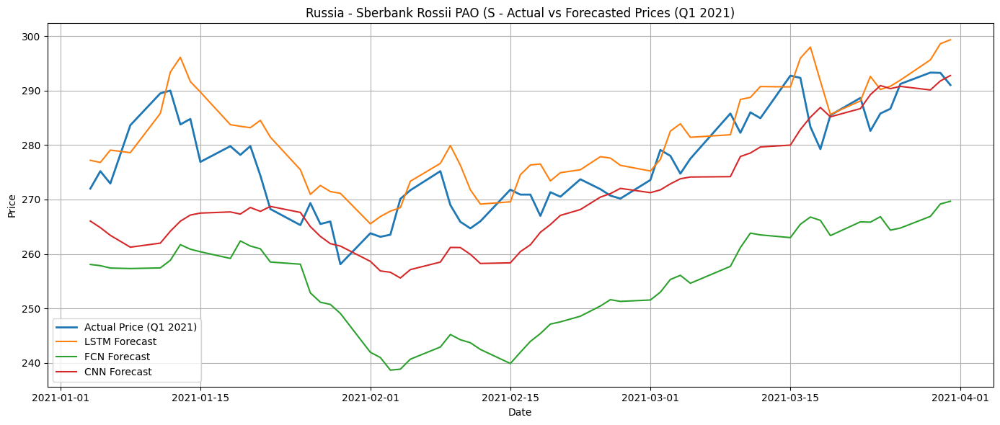

ARIMA forecast error for Turkey - Koc Holding AS (KCHOL): Prediction must have `end` after `start`.


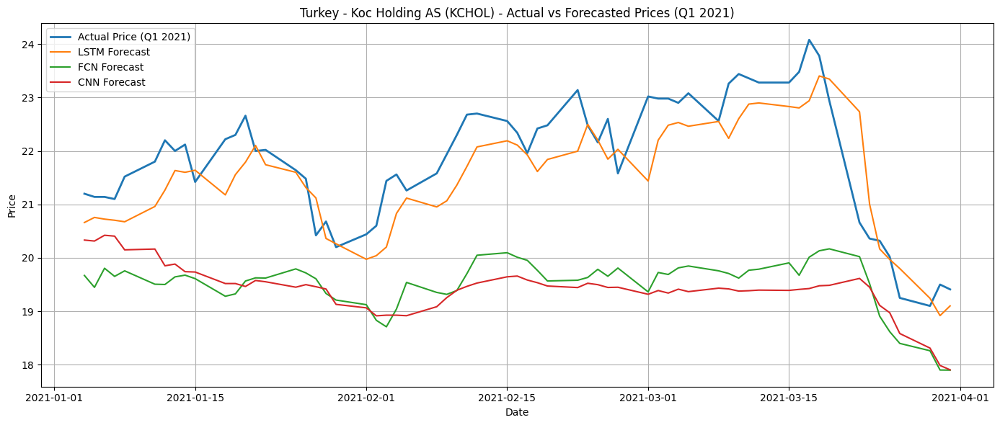

ARIMA forecast error for Egypt - Medinet Nasr Housing (M: Prediction must have `end` after `start`.


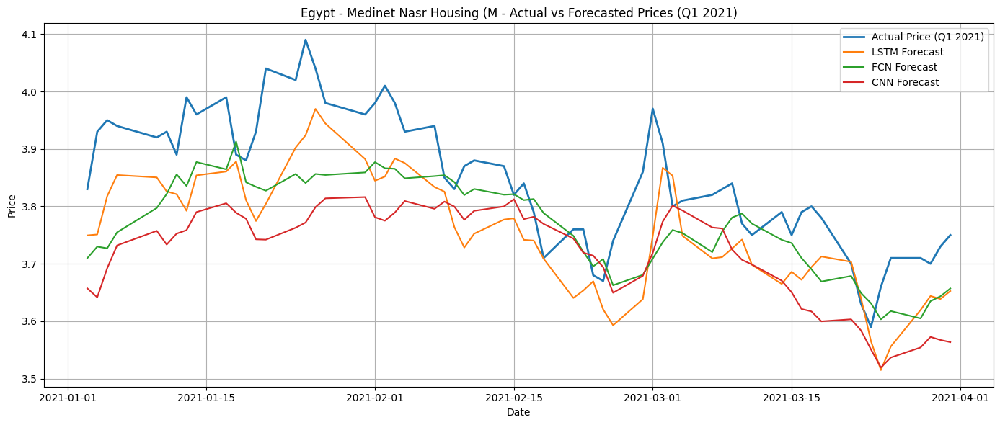

ARIMA forecast error for Brazil - Minerva SABrazil (BEEF: Prediction must have `end` after `start`.


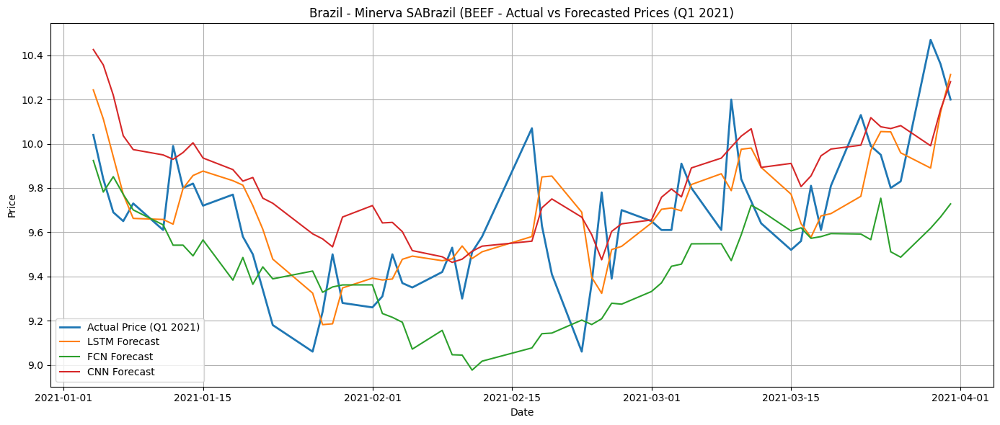

ARIMA forecast error for Argentina - Pampa Energia SA (P: Prediction must have `end` after `start`.


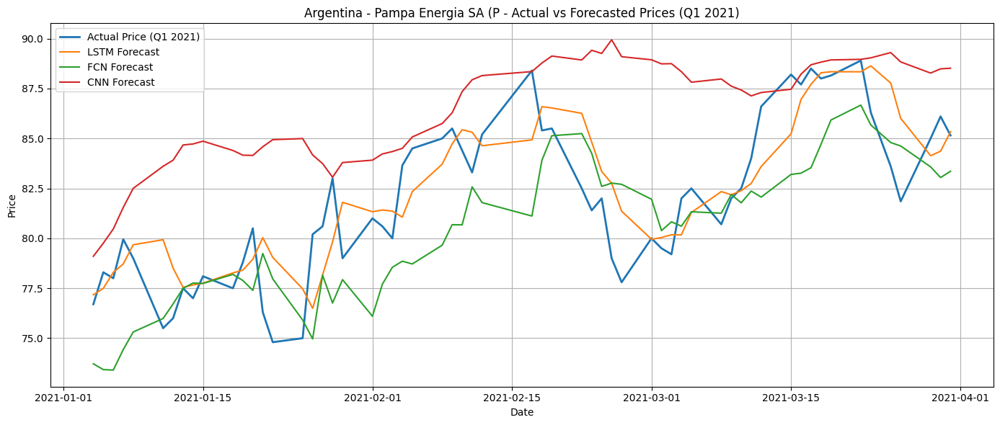

ARIMA forecast error for Colombia - Cementos Argos SA (C: Prediction must have `end` after `start`.


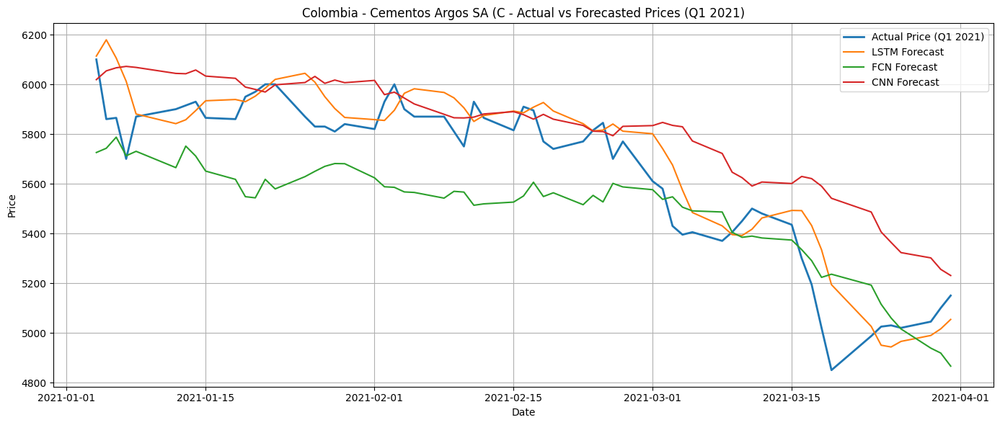

ARIMA forecast error for South Africa - Impala Platinum: Prediction must have `end` after `start`.


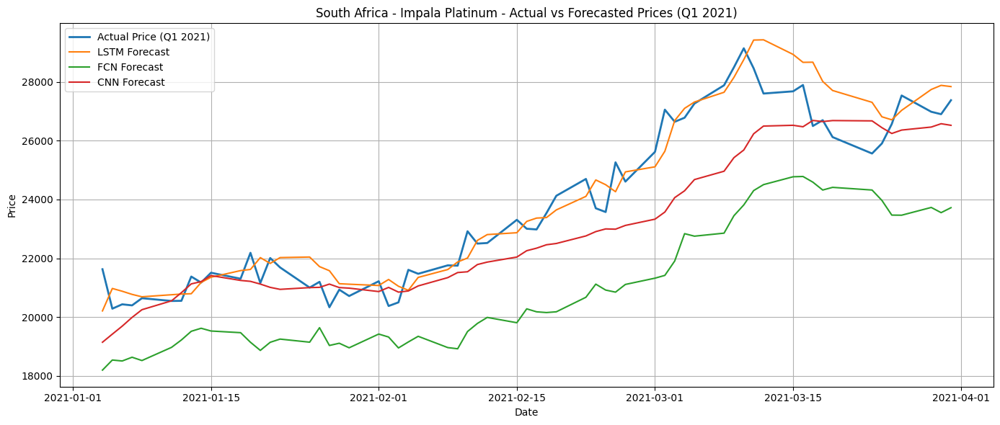

ARIMA forecast error for South Korea - Dongkuk Steel Mil: Prediction must have `end` after `start`.


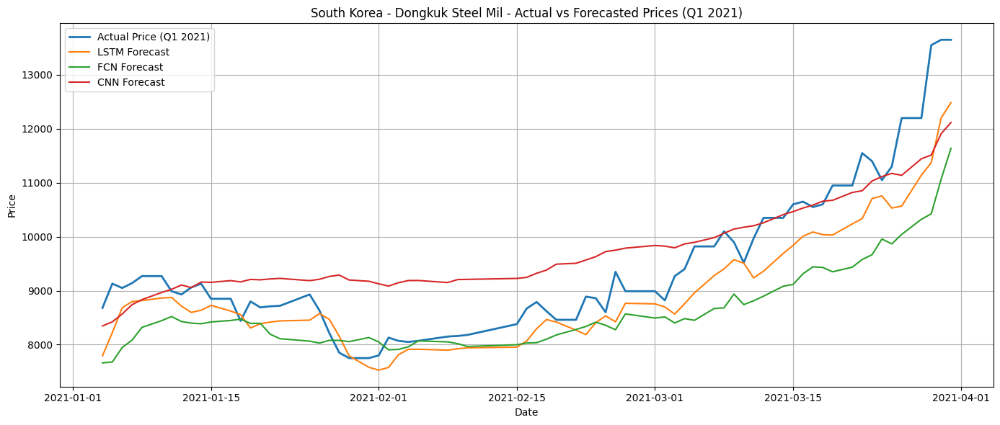

In [ ]:
import matplotlib.pyplot as plt

for company, df in stock_data.items():
    if 'Price' not in df.columns:
        continue

    df.index = pd.to_datetime(df.index)
    df.sort_index(inplace=True)

    # Actual prices for Q1 2021
    actual = pd.to_numeric(df['Price'], errors='coerce').dropna()
    actual_q1 = actual[(actual.index.year == 2021) & (actual.index.quarter == 1)]

    if actual_q1.empty:
        continue

    plt.figure(figsize=(14, 6))
    plt.plot(actual_q1.index, actual_q1.values, label='Actual Price (Q1 2021)', linewidth=2)

    # Plot ARIMA
    if company in arima_results:
        model = arima_results[company]
        try:
            arima_forecast = model.predict(start=actual_q1.index[0], end=actual_q1.index[-1])
            plt.plot(arima_forecast.index, arima_forecast.values, label='ARIMA Forecast')
        except Exception as e:
            print(f"ARIMA forecast error for {company}: {e}")

    # Plot LSTM
    if 'lstm_predictions' in globals() and company in lstm_predictions:
        plt.plot(lstm_predictions[company].index, lstm_predictions[company].values, label='LSTM Forecast')

    # Plot FCN
    if 'fcn_predictions' in globals() and company in fcn_predictions:
        plt.plot(fcn_predictions[company].index, fcn_predictions[company].values, label='FCN Forecast')

    # Plot CNN
    if 'cnn_predictions' in globals() and company in cnn_predictions:
        plt.plot(cnn_predictions[company].index, cnn_predictions[company].values, label='CNN Forecast')

    # Final touches
    plt.title(f'{company} - Actual vs Forecasted Prices (Q1 2021)')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## Stock Prediction using new

In [ ]:
import yfinance as yf
import requests
from transformers import BertTokenizer, BertModel
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import datetime
from matplotlib import pyplot as plt

In [ ]:
!pip install gnews

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.6/313.6 kB 10.1 MB/s eta 0:00:00
  Created wheel for sgmllib3k: filename=sgmllib3k-1.0.0-py3-none-any.whl size=6046 sha256=e4303f7f686bbf9fac39c5adb37e8b44e869eebc584697ca613679686f137947
  Stored in directory: /root/.cache/pip/wheels/3b/25/2a/105d6a15df6914f4d15047691c6c28f9052cc1173e40285d03
Successfully built sgmllib3k


Processing sheet: Russia - Sberbank Rossii PAO (S
Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.1824
Epoch 2/10, Loss: 0.0587
Epoch 3/10, Loss: 0.0577
Epoch 4/10, Loss: 0.0520
Epoch 5/10, Loss: 0.0388
Epoch 6/10, Loss: 0.0464
Epoch 7/10, Loss: 0.0443
Epoch 8/10, Loss: 0.0338
Epoch 9/10, Loss: 0.0328
Epoch 10/10, Loss: 0.0343
Predicting...


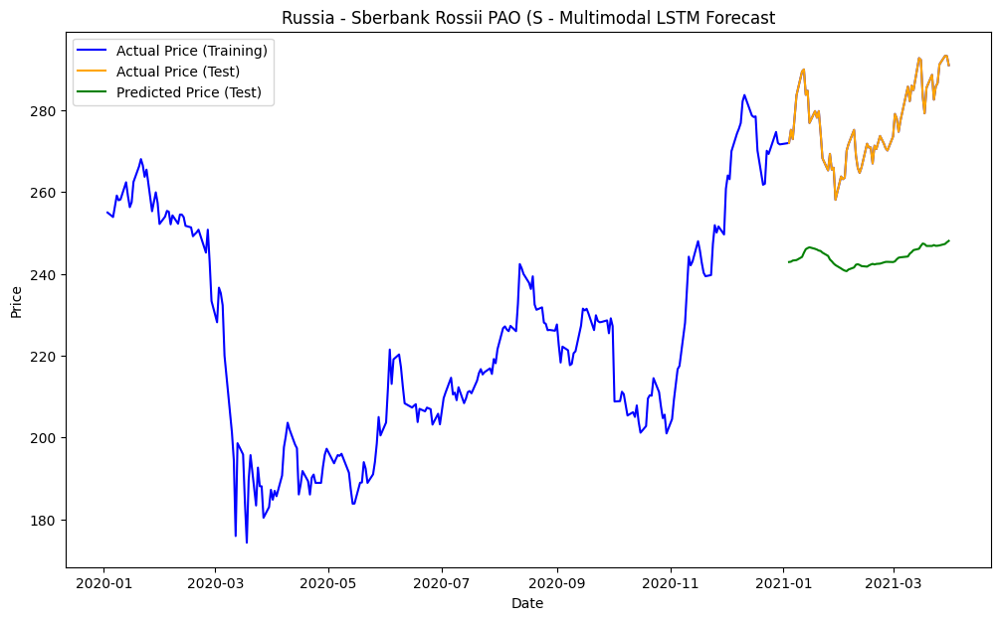

Processing sheet: Turkey - Koc Holding AS (KCHOL)
Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.2027
Epoch 2/10, Loss: 0.0542
Epoch 3/10, Loss: 0.0441
Epoch 4/10, Loss: 0.0524
Epoch 5/10, Loss: 0.0301
Epoch 6/10, Loss: 0.0343
Epoch 7/10, Loss: 0.0425
Epoch 8/10, Loss: 0.0336
Epoch 9/10, Loss: 0.0249
Epoch 10/10, Loss: 0.0269
Predicting...


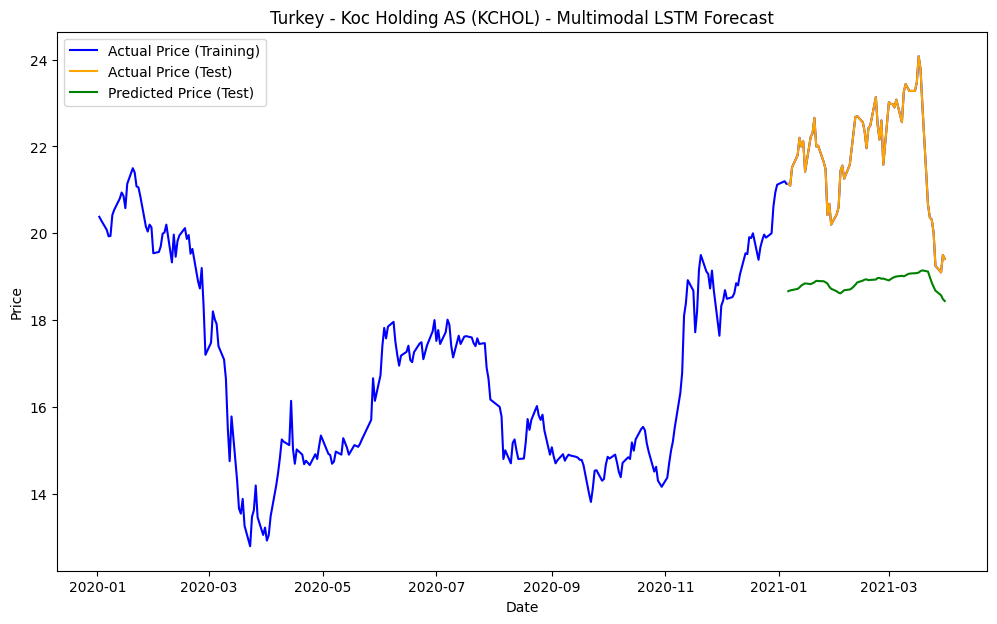

Processing sheet: Egypt - Medinet Nasr Housing (M
Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.1500
Epoch 2/10, Loss: 0.0630
Epoch 3/10, Loss: 0.0739
Epoch 4/10, Loss: 0.0543
Epoch 5/10, Loss: 0.0441
Epoch 6/10, Loss: 0.0516
Epoch 7/10, Loss: 0.0352
Epoch 8/10, Loss: 0.0261
Epoch 9/10, Loss: 0.0303
Epoch 10/10, Loss: 0.0117
Predicting...


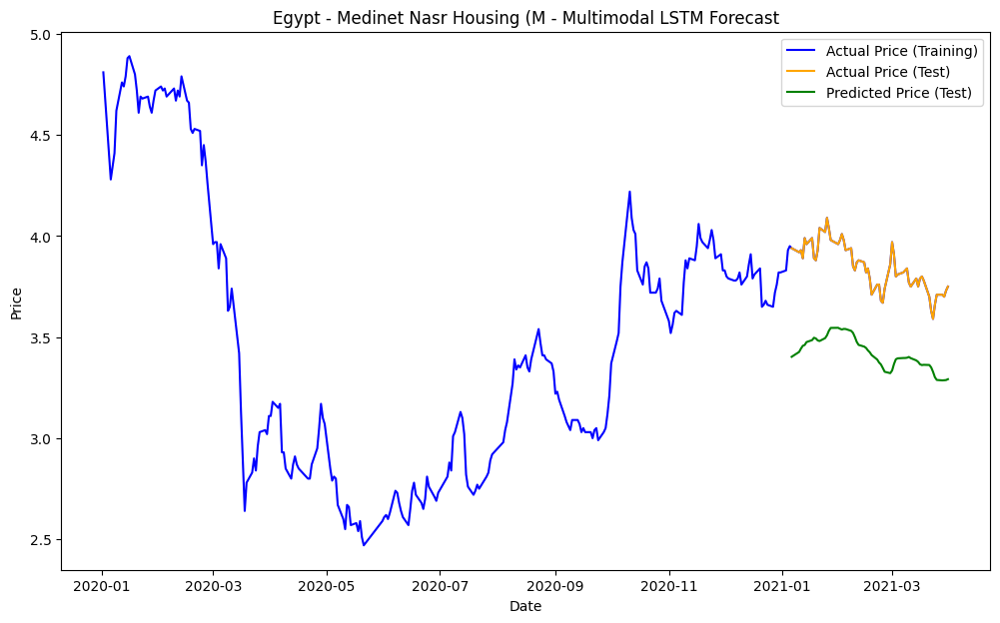

Processing sheet: Brazil - Minerva SABrazil (BEEF
Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.4373
Epoch 2/10, Loss: 0.1824
Epoch 3/10, Loss: 0.0561
Epoch 4/10, Loss: 0.0646
Epoch 5/10, Loss: 0.0793
Epoch 6/10, Loss: 0.0432
Epoch 7/10, Loss: 0.0401
Epoch 8/10, Loss: 0.0588
Epoch 9/10, Loss: 0.0559
Epoch 10/10, Loss: 0.0408
Predicting...


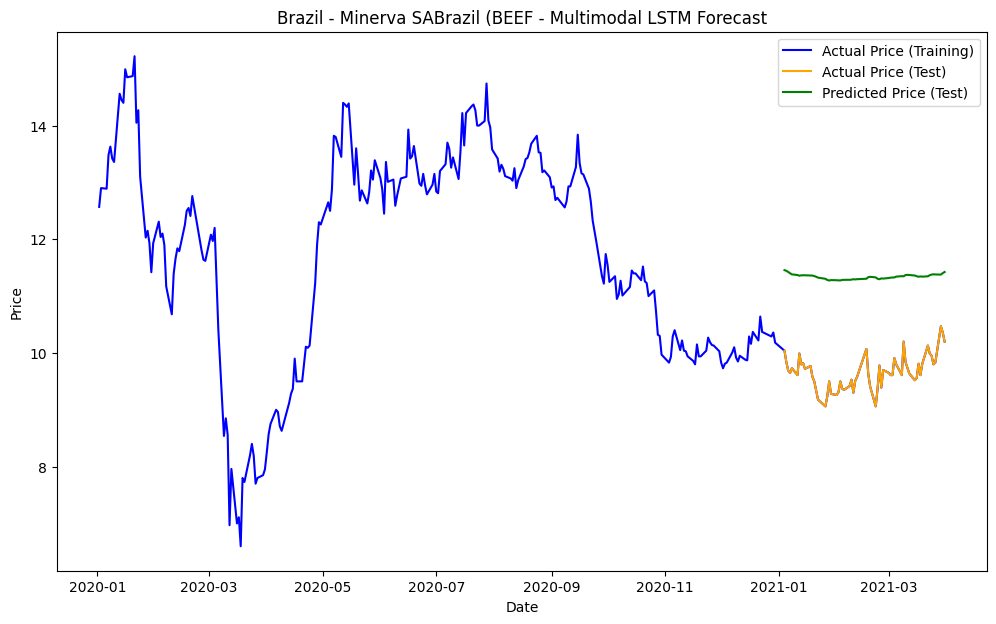

Processing sheet: Argentina - Pampa Energia SA (P


<ipython-input-8-d16a14946d4e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = pd.to_datetime(df['Date'])


Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.1938
Epoch 2/10, Loss: 0.0670
Epoch 3/10, Loss: 0.0782
Epoch 4/10, Loss: 0.0650
Epoch 5/10, Loss: 0.0490
Epoch 6/10, Loss: 0.0564
Epoch 7/10, Loss: 0.0581
Epoch 8/10, Loss: 0.0464
Epoch 9/10, Loss: 0.0376
Epoch 10/10, Loss: 0.0414
Predicting...


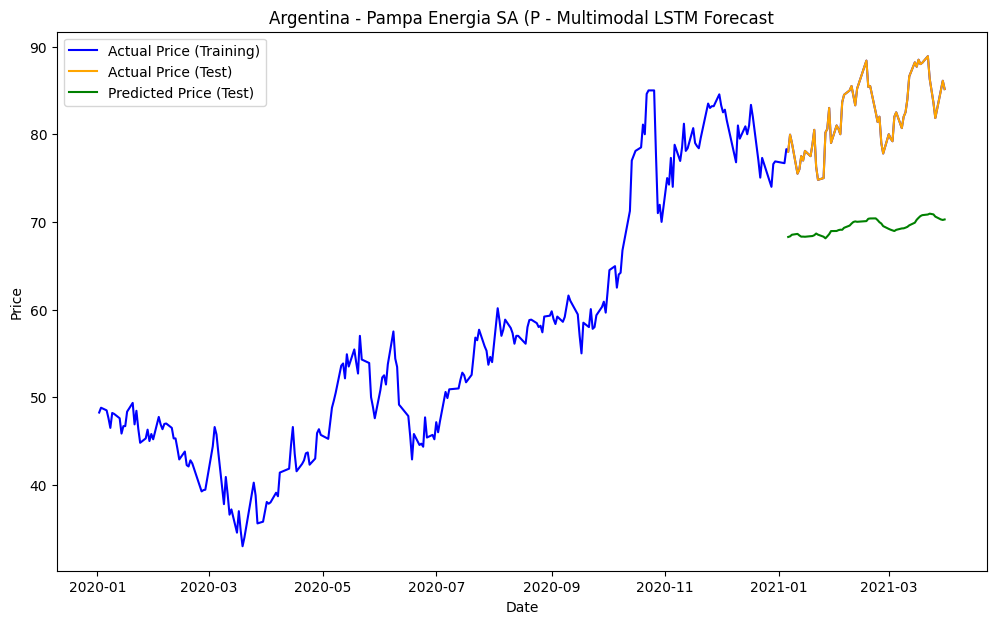

Processing sheet: Colombia - Cementos Argos SA (C
Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.2818
Epoch 2/10, Loss: 0.0966
Epoch 3/10, Loss: 0.0363
Epoch 4/10, Loss: 0.0721
Epoch 5/10, Loss: 0.0476
Epoch 6/10, Loss: 0.0306
Epoch 7/10, Loss: 0.0450
Epoch 8/10, Loss: 0.0501
Epoch 9/10, Loss: 0.0389
Epoch 10/10, Loss: 0.0288
Predicting...


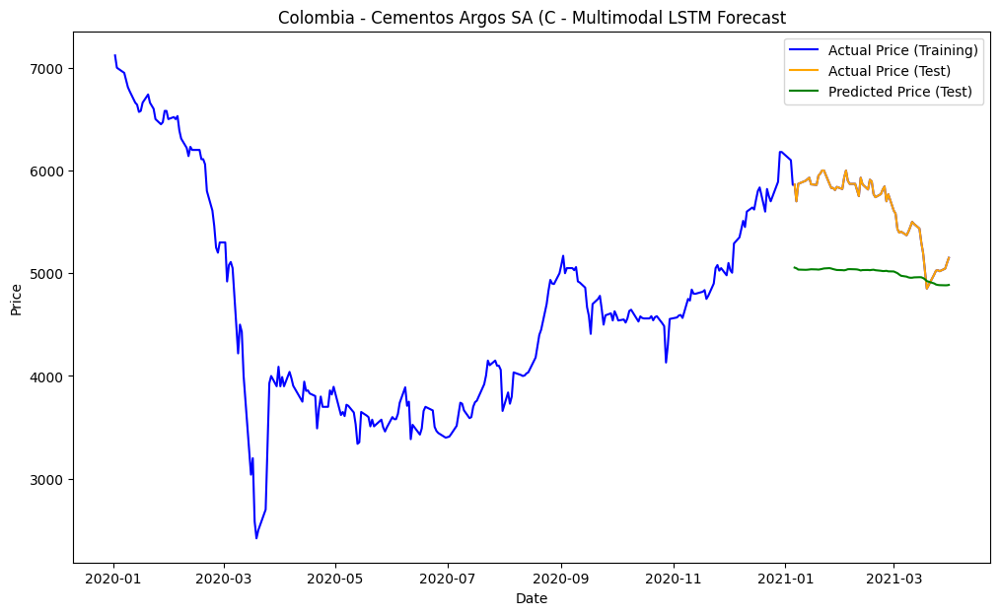

Processing sheet: South Africa - Impala Platinum 
Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.2386
Epoch 2/10, Loss: 0.0700
Epoch 3/10, Loss: 0.0168
Epoch 4/10, Loss: 0.0435
Epoch 5/10, Loss: 0.0307
Epoch 6/10, Loss: 0.0150
Epoch 7/10, Loss: 0.0228
Epoch 8/10, Loss: 0.0294
Epoch 9/10, Loss: 0.0242
Epoch 10/10, Loss: 0.0168
Predicting...


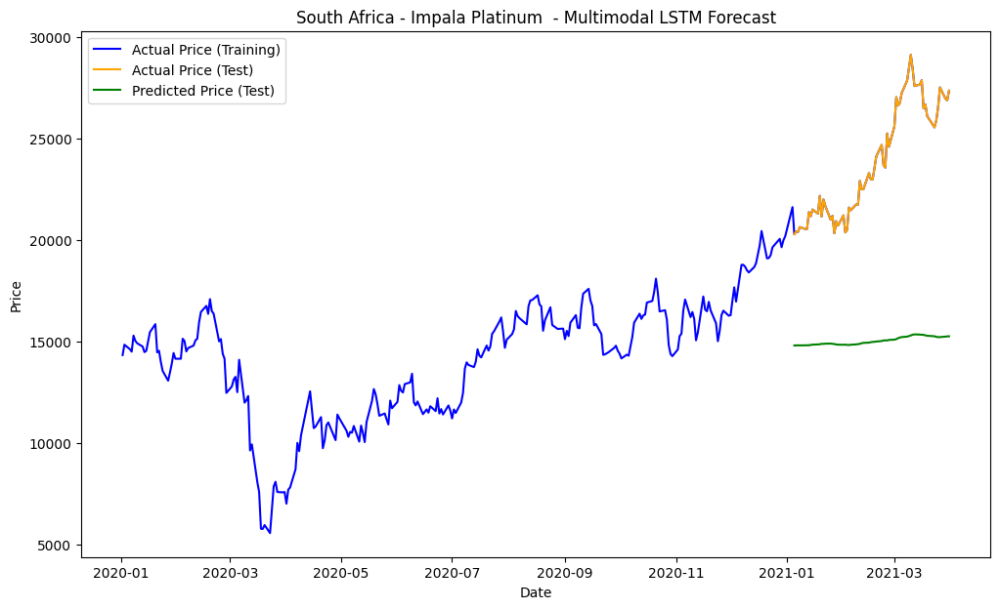

Processing sheet: South Korea - Dongkuk Steel Mil
Fetching news headlines...
Encoding news...
Preparing data...
Initializing model...
Training...
Epoch 1/10, Loss: 0.0455
Epoch 2/10, Loss: 0.0159
Epoch 3/10, Loss: 0.0168
Epoch 4/10, Loss: 0.0130
Epoch 5/10, Loss: 0.0154
Epoch 6/10, Loss: 0.0107
Epoch 7/10, Loss: 0.0127
Epoch 8/10, Loss: 0.0097
Epoch 9/10, Loss: 0.0094
Epoch 10/10, Loss: 0.0079
Predicting...


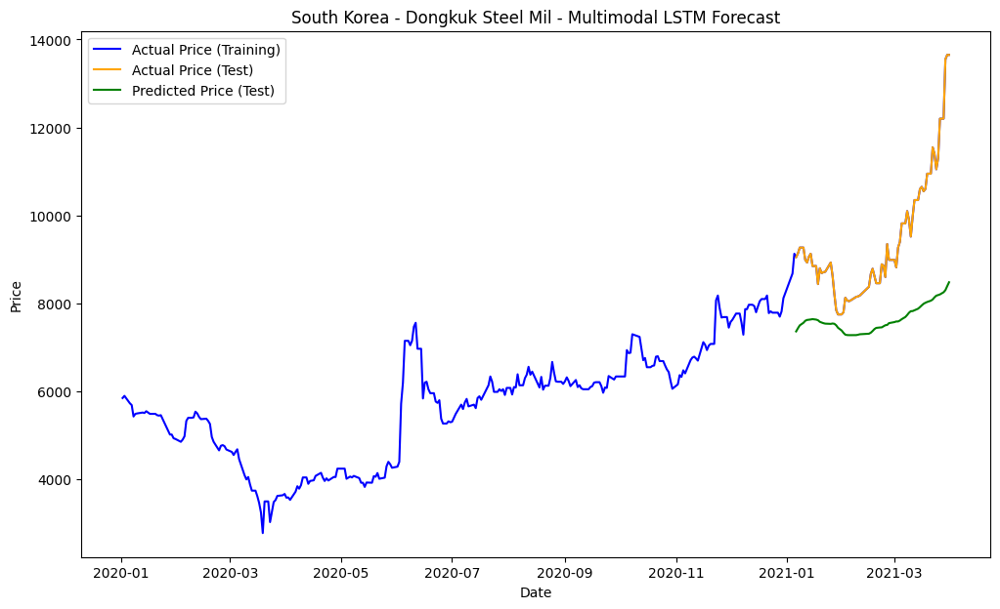

In [ ]:
# 1. Fetch stock data from Excel
def fetch_stock_data(file_path, sheet_name):
    df = pd.read_excel(file_path, sheet_name=sheet_name)
    df = df[pd.to_datetime(df['Date'], errors='coerce').notna()]
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.set_index('Date')
    df['Price'] = pd.to_numeric(df['Price'], errors='coerce')
    df = df.dropna(subset=['Price'])
    df = df.sort_index()
    return df[['Price']]

# 2. Fetch news headlines (Example with GNews)


def fetch_news(query, from_date, to_date):
    google_news = GNews()
    google_news.start_date = datetime.datetime.strptime(from_date, '%Y-%m-%d')
    google_news.end_date = datetime.datetime.strptime(to_date, '%Y-%m-%d')
    google_news.max_results = 50
    news = google_news.get_news(query)
    headlines = [article['title'] for article in news]
    return headlines

# 3. Encode news using BERT
class NewsEncoder:
    def __init__(self, model_name='bert-base-uncased'):
        self.tokenizer = BertTokenizer.from_pretrained(model_name)
        self.model = BertModel.from_pretrained(model_name)

    def encode(self, texts):
        if not texts:
            texts = ["no news available"]
        inputs = self.tokenizer(texts, return_tensors='pt', padding=True, truncation=True, max_length=128)
        with torch.no_grad():
            outputs = self.model(**inputs)
        embeddings = outputs.last_hidden_state[:, 0, :]
        return embeddings

# 4. Build Multimodal LSTM
class MultiModalLSTM(nn.Module):
    def __init__(self, price_dim, news_dim, hidden_dim=128, num_layers=2):
        super(MultiModalLSTM, self).__init__()
        self.price_fc = nn.Linear(1, hidden_dim)
        self.news_fc = nn.Linear(news_dim, hidden_dim)
        self.lstm = nn.LSTM(hidden_dim, hidden_dim, num_layers=num_layers, batch_first=True)
        self.fc_out = nn.Linear(hidden_dim, 1)

    def forward(self, price_series, news_embeddings):
        price_embed = self.price_fc(price_series)
        news_embed = self.news_fc(news_embeddings).unsqueeze(1).expand(-1, price_embed.size(1), -1)
        combined = price_embed + news_embed
        lstm_out, _ = self.lstm(combined)
        out = self.fc_out(lstm_out[:, -1, :])
        return out

# 5. Example pipeline
def main():
    file_path = '/content/2020Q1Q2Q3Q4-2021Q1.xlsx'
    sheet_names = pd.ExcelFile(file_path).sheet_names

    for sheet_name in sheet_names:
        print(f"Processing sheet: {sheet_name}")
        stock_data = fetch_stock_data(file_path, sheet_name)

        start_date = stock_data.index.min().strftime('%Y-%m-%d')
        end_date = stock_data.index.max().strftime('%Y-%m-%d')

        print("Fetching news headlines...")
        headlines = fetch_news(sheet_name, start_date, end_date)

        print("Encoding news...")
        encoder = NewsEncoder()
        news_embeddings = encoder.encode(headlines)
        news_embeddings = news_embeddings.mean(dim=0)

        print("Preparing data...")
        scaler = MinMaxScaler()
        stock_scaled = scaler.fit_transform(stock_data[['Price']])
        stock_tensor = torch.tensor(stock_scaled, dtype=torch.float32)

        window_size = 10
        X = []
        y = []
        for i in range(window_size, len(stock_tensor)):
            X.append(stock_tensor[i-window_size:i])
            y.append(stock_tensor[i])

        X = torch.stack(X)
        y = torch.stack(y)

        train_size = int(0.8 * len(X))
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        print("Initializing model...")
        model = MultiModalLSTM(price_dim=1, news_dim=news_embeddings.shape[0])

        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

        print("Training...")
        epochs = 10
        for epoch in range(epochs):
            model.train()
            optimizer.zero_grad()
            news_batch = news_embeddings.unsqueeze(0).expand(X_train.size(0), -1)
            preds = model(X_train, news_batch)
            loss = criterion(preds.squeeze(), y_train.squeeze())
            loss.backward()
            optimizer.step()
            print(f"Epoch {epoch+1}/{epochs}, Loss: {loss.item():.4f}")

        print("Predicting...")
        model.eval()
        news_batch = news_embeddings.unsqueeze(0).expand(X_test.size(0), -1)
        preds = model(X_test, news_batch)
        preds = preds.detach().cpu().numpy()
        preds_rescaled = scaler.inverse_transform(preds)
        y_test_rescaled = scaler.inverse_transform(y_test.cpu().numpy())

        dates = stock_data.index
        train_dates = dates[window_size:train_size + window_size]
        test_dates = dates[train_size + window_size:]

        plt.figure(figsize=(12, 7))
        plt.plot(dates, scaler.inverse_transform(stock_tensor.numpy()), label=f'Actual Price (Training)', color='blue')
        plt.plot(test_dates, y_test_rescaled, label=f'Actual Price (Test)', color='orange')
        plt.plot(test_dates, preds_rescaled, label=f'Predicted Price (Test)', color='green')

        plt.title(f'{sheet_name} - Multimodal LSTM Forecast')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

if __name__ == '__main__':
    main()

In [ ]:
!pip install git+https://github.com/amazon-science/chronos-forecasting.git


  Cloning https://github.com/amazon-science/chronos-forecasting.git to /tmp/pip-req-build-rqownj2q
  Running command git clone --filter=blob:none --quiet https://github.com/amazon-science/chronos-forecasting.git /tmp/pip-req-build-rqownj2q
  Resolved https://github.com/amazon-science/chronos-forecasting.git to commit 6a9c8dadac04eb85befc935043e3e2cce914267f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 49.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from chronos import ChronosPipeline

In [ ]:
pipeline = ChronosPipeline.from_pretrained(
  "amazon/chronos-t5-small",
  device_map="cpu",
  torch_dtype=torch.bfloat16,
)

config.json:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/185M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/142 [00:00<?, ?B/s]

In [ ]:
stock_data['Russia - Sberbank Rossii PAO (S']["Price"]

,Price
Date,
2021-03-31,291.02
2021-03-30,293.25
2021-03-29,293.3
2021-03-26,291.22
2021-03-25,286.66
...,...
2020-01-10,258.19
2020-01-09,257.99
2020-01-08,259.15


In [ ]:
context = torch.tensor(stock_data['Russia - Sberbank Rossii PAO (S']["Price"])

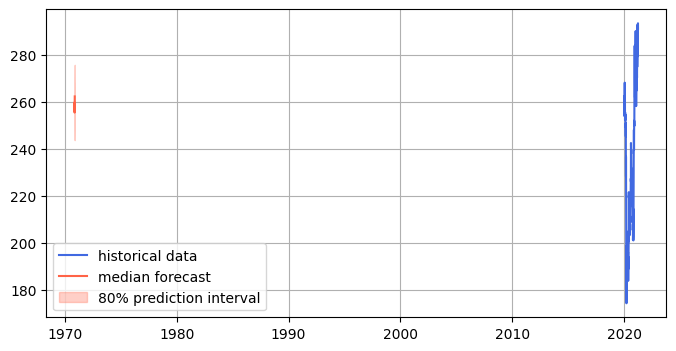

In [ ]:
prediction_length = 12
forecast = pipeline.predict(context, prediction_length)  # shape [num_series, num_samples, prediction_length]

# visualize the forecast
forecast_index = range(len(stock_data['Russia - Sberbank Rossii PAO (S']), len(stock_data['Russia - Sberbank Rossii PAO (S']) + prediction_length)
low, median, high = np.quantile(forecast[0].numpy(), [0.1, 0.5, 0.9], axis=0)

plt.figure(figsize=(8, 4))
plt.plot(stock_data['Russia - Sberbank Rossii PAO (S']["Price"], color="royalblue", label="historical data")
plt.plot(forecast_index, median, color="tomato", label="median forecast")
plt.fill_between(forecast_index, low, high, color="tomato", alpha=0.3, label="80% prediction interval")
plt.legend()
plt.grid()
plt.show()

In [ ]:
forecast[0].numpy().shape

(20, 12)

In [ ]:
forecast[0]

tensor([[261.3464, 257.9077, 257.9077, 261.3464, 261.3464, 261.3464, 263.0658,
         266.5046, 263.0658, 268.2239, 273.3821, 275.1015],
        [257.9077, 259.6270, 259.6270, 264.7852, 266.5046, 264.7852, 263.0658,
         263.0658, 264.7852, 264.7852, 264.7852, 266.5046],
        [257.9077, 261.3464, 264.7852, 268.2239, 266.5046, 264.7852, 268.2239,
         263.0658, 264.7852, 266.5046, 268.2239, 266.5046],
        [249.3107, 242.4332, 244.1526, 247.5914, 245.8719, 240.7138, 244.1526,
         245.8719, 247.5914, 247.5914, 242.4332, 233.8363],
        [251.0301, 252.7495, 254.4689, 252.7495, 252.7495, 257.9077, 256.1883,
         256.1883, 256.1883, 256.1883, 259.6270, 254.4689],
        [259.6270, 257.9077, 247.5914, 245.8719, 247.5914, 245.8719, 252.7495,
         254.4689, 256.1883, 261.3464, 263.0658, 261.3464],
        [254.4689, 251.0301, 245.8719, 251.0301, 251.0301, 256.1883, 252.7495,
         252.7495, 254.4689, 252.7495, 249.3107, 249.3107],
        [249.3107, 245.8719

Processing: Russia - Sberbank Rossii PAO (S


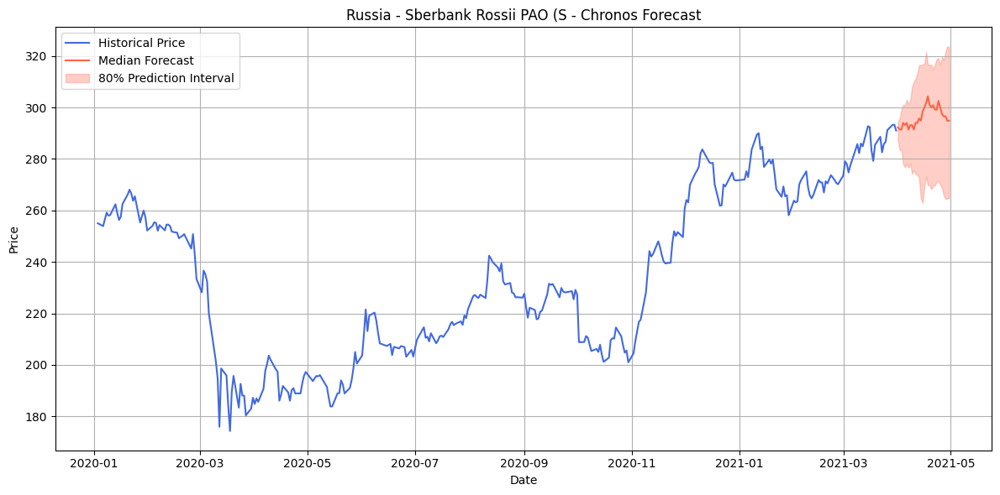

Processing: Turkey - Koc Holding AS (KCHOL)


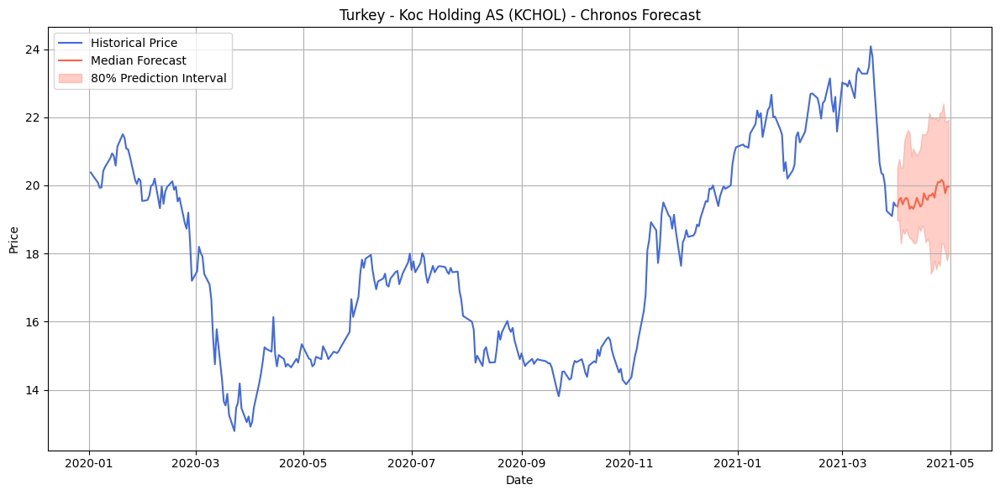

Processing: Egypt - Medinet Nasr Housing (M


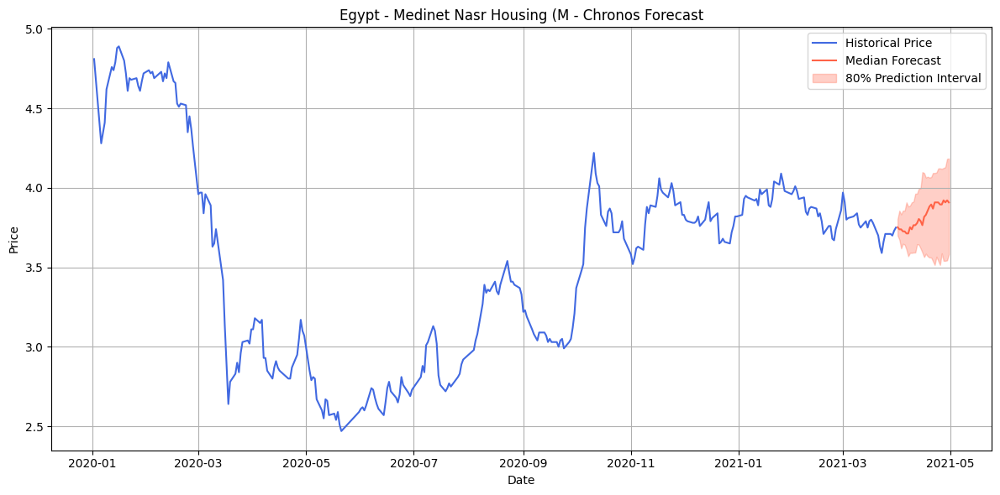

Processing: Brazil - Minerva SABrazil (BEEF


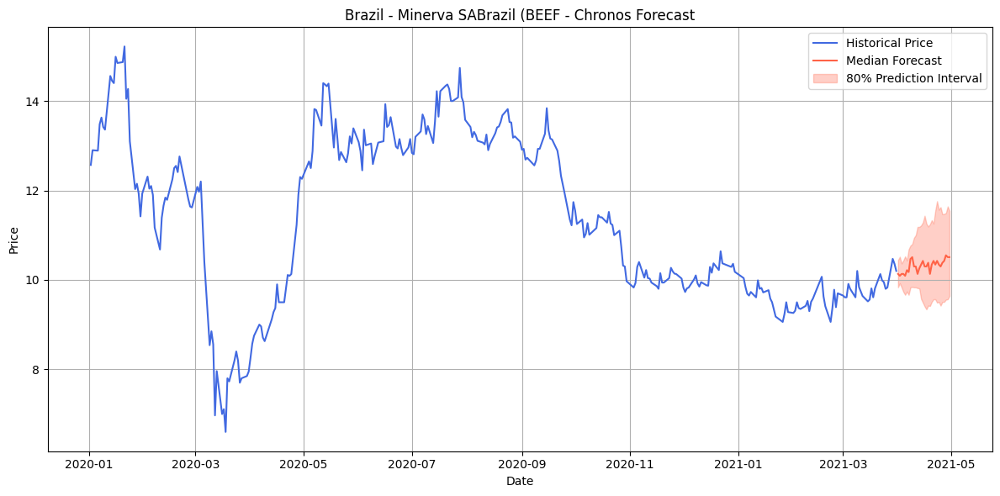

Processing: Argentina - Pampa Energia SA (P


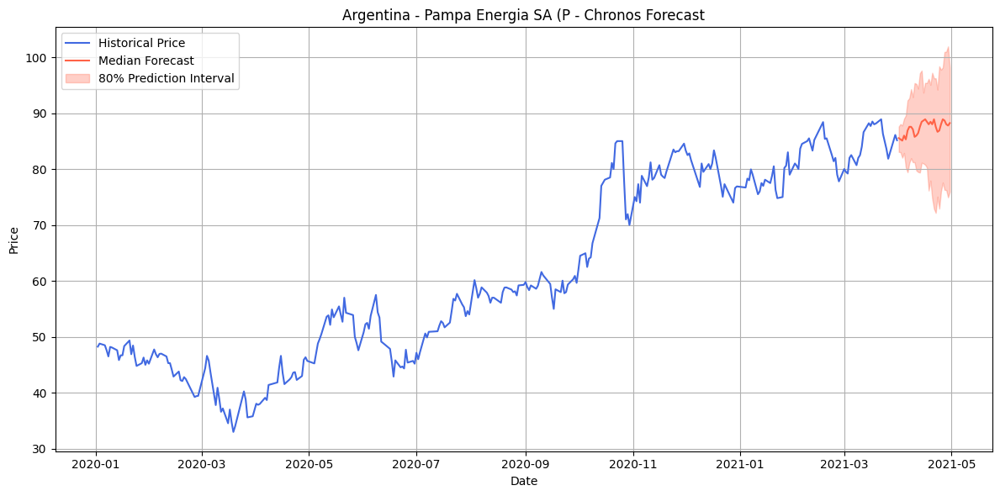

Processing: Colombia - Cementos Argos SA (C


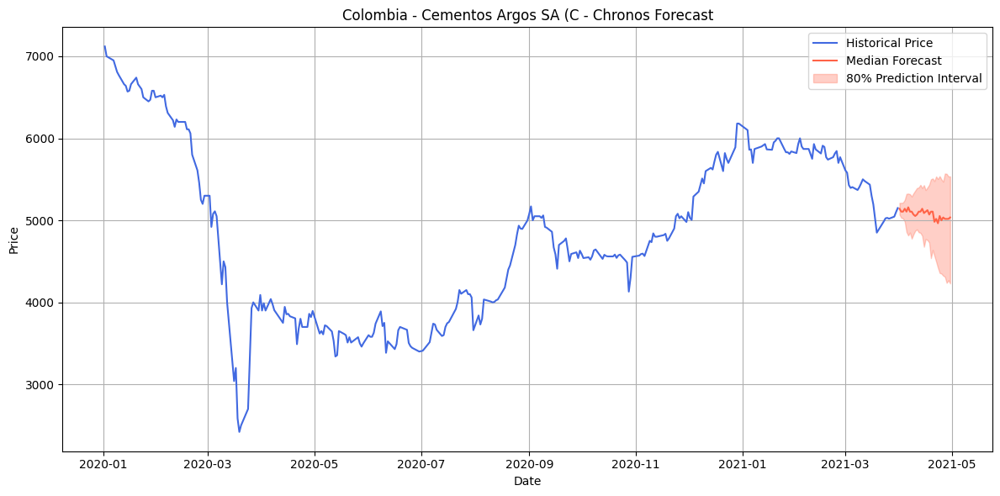

Processing: South Africa - Impala Platinum 


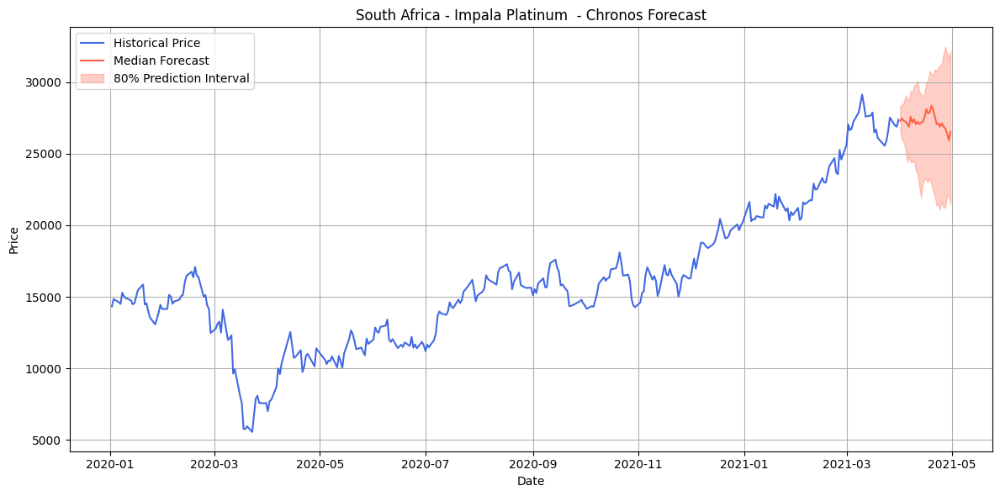

Processing: South Korea - Dongkuk Steel Mil


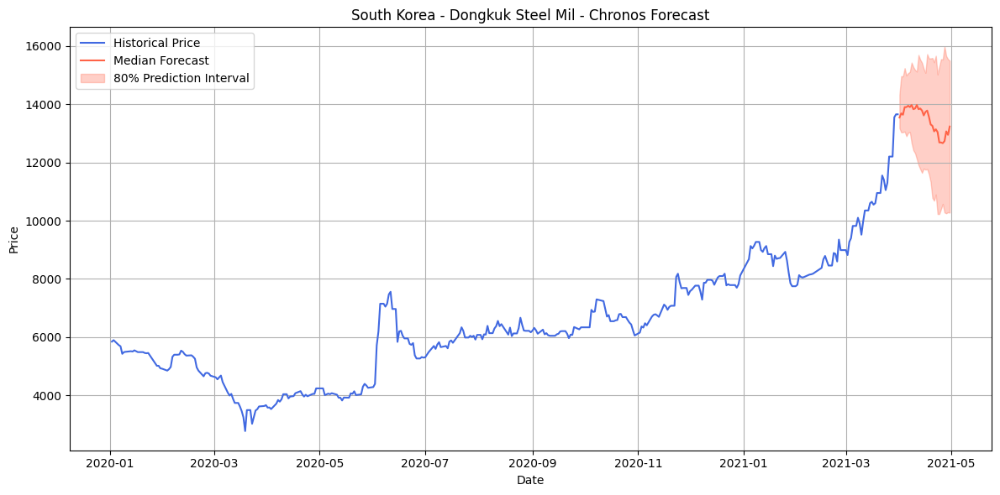

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from chronos import ChronosPipeline

# 1. Load stock data from Excel
def fetch_stock_data(file_path, sheet_name):
    df = pd.read_excel(file_path, sheet_name=sheet_name)
    df = df[pd.to_datetime(df['Date'], errors='coerce').notna()]
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.set_index('Date')
    df['Price'] = pd.to_numeric(df['Price'], errors='coerce')
    df = df.dropna(subset=['Price'])
    df = df.sort_index()
    return df[['Price']]

# 2. Forecast using Chronos model
def forecast_with_chronos(prices, prediction_length=30):
    context = torch.tensor(prices.values.squeeze(), dtype=torch.float32)

    pipeline = ChronosPipeline.from_pretrained(
        "amazon/chronos-t5-small",
        device_map="cpu",  # Set to "cuda" if using GPU
        torch_dtype=torch.float32
    )

    forecast = pipeline.predict(context, prediction_length)
    low, median, high = np.quantile(forecast[0].numpy(), [0.1, 0.5, 0.9], axis=0)
    return low, median, high

# 3. Main routine
def main():
    file_path = '/content/2020Q1Q2Q3Q4-2021Q1.xlsx'  # Replace with your file path
    sheet_names = pd.ExcelFile(file_path).sheet_names

    for sheet_name in sheet_names:
        print(f"Processing: {sheet_name}")
        df = fetch_stock_data(file_path, sheet_name)

        low, median, high = forecast_with_chronos(df['Price'], prediction_length=30)
        future_dates = pd.date_range(df.index[-1], periods=31, freq='D')[1:]

        plt.figure(figsize=(12, 6))
        plt.plot(df.index, df['Price'], label='Historical Price', color='royalblue')
        plt.plot(future_dates, median, label='Median Forecast', color='tomato')
        plt.fill_between(future_dates, low, high, alpha=0.3, color='tomato', label='80% Prediction Interval')
        plt.title(f"{sheet_name} - Chronos Forecast")
        plt.xlabel("Date")
        plt.ylabel("Price")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

if __name__ == '__main__':
    main()


TimesFM

In [ ]:
import timesfm

tfm = timesfm.TimesFm(
    context_len=<context>,
    horizon_len=<horizon>,
    input_patch_len=32,
    output_patch_len=128,
    num_layers=20,
    model_dims=1280,
    backend=<backend>,
)
tfm.load_from_checkpoint(repo_id="google/timesfm-1.0-200m")


SyntaxError: invalid syntax (ipython-input-27-923637575.py, line 4)

Processing: Russia - Sberbank Rossii PAO (S
Original length: 301, Trimmed to: 288


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

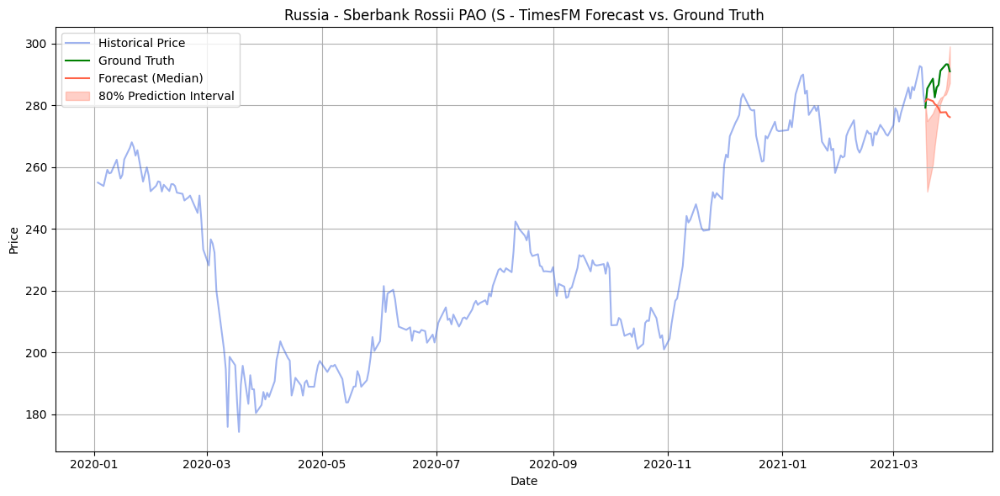

Processing: Turkey - Koc Holding AS (KCHOL)
Original length: 305, Trimmed to: 288


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

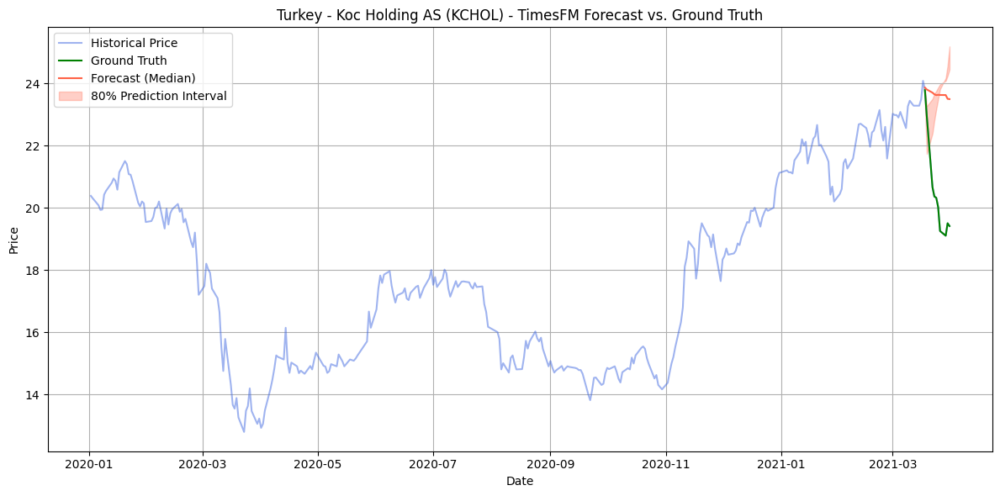

Processing: Egypt - Medinet Nasr Housing (M
Original length: 295, Trimmed to: 288


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

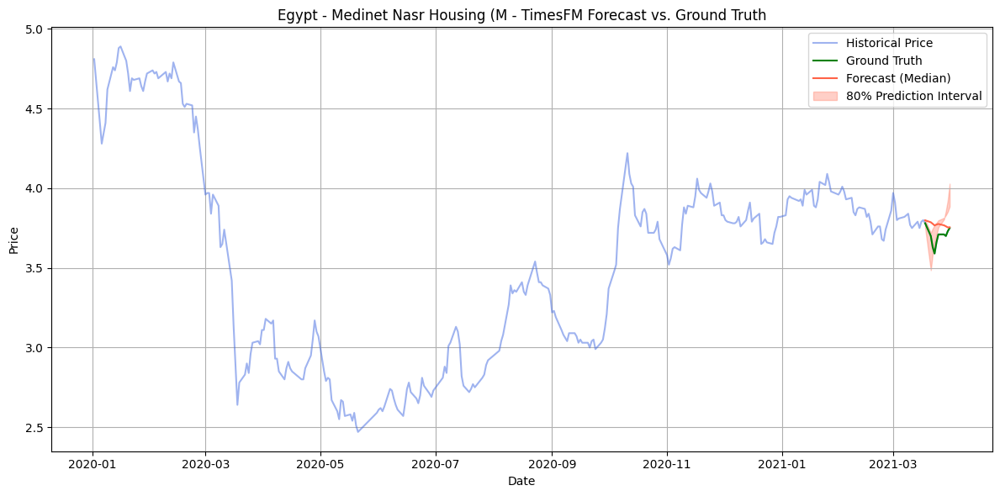

Processing: Brazil - Minerva SABrazil (BEEF
Original length: 299, Trimmed to: 288


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

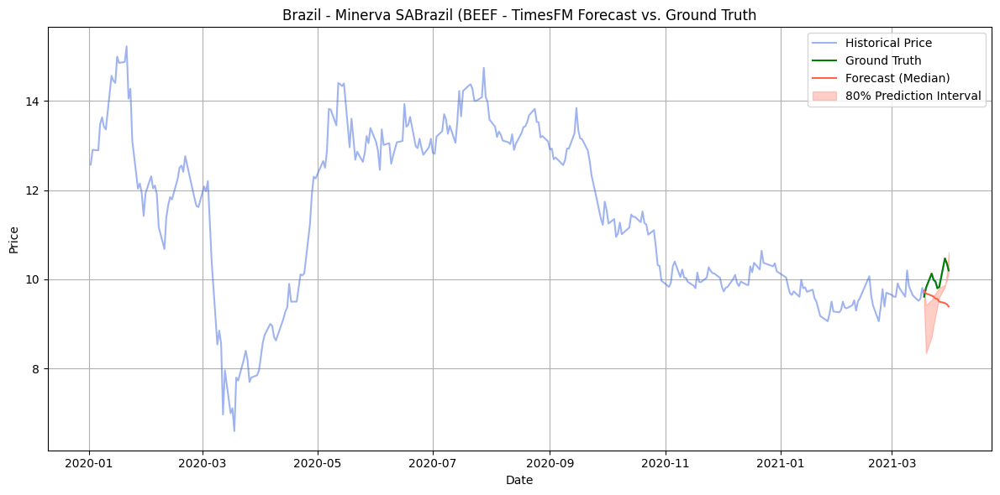

Processing: Argentina - Pampa Energia SA (P
Original length: 290, Trimmed to: 288


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

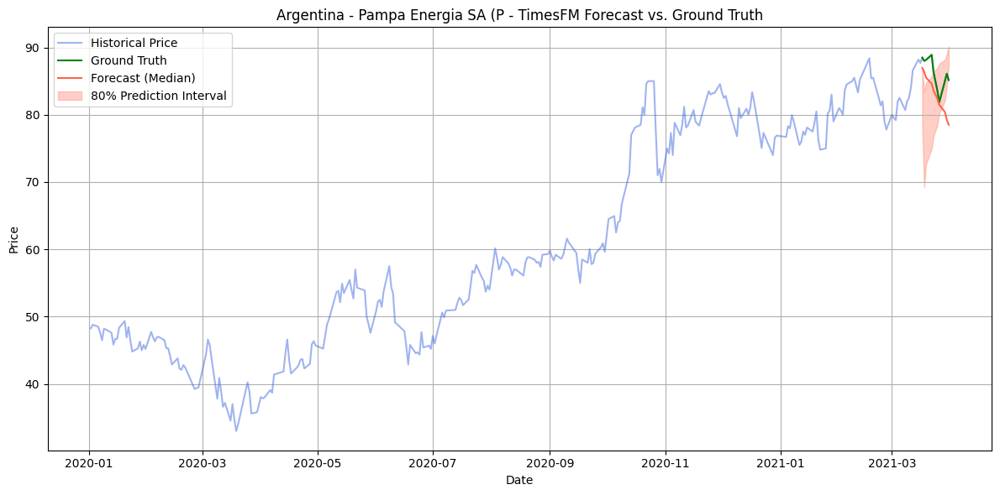

Processing: Colombia - Cementos Argos SA (C
Original length: 293, Trimmed to: 288


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

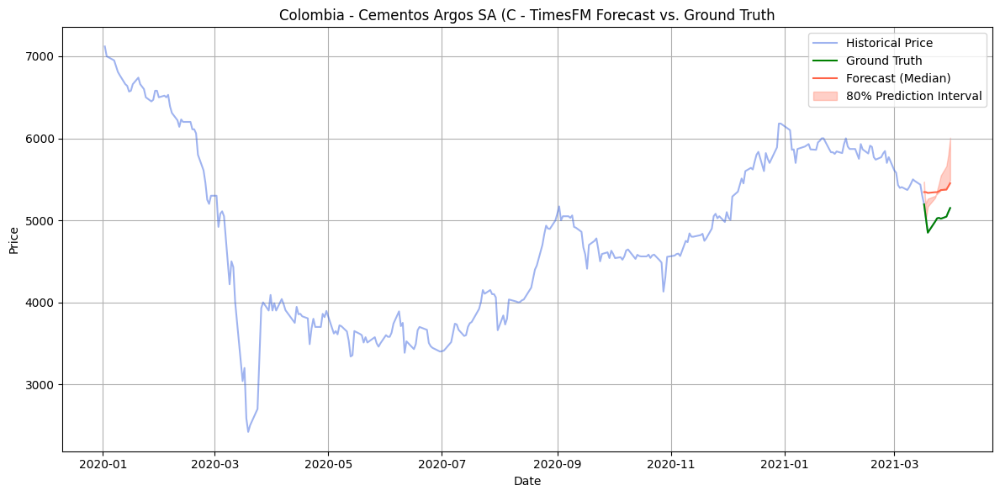

Processing: South Africa - Impala Platinum 
Original length: 304, Trimmed to: 288


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

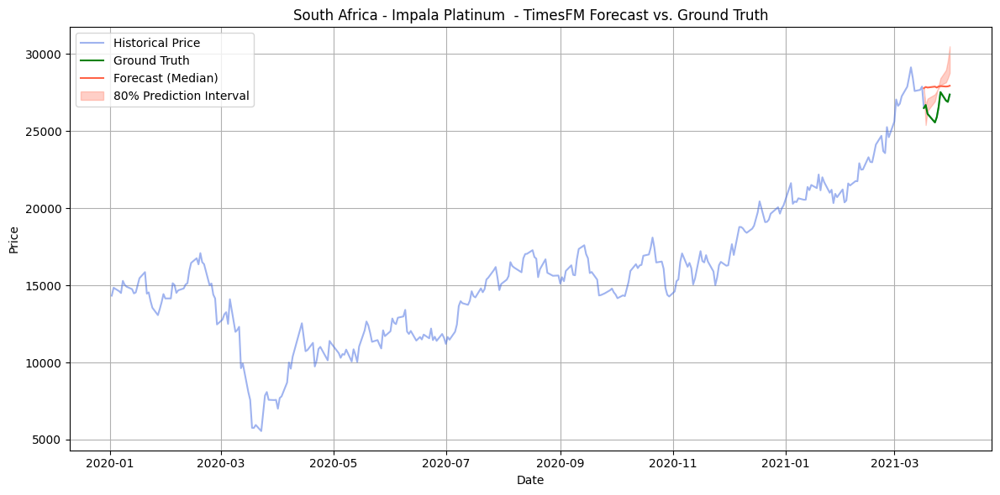

Processing: South Korea - Dongkuk Steel Mil
Original length: 331, Trimmed to: 320


Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

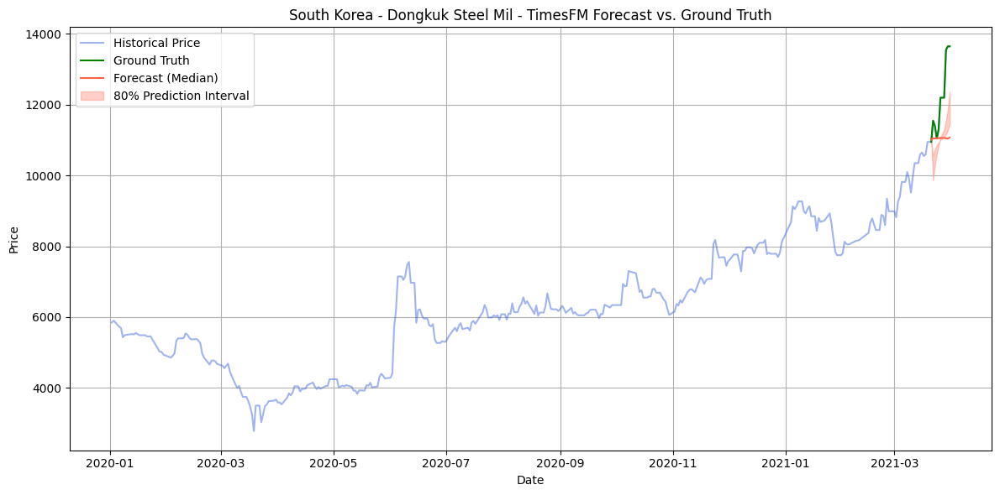

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import timesfm

# 1. Load stock data from Excel
def fetch_stock_data(file_path, sheet_name):
    df = pd.read_excel(file_path, sheet_name=sheet_name)
    df = df[pd.to_datetime(df['Date'], errors='coerce').notna()]
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.set_index('Date')
    df['Price'] = pd.to_numeric(df['Price'], errors='coerce')
    df = df.dropna(subset=['Price'])
    df = df.sort_index()
    return df[['Price']]

# 2. Forecast using TimesFM model
def forecast_with_timesfm(df, prediction_length=10):
    original_len = len(df)
    patch_len = 32
    trimmed_len = original_len - (original_len % patch_len)
    df_trimmed = df[-trimmed_len:]

    print(f"Original length: {original_len}, Trimmed to: {trimmed_len}")

    tfm = timesfm.TimesFm(
        hparams=timesfm.TimesFmHparams(
            backend="cpu",
            per_core_batch_size=32,
            horizon_len=prediction_length,
            num_layers=50,
            use_positional_embedding=False,
            context_len=trimmed_len,
        ),
        checkpoint=timesfm.TimesFmCheckpoint(
            huggingface_repo_id="google/timesfm-2.0-500m-pytorch"),
    )

    forecast_input = [df_trimmed['Price'].values]
    frequency_input = [0]

    point_forecast, quantile_forecast = tfm.forecast(
        forecast_input,
        freq=frequency_input,
    )

    # Slice to match length of prediction (safety check)
    median = np.array(point_forecast[0])[:prediction_length]
    quantiles = np.array(quantile_forecast[0])  # shape: (num_quantiles, horizon_len)

    if quantiles.shape[1] < prediction_length:
        raise ValueError(f"Quantile forecast returned less steps ({quantiles.shape[1]}) than expected ({prediction_length})")

    low = quantiles[0][:prediction_length]
    high = quantiles[-1][:prediction_length]

    return median, low, high


# 3. Main routine
def main():
    file_path = '/content/2020Q1Q2Q3Q4-2021Q1.xlsx'
    prediction_length = 10
    sheet_names = pd.ExcelFile(file_path).sheet_names

    for sheet_name in sheet_names:
        print(f"Processing: {sheet_name}")
        df = fetch_stock_data(file_path, sheet_name)

        # Use all except last 10 as context
        context_df = df[:-prediction_length]
        ground_truth = df[-prediction_length:]

        # Forecast the last 10 days
        median, low, high = forecast_with_timesfm(context_df, prediction_length=prediction_length)
        forecast_dates = ground_truth.index  # use real timestamps of last 10 days

        plt.figure(figsize=(12, 6))
        plt.plot(df.index, df['Price'], label='Historical Price', color='royalblue', alpha=0.5)
        plt.plot(forecast_dates, ground_truth['Price'].values, label='Ground Truth', color='green')
        plt.plot(forecast_dates, median, label='Forecast (Median)', color='tomato')
        plt.fill_between(forecast_dates, low, high, alpha=0.3, color='tomato', label='80% Prediction Interval')
        plt.title(f"{sheet_name} - TimesFM Forecast vs. Ground Truth")
        plt.xlabel("Date")
        plt.ylabel("Price")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()


if __name__ == '__main__':
    main()


Processing: Russia - Sberbank Rossii PAO (S
Original length: 301, Trimmed to: 288


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

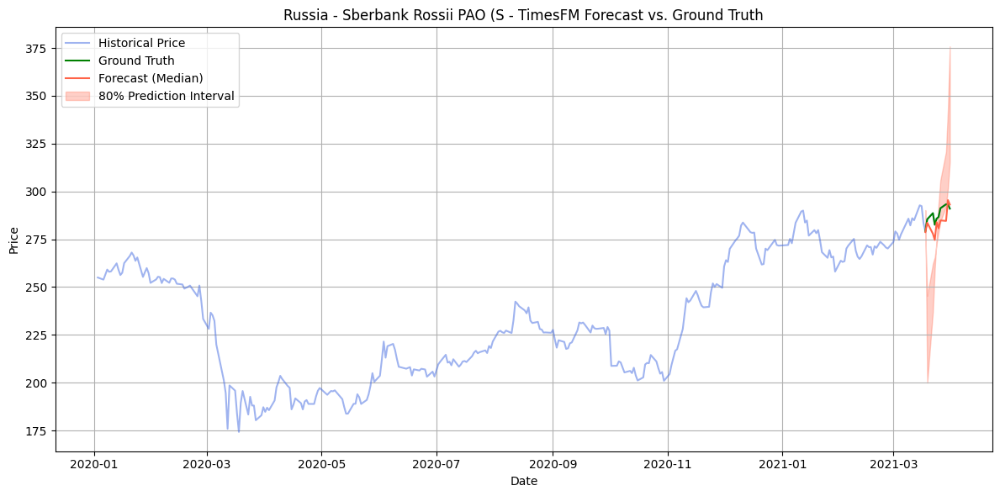

Processing: Turkey - Koc Holding AS (KCHOL)
Original length: 305, Trimmed to: 288


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

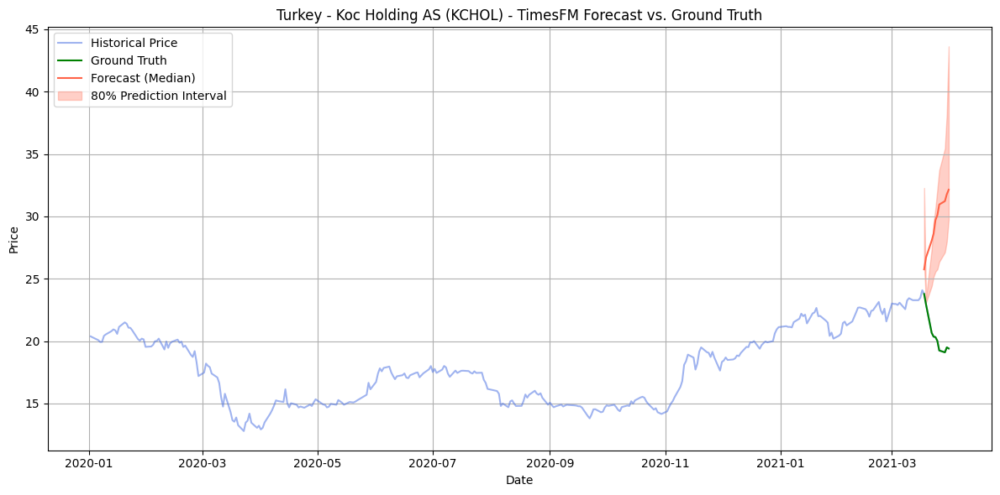

Processing: Egypt - Medinet Nasr Housing (M
Original length: 295, Trimmed to: 288


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

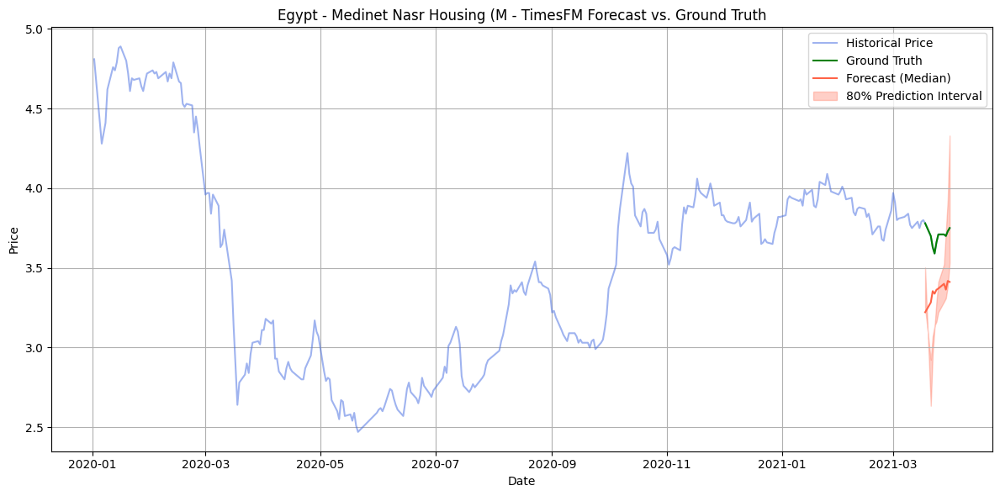

Processing: Brazil - Minerva SABrazil (BEEF
Original length: 299, Trimmed to: 288


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

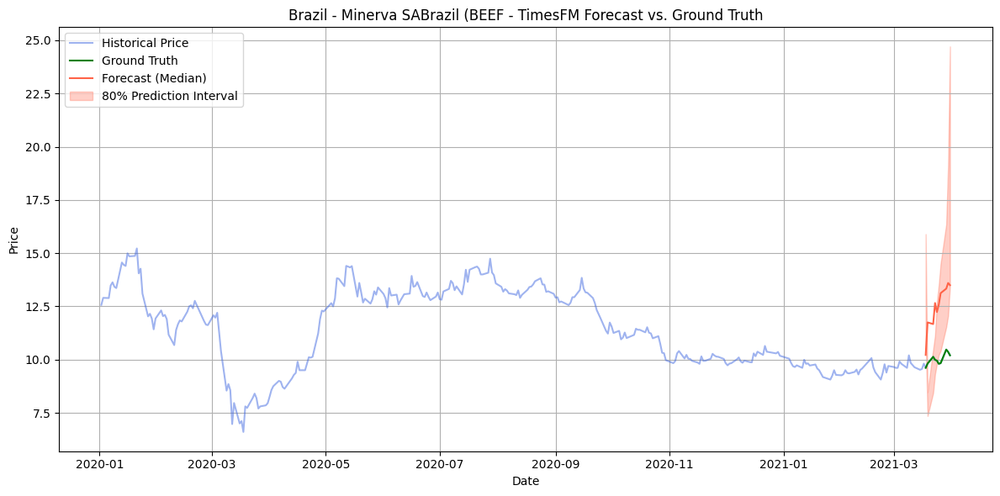

Processing: Argentina - Pampa Energia SA (P
Original length: 290, Trimmed to: 288


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

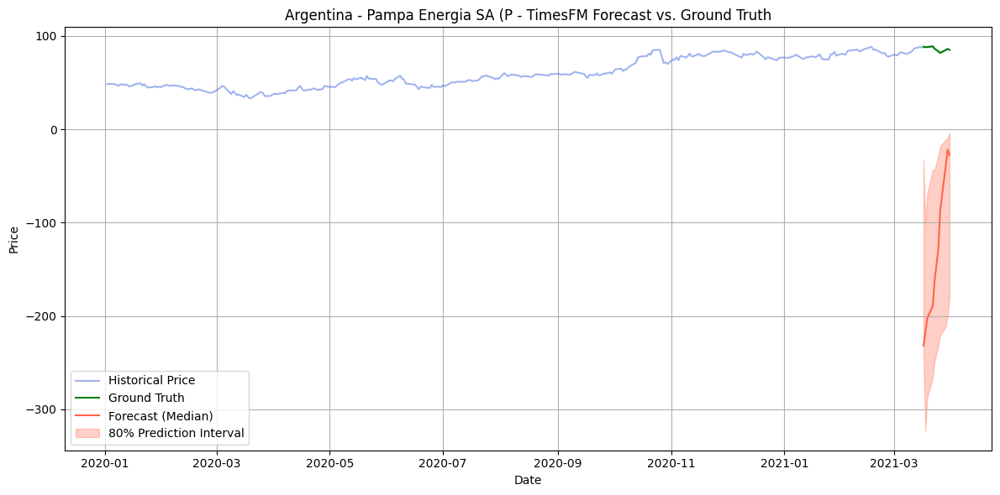

Processing: Colombia - Cementos Argos SA (C
Original length: 293, Trimmed to: 288


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

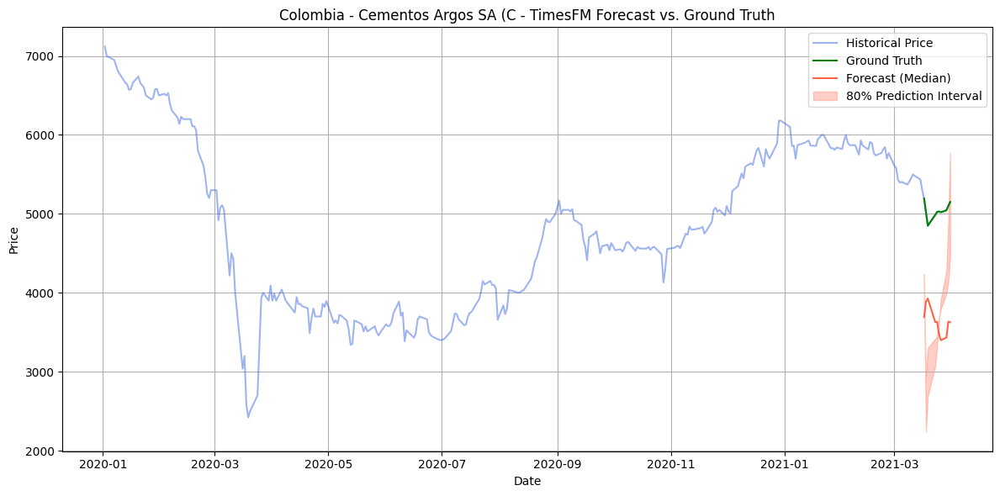

Processing: South Africa - Impala Platinum 
Original length: 304, Trimmed to: 288


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

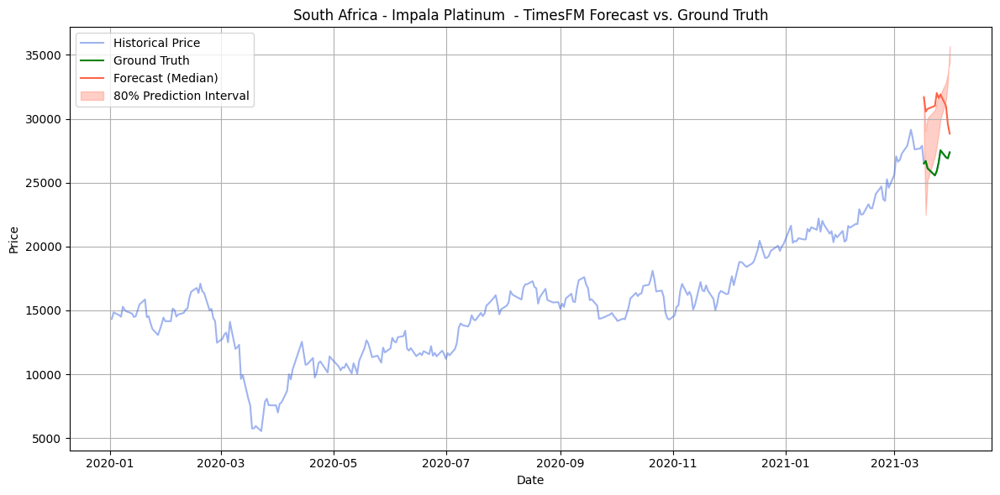

Processing: South Korea - Dongkuk Steel Mil
Original length: 331, Trimmed to: 320


Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

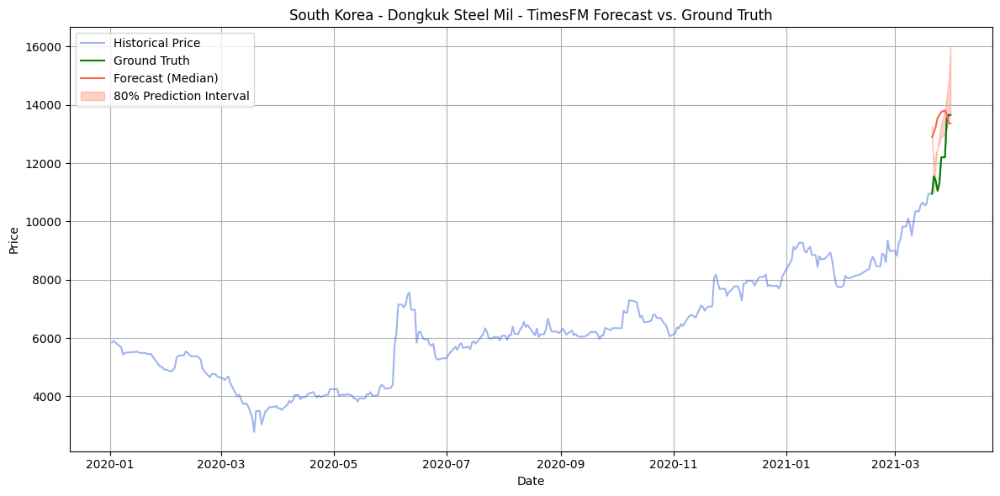

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import timesfm

# 1. Load stock data from Excel
def fetch_stock_data(file_path, sheet_name):
    df = pd.read_excel(file_path, sheet_name=sheet_name)
    df = df[pd.to_datetime(df['Date'], errors='coerce').notna()]
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.set_index('Date')
    df['Price'] = pd.to_numeric(df['Price'], errors='coerce')
    df = df.dropna(subset=['Price'])
    df = df.sort_index()
    return df[['Price']]

# 2. Forecast using TimesFM model
def forecast_with_timesfm(df, prediction_length=10):
    original_len = len(df)
    patch_len = 32
    trimmed_len = original_len - (original_len % patch_len)
    df_trimmed = df[-trimmed_len:]

    print(f"Original length: {original_len}, Trimmed to: {trimmed_len}")

    tfm = timesfm.TimesFm(
        hparams=timesfm.TimesFmHparams(
            backend="cpu",
            per_core_batch_size=32,
            horizon_len=prediction_length,
            #num_layers=50,
            use_positional_embedding=False,
            context_len=trimmed_len,
        ),
        checkpoint=timesfm.TimesFmCheckpoint(
            huggingface_repo_id="google/timesfm-1.0-200m-pytorch"),
    )

    forecast_input = [df_trimmed['Price'].values]
    frequency_input = [0]

    point_forecast, quantile_forecast = tfm.forecast(
        forecast_input,
        freq=frequency_input,
    )

    # Slice to match length of prediction (safety check)
    median = np.array(point_forecast[0])[:prediction_length]
    quantiles = np.array(quantile_forecast[0])  # shape: (num_quantiles, horizon_len)

    if quantiles.shape[1] < prediction_length:
        raise ValueError(f"Quantile forecast returned less steps ({quantiles.shape[1]}) than expected ({prediction_length})")

    low = quantiles[0][:prediction_length]
    high = quantiles[-1][:prediction_length]

    return median, low, high


# 3. Main routine
def main():
    file_path = '/content/2020Q1Q2Q3Q4-2021Q1.xlsx'
    prediction_length = 10
    sheet_names = pd.ExcelFile(file_path).sheet_names

    for sheet_name in sheet_names:
        print(f"Processing: {sheet_name}")
        df = fetch_stock_data(file_path, sheet_name)

        # Use all except last 10 as context
        context_df = df[:-prediction_length]
        ground_truth = df[-prediction_length:]

        # Forecast the last 10 days
        median, low, high = forecast_with_timesfm(context_df, prediction_length=prediction_length)
        forecast_dates = ground_truth.index  # use real timestamps of last 10 days

        plt.figure(figsize=(12, 6))
        plt.plot(df.index, df['Price'], label='Historical Price', color='royalblue', alpha=0.5)
        plt.plot(forecast_dates, ground_truth['Price'].values, label='Ground Truth', color='green')
        plt.plot(forecast_dates, median, label='Forecast (Median)', color='tomato')
        plt.fill_between(forecast_dates, low, high, alpha=0.3, color='tomato', label='80% Prediction Interval')
        plt.title(f"{sheet_name} - TimesFM Forecast vs. Ground Truth")
        plt.xlabel("Date")
        plt.ylabel("Price")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()


if __name__ == '__main__':
    main()


In [ ]:
# prompt: connet to the groq api and run a prompt on llama 7



import os
from groq import Groq

# Replace 'YOUR_GROQ_API_KEY' with your actual API key from Groq
# It's recommended to store API keys securely, e.g., using environment variables
# If you're in Colab, you can use secrets or environment variables.
# For simplicity here, we are putting it directly, but avoid this in production.
os.environ["GROQ_API_KEY"] = "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" # Replace with your actual API key

client = Groq(
    api_key=os.environ.get("GROQ_API_KEY"),
)

completion = client.chat.completions.create(
    model="llama3-8b-8192", # Using llama3-8b as llama 7b might refer to an older model or a different distribution
    messages=[
        {
            "role": "user",
            "content": "Explain the concept of a large language model.",
        },
    ],
    temperature=0.7,
    max_tokens=1024,
    top_p=1,
    stream=True,
    stop=None,
)

for chunk in completion:
    print(chunk.choices[0].delta.content or "", end="")

A large language model (LLM) is a type of artificial intelligence (AI) model that is trained on a massive dataset of text to generate and understand human-like language. These models are designed to process and analyze vast amounts of text data, learning patterns, relationships, and nuances of language to generate coherent and meaningful text.

Key characteristics of large language models:

1. **Scale**: LLMs are trained on massive datasets, often consisting of billions of words, to learn patterns and relationships in language.
2. **Depth**: These models have multiple layers of neural networks, which enable them to process and analyze complex linguistic structures, such as syntax, semantics, and pragmatics.
3. **Contextual understanding**: LLMs are designed to understand the context in which language is used, allowing them to generate text that is relevant, informative, and engaging.
4. **Generative capabilities**: LLMs can generate text, including sentences, paragraphs, and even entir

Processing: Russia - Sberbank Rossii PAO (S
Asking Llama 3 to predict the next 10 values for Russia - Sberbank Rossii PAO (S...


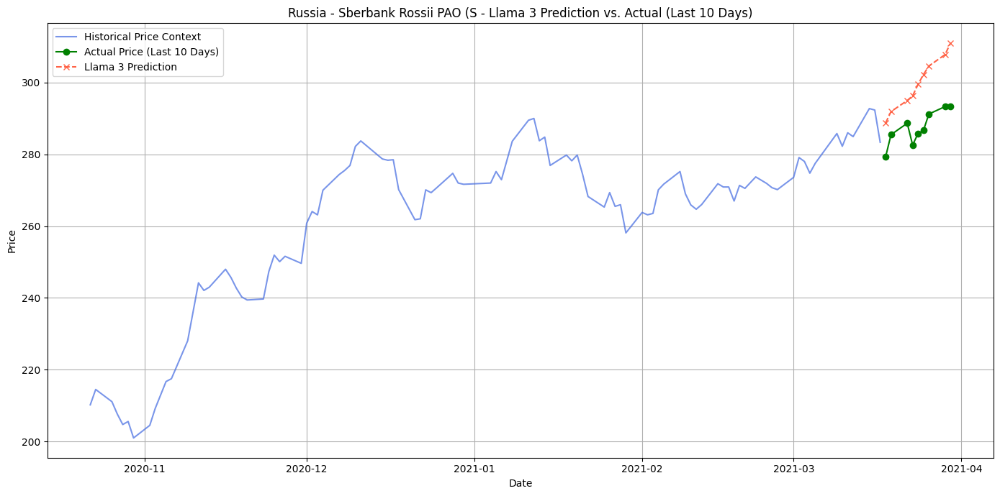

Processing: Turkey - Koc Holding AS (KCHOL)
Asking Llama 3 to predict the next 10 values for Turkey - Koc Holding AS (KCHOL)...


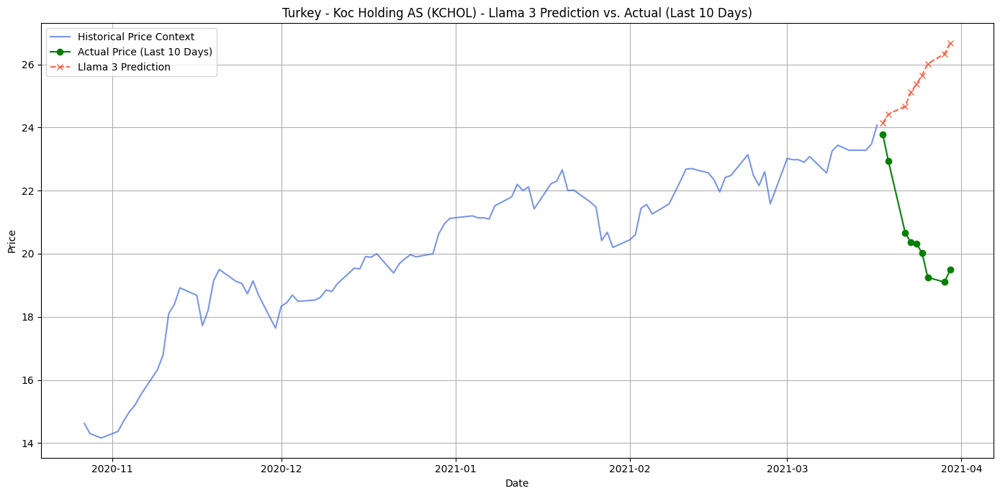

Processing: Egypt - Medinet Nasr Housing (M
Asking Llama 3 to predict the next 10 values for Egypt - Medinet Nasr Housing (M...


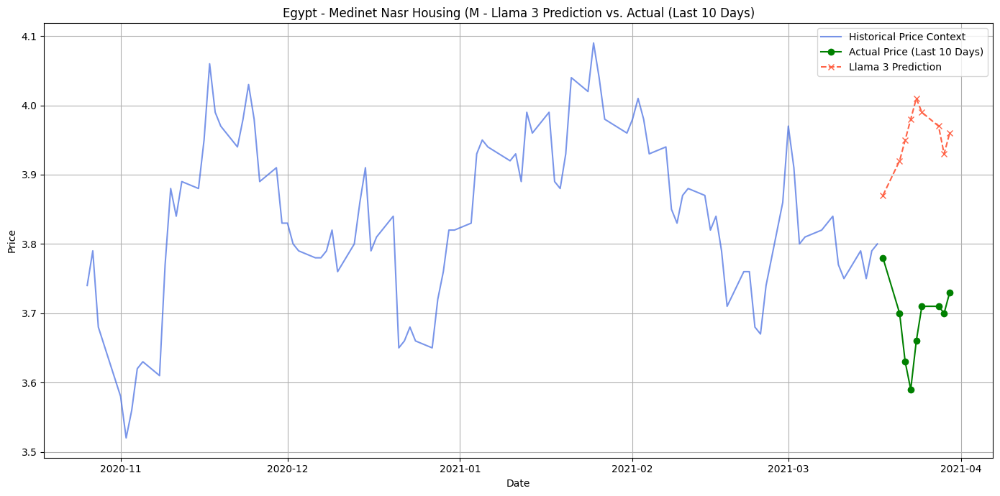

Processing: Brazil - Minerva SABrazil (BEEF
Asking Llama 3 to predict the next 10 values for Brazil - Minerva SABrazil (BEEF...


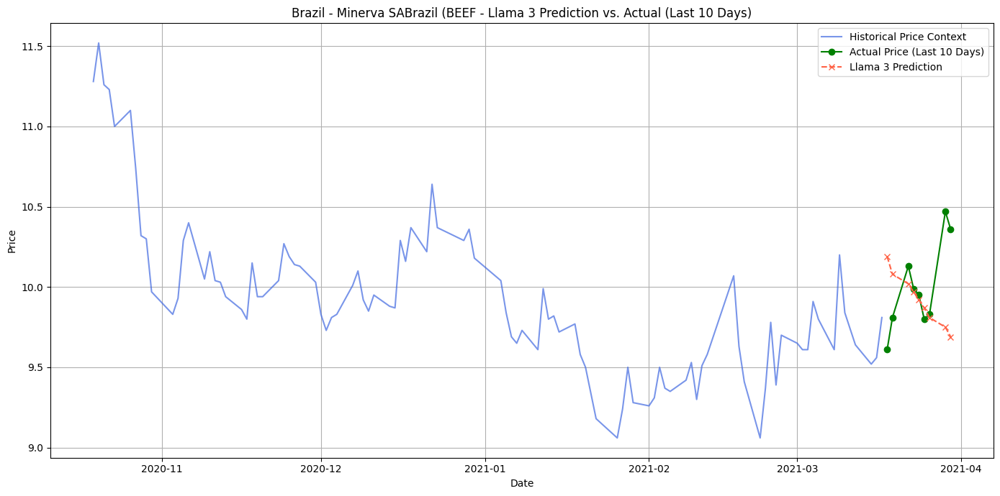

Processing: Argentina - Pampa Energia SA (P
Asking Llama 3 to predict the next 10 values for Argentina - Pampa Energia SA (P...


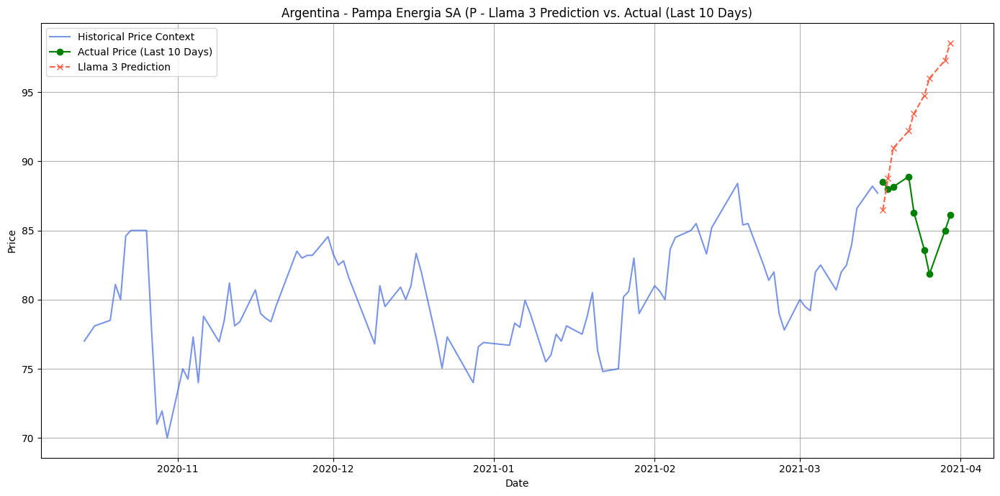

Processing: Colombia - Cementos Argos SA (C
Asking Llama 3 to predict the next 10 values for Colombia - Cementos Argos SA (C...


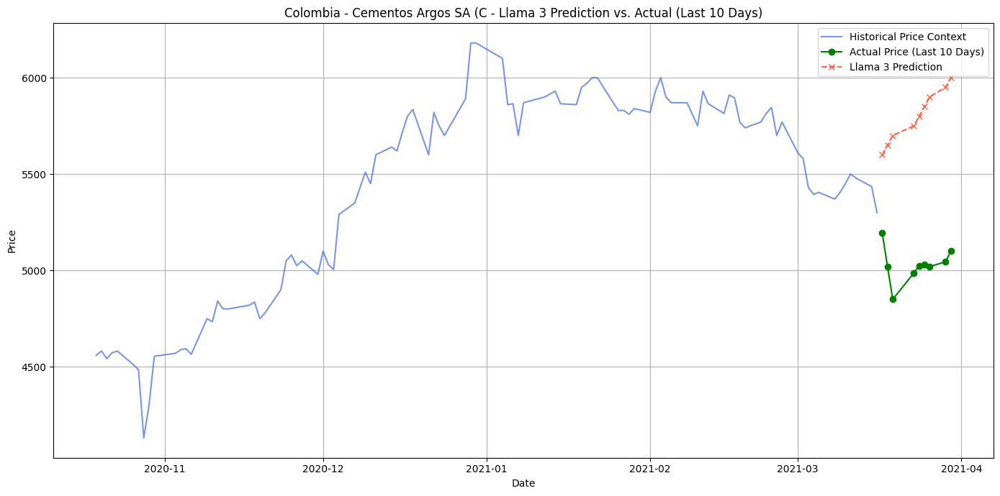

Processing: South Africa - Impala Platinum 
Asking Llama 3 to predict the next 10 values for South Africa - Impala Platinum ...


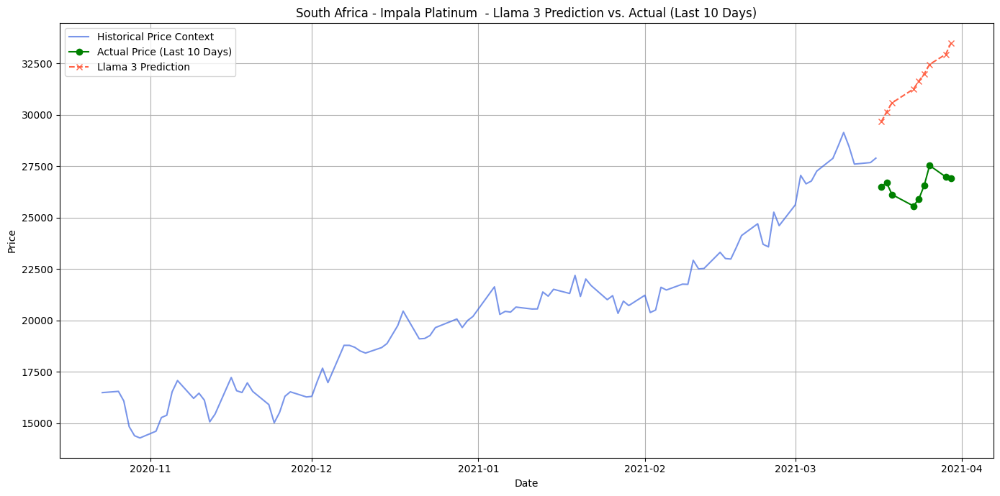

Processing: South Korea - Dongkuk Steel Mil
Asking Llama 3 to predict the next 10 values for South Korea - Dongkuk Steel Mil...


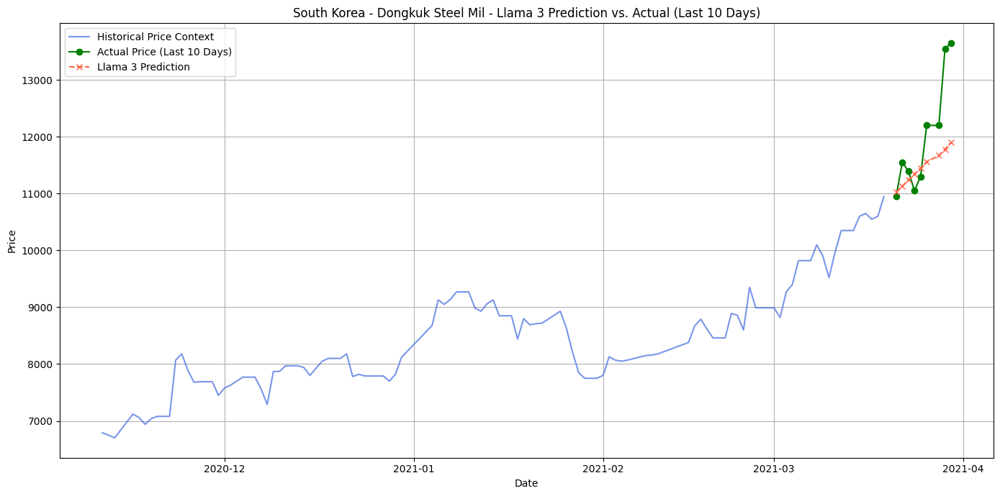

In [ ]:
# prompt: load price column of dfs in xls to a prompt and ask llama to predict values for last then days and then show the actual value for that last 10 days and the prediction on one diagram

import pandas as pd
import matplotlib.pyplot as plt
# Main routine to process each stock and compare Llama prediction with actuals for the last 10 days
def main():
    file_path = '/content/2020Q1Q2Q3Q4-2021Q1.xlsx'
    prediction_length = 10 # Number of future points to predict
    sheet_names = pd.ExcelFile(file_path).sheet_names

    # Initialize Groq client
    if "GROQ_API_KEY" not in os.environ or not os.environ["GROQ_API_KEY"]:
        print("Error: GROQ_API_KEY environment variable not set.")
        print("Please set your Groq API key before running this section.")
        return

    global client # Use the global client initialized previously
    try:
        client = Groq(api_key=os.environ["GROQ_API_KEY"])
    except Exception as e:
         print(f"Failed to initialize Groq client: {e}")
         print("Please check your API key.")
         return


    for sheet_name in sheet_names:
        print(f"Processing: {sheet_name}")
        df = fetch_stock_data(file_path, sheet_name)

        if df.empty:
            print(f"No valid price data for {sheet_name}. Skipping.")
            continue

        # Separate the last `prediction_length` days as ground truth
        if len(df) <= prediction_length:
            print(f"Not enough data for {sheet_name} to forecast {prediction_length} days. Skipping.")
            continue

        historical_df = df[:-prediction_length]
        ground_truth_df = df[-prediction_length:]

        # Use a recent subset of historical data as context for Llama
        # Adjust context_length as needed, ensure it's less than len(historical_df)
        context_length = min(100, len(historical_df)) # Use up to 100 recent points, or all if less than 100
        historical_prices = historical_df['Price'].tail(context_length).tolist()
        historical_prices_text = ', '.join(map(str, historical_prices))

        print(f"Asking Llama 3 to predict the next {prediction_length} values for {sheet_name}...")
        predicted_values = predict_with_llama(historical_prices_text, prediction_length)

        if not predicted_values:
            print(f"Failed to get predictions for {sheet_name}. Skipping plot.")
            continue

        # Ensure the number of predictions matches the prediction_length requested
        # If Llama returned fewer, pad with NaNs or just use the dates corresponding to available predictions
        if len(predicted_values) != prediction_length:
             print(f"Warning: Llama returned {len(predicted_values)} predictions, expected {prediction_length} for {sheet_name}.")
             # Trim ground truth dates to match the number of predictions received
             forecast_dates = ground_truth_df.index[:len(predicted_values)]
             ground_truth_values = ground_truth_df['Price'].values[:len(predicted_values)]
        else:
             forecast_dates = ground_truth_df.index
             ground_truth_values = ground_truth_df['Price'].values


        # Plotting
        plt.figure(figsize=(14, 7))

        # Plot historical data (consider plotting a recent portion for clarity)
        # Plot the last part of historical data leading into the prediction window
        plt.plot(historical_df.index[-context_length:], historical_df['Price'].tail(context_length), label='Historical Price Context', color='royalblue', alpha=0.7)

        # Plot the actual values for the last 10 days (ground truth)
        plt.plot(forecast_dates, ground_truth_values, label='Actual Price (Last 10 Days)', color='green', marker='o')

        # Plot the predicted values
        if predicted_values:
            plt.plot(forecast_dates, predicted_values, label='Llama 3 Prediction', color='tomato', linestyle='--', marker='x')

        plt.title(f"{sheet_name} - Llama 3 Prediction vs. Actual (Last {prediction_length} Days)")
        plt.xlabel("Date")
        plt.ylabel("Price")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

if __name__ == '__main__':
    main()
